# Classification of Oil Wells in the DSEATS Field Using Machine Learning

## Project Overview
This notebook presents our analysis and classification of 20 oil wells from the DSEATS conceptual field. The objective is to develop machine learning models that accurately categorize wells based on seven key petroleum engineering parameters using historical production data.

### Key Classification Tasks:
1. **Reservoir Identification** - Match wells to their producing reservoirs
2. **Reservoir Type** - Classify as saturated or undersaturated
3. **Well Type** - Distinguish between naturally flowing (NF) and gas lifted (GL) wells
4. **Production Type** - Identify steady vs unsteady production patterns
5. **Formation GOR Trend** - Analyze gas-oil ratio behavior relative to solution GOR
6. **Watercut Trend** - Characterize water production trends
7. **Oil Productivity Index** - Evaluate well productivity trends over time

## 1. Import Libraries and Initialize Environment

We begin by importing essential libraries for data analysis, visualization, and machine learning. The workflow includes pandas for data manipulation, matplotlib/seaborn for visualization, scikit-learn for ML modeling, and various utilities for numerical computations.

In [ ]:
# Import data manipulation and analysis libraries
import pandas as pd
import numpy as np
from datetime import datetime

# Visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Machine learning libraries
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix
import xgboost as xgb

# Utility libraries
import re
import math
import time
import warnings
warnings.filterwarnings('ignore')
from google.colab import files

## 2. Data Loading

Load the three primary datasets provided for the competition:
- **Wells dataset**: Historical production data for 20 wells including pressures, temperatures, and cumulative production
- **Reservoir information**: Key reservoir properties including initial/current pressures and PVT properties
- **Classification parameters**: Reference table showing the expected classification categories
- **Sample submission**: Template for the final classification results

In [ ]:
# Load all datasets
well_data = pd.read_csv('https://raw.githubusercontent.com/Husayn01/SPE-DSEATS-Africa-Datathon/refs/heads/main/data/spe_africa_dseats_datathon_2025_wells_dataset.csv')
reservoir_info = pd.read_csv('https://raw.githubusercontent.com/Husayn01/SPE-DSEATS-Africa-Datathon/refs/heads/main/data/reservoir_info.csv')
class_param = pd.read_csv('https://raw.githubusercontent.com/Husayn01/SPE-DSEATS-Africa-Datathon/refs/heads/main/data/classification_parameters.csv')
sample_sub = pd.read_csv('https://raw.githubusercontent.com/Husayn01/SPE-DSEATS-Africa-Datathon/refs/heads/main/data/Innovisors_DSEATS_Africa_2025_Classification.csv')

In [ ]:
# Display sample submission format to understand expected output structure
sample_sub.head(4)

,Well,Reservoir Name,Reservoir Type,Well Type,Production Type,Formation GOR Trend,Watercut Trend,Oil Productivity Index
0,1,KEMA,Saturated,GL,Unsteady,aSolGOR,Flat,Decr
1,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# View classification parameters to understand the categories we need to predict
class_param

,Reservoir Name,Reservoir Type,Well Type,Production Type,Formation GOR Trend,Watercut Trend,Oil Productivity Index Trend
0,ACHI,Saturated,NF,Steady,aSolGOR,Flat,Flat
1,KEMA,Undersat,GL,Unsteady,bSolGOR,Incr,Incr
2,MAKO,NaN,NaN,NaN,Combo,Decr,Decr
3,DEPU,NaN,NaN,NaN,NaN,Combo,Combo
4,JANI,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Examine reservoir properties
reservoir_info

,Reservoir Name,Initial Reservoir Pressure (PSI),Bubble Point Pressure (PSI),Current Average Reservoir Pressure (PSI),Solution Gas-Oil-Ratio (SCF/BBL),Formation Volume Factor (RB/STB)
0,ACHI,"3,500","3,300","2,700",800,1.20
1,KEMA,"4,200","4,000","3,900",600,1.45
2,MAKO,"3,500","3,500","3,000",500,1.15
3,DEPU,"2,800","2,800","2,400","1,200",1.37
4,JANI,"4,500","4,300","4,200","1,000",1.30


In [ ]:
# Check data types in reservoir info to identify necessary conversions
reservoir_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 6 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   Reservoir Name                            5 non-null      object 
 1   Initial Reservoir Pressure (PSI)          5 non-null      object 
 2   Bubble Point Pressure (PSI)               5 non-null      object 
 3   Current Average Reservoir Pressure (PSI)  5 non-null      object 
 4   Solution Gas-Oil-Ratio (SCF/BBL)          5 non-null      object 
 5   Formation Volume Factor (RB/STB)          5 non-null      float64
dtypes: float64(1), object(5)
memory usage: 372.0+ bytes


## 3. Data Preprocessing

### 3.1 Reservoir Data Cleaning
The reservoir data contains numeric values stored as strings with formatting characters (commas). We need to clean and convert these to proper numeric types for calculations.

In [ ]:
# Get list of numeric columns (excluding reservoir name)
cols = reservoir_info.columns.drop('Reservoir Name').to_list()
cols

['Initial Reservoir Pressure (PSI)',
 'Bubble Point Pressure (PSI)',
 'Current Average Reservoir Pressure (PSI)',
 'Solution Gas-Oil-Ratio (SCF/BBL)',
 'Formation Volume Factor (RB/STB)']

In [ ]:
# Function to clean numeric columns (handles commas, spaces, etc.)
def clean_numeric_column(series):
    """
    Clean numeric data by removing formatting characters.
    This handles common data entry formats like "1,000" or "1 000"
    """
    return (series.astype(str)
            .str.replace(',', '')  # Remove thousand separators
            .str.replace(' ', '')  # Remove spaces
            .str.strip()          # Remove leading/trailing whitespace
    )

In [ ]:
# Apply cleaning to all numeric columns in reservoir info
for col in cols:
    reservoir_info[col] = pd.to_numeric(clean_numeric_column(reservoir_info[col]), errors='coerce')

In [ ]:
# Verify data types after conversion
print("Data types after conversion:")
print(reservoir_info.dtypes)

Data types after conversion:
Reservoir Name                               object
Initial Reservoir Pressure (PSI)              int64
Bubble Point Pressure (PSI)                   int64
Current Average Reservoir Pressure (PSI)      int64
Solution Gas-Oil-Ratio (SCF/BBL)              int64
Formation Volume Factor (RB/STB)            float64
dtype: object


### 3.2 Well Production Data Cleaning
The well production dataset requires similar cleaning, particularly for pressure and cumulative production columns which may contain formatting characters.

In [ ]:
# Examine well data structure and identify columns needing conversion
well_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7955 entries, 0 to 7954
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   PROD_DATE                             7955 non-null   object 
 1   WELL_NAME                             7955 non-null   object 
 2   ON_STREAM_HRS                         7955 non-null   float64
 3   BOTTOMHOLE_FLOWING_PRESSURE (PSI)     7955 non-null   object 
 4   DOWNHOLE_TEMPERATURE (deg F)          7955 non-null   float64
 5   ANNULUS_PRESS (PSI)                   7955 non-null   object 
 6   CHOKE_SIZE (%)                        7955 non-null   float64
 7   WELL_HEAD_PRESSURE (PSI)              7955 non-null   object 
 8   WELL_HEAD_TEMPERATURE (deg F)         7955 non-null   float64
 9   CUMULATIVE_OIL_PROD (STB)             7955 non-null   object 
 10  CUMULATIVE_FORMATION_GAS_PROD (MSCF)  7955 non-null   object 
 11  CUMULATIVE_TOTAL_

In [ ]:
# Define columns that need numeric conversion
# Pressure measurements typically stored with commas
pressure_cols = ['BOTTOMHOLE_FLOWING_PRESSURE (PSI)', 'ANNULUS_PRESS (PSI)', 'WELL_HEAD_PRESSURE (PSI)']

# Cumulative production values often have thousand separators
prod_cols = ['CUMULATIVE_OIL_PROD (STB)', 'CUMULATIVE_FORMATION_GAS_PROD (MSCF)',
             'CUMULATIVE_TOTAL_GAS_PROD (MSCF)', 'CUMULATIVE_WATER_PROD (BBL)']

# Use the same cleaning function defined earlier
def clean_numeric_column(series):
    """Reusing the cleaning function for consistency"""
    return (series.astype(str)
            .str.replace(',', '')
            .str.replace(' ', '')
            .str.strip()
    )

In [ ]:
# Clean and convert production columns to numeric
for col in prod_cols:
    well_data[col] = pd.to_numeric(clean_numeric_column(well_data[col]), errors='coerce')

In [ ]:
# Clean and convert pressure columns to numeric
for col in pressure_cols:
    well_data[col] = pd.to_numeric(clean_numeric_column(well_data[col]), errors='coerce')

In [ ]:
# Convert date column to datetime format for time series analysis
well_data['PROD_DATE'] = pd.to_datetime(well_data['PROD_DATE'], errors='coerce')

In [ ]:
# Verify final data types
print("Data types after conversion:")
print(well_data.dtypes)

Data types after conversion:
PROD_DATE                               datetime64[ns]
WELL_NAME                                       object
ON_STREAM_HRS                                  float64
BOTTOMHOLE_FLOWING_PRESSURE (PSI)                int64
DOWNHOLE_TEMPERATURE (deg F)                   float64
ANNULUS_PRESS (PSI)                            float64
CHOKE_SIZE (%)                                 float64
WELL_HEAD_PRESSURE (PSI)                       float64
WELL_HEAD_TEMPERATURE (deg F)                  float64
CUMULATIVE_OIL_PROD (STB)                        int64
CUMULATIVE_FORMATION_GAS_PROD (MSCF)             int64
CUMULATIVE_TOTAL_GAS_PROD (MSCF)                 int64
CUMULATIVE_WATER_PROD (BBL)                      int64
dtype: object


## 4. Exploratory Data Analysis (EDA)

### 4.1 Data Quality and Range Validation
Before proceeding with analysis, we validate that the converted data falls within realistic petroleum engineering ranges.

In [ ]:
# Validate pressure ranges
print("\nPressure range validation:")
for col in pressure_cols:
    print(f"{col}: {well_data[col].min():.1f} - {well_data[col].max():.1f}")

print("\nProduction range validation:")
for col in prod_cols:
    print(f"{col}: {well_data[col].min():.1f} - {well_data[col].max():.1f}")


Pressure range validation:
BOTTOMHOLE_FLOWING_PRESSURE (PSI): 0.0 - 4096.0
ANNULUS_PRESS (PSI): 0.0 - 1639.0
WELL_HEAD_PRESSURE (PSI): 0.0 - 1787.8

Production range validation:
CUMULATIVE_OIL_PROD (STB): 0.0 - 1129301.0
CUMULATIVE_FORMATION_GAS_PROD (MSCF): 0.0 - 1458660.0
CUMULATIVE_TOTAL_GAS_PROD (MSCF): 0.0 - 1458660.0
CUMULATIVE_WATER_PROD (BBL): 0.0 - 1499262.0


In [ ]:
# Display cleaned well data sample
well_data.head(4)

,PROD_DATE,WELL_NAME,ON_STREAM_HRS,BOTTOMHOLE_FLOWING_PRESSURE (PSI),DOWNHOLE_TEMPERATURE (deg F),ANNULUS_PRESS (PSI),CHOKE_SIZE (%),WELL_HEAD_PRESSURE (PSI),WELL_HEAD_TEMPERATURE (deg F),CUMULATIVE_OIL_PROD (STB),CUMULATIVE_FORMATION_GAS_PROD (MSCF),CUMULATIVE_TOTAL_GAS_PROD (MSCF),CUMULATIVE_WATER_PROD (BBL)
0,2014-02-15,Well_#1,0.0,4050,189.866,0.0,1.17951,482.460,50.864,0,0,0,0
1,2014-02-16,Well_#1,0.0,3961,189.945,0.0,2.99440,328.601,47.668,0,0,0,0
2,2014-02-17,Well_#1,0.0,3961,190.004,0.0,1.90349,387.218,48.962,0,0,0,0
3,2014-02-18,Well_#1,0.0,3964,190.020,0.0,0.00000,308.980,46.636,0,0,0,0


In [ ]:
# Check for missing values that might affect analysis
missing_count = well_data.isnull().sum()
missing_count

,0
PROD_DATE,0
WELL_NAME,0
ON_STREAM_HRS,0
BOTTOMHOLE_FLOWING_PRESSURE (PSI),0
DOWNHOLE_TEMPERATURE (deg F),0
ANNULUS_PRESS (PSI),0
CHOKE_SIZE (%),0
WELL_HEAD_PRESSURE (PSI),0
WELL_HEAD_TEMPERATURE (deg F),0
CUMULATIVE_OIL_PROD (STB),0


In [ ]:
# Statistical summary of all columns
well_data.describe(include="all")

,PROD_DATE,WELL_NAME,ON_STREAM_HRS,BOTTOMHOLE_FLOWING_PRESSURE (PSI),DOWNHOLE_TEMPERATURE (deg F),ANNULUS_PRESS (PSI),CHOKE_SIZE (%),WELL_HEAD_PRESSURE (PSI),WELL_HEAD_TEMPERATURE (deg F),CUMULATIVE_OIL_PROD (STB),CUMULATIVE_FORMATION_GAS_PROD (MSCF),CUMULATIVE_TOTAL_GAS_PROD (MSCF),CUMULATIVE_WATER_PROD (BBL)
count,7955,7955,7955.000000,7955.000000,7955.000000,7955.000000,7955.000000,7955.000000,7955.000000,7.955000e+03,7.955000e+03,7.955000e+03,7.955000e+03
unique,NaN,20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,Well_#20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,820,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,2013-08-26 16:25:49.516027648,NaN,21.623497,2613.811816,168.757429,471.339542,56.155295,212.574151,86.836365,1.725855e+05,1.456235e+05,1.811090e+05,1.427100e+05
min,2011-02-17 00:00:00,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2012-08-02 00:00:00,NaN,24.000000,2195.000000,150.228500,4.199000,28.130855,68.661500,80.677500,4.769100e+04,3.854150e+04,4.152100e+04,8.907000e+03
50%,2013-06-25 00:00:00,NaN,24.000000,2465.000000,158.624000,301.247000,51.068030,113.718000,88.364000,1.092950e+05,1.016100e+05,1.171430e+05,4.651700e+04
75%,2014-10-01 00:00:00,NaN,24.000000,3067.000000,202.600000,981.329000,99.800950,161.176500,96.770500,2.424885e+05,1.991035e+05,2.707540e+05,1.949390e+05
max,2016-08-12 00:00:00,NaN,25.000000,4096.000000,212.153000,1639.040000,100.000000,1787.760000,182.157000,1.129301e+06,1.458660e+06,1.458660e+06,1.499262e+06


In [ ]:
# Verify production date range
print("Production date range:")
print("Min date:", well_data['PROD_DATE'].min())
print("Max date:", well_data['PROD_DATE'].max())

Production date range:
Min date: 2011-02-17 00:00:00
Max date: 2016-08-12 00:00:00


### 4.2 Reservoir Pressure Analysis
Understanding reservoir pressure relationships is crucial for identifying reservoir type (saturated vs undersaturated) and current depletion state.

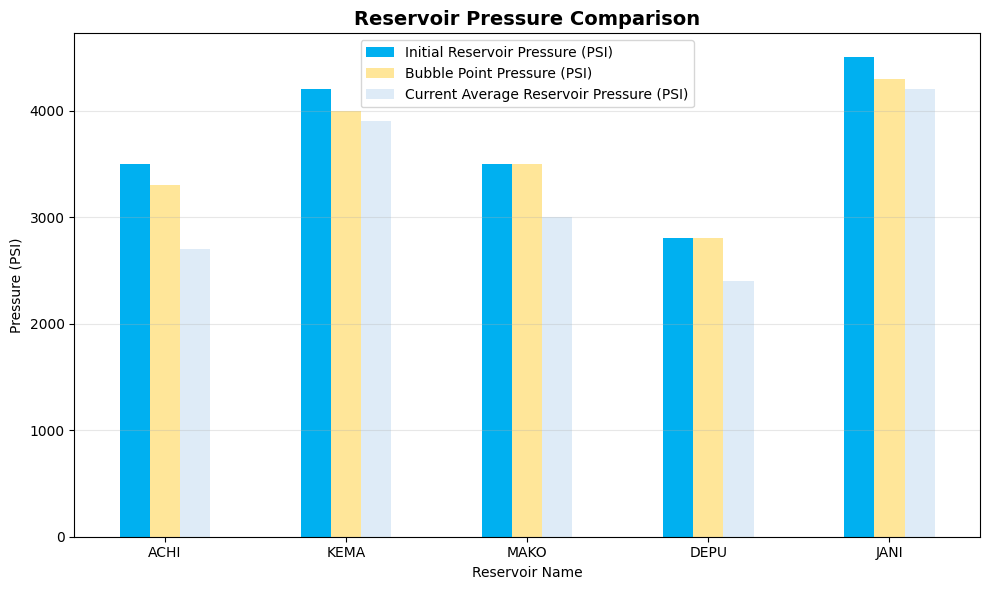

In [ ]:
# Visualize pressure relationships across reservoirs using theme colors
pressure_colors = ['#00B0F0', '#FFE699', '#DEEBF7']

reservoir_info.set_index('Reservoir Name')[[
    'Initial Reservoir Pressure (PSI)',
    'Bubble Point Pressure (PSI)',
    'Current Average Reservoir Pressure (PSI)'
]].plot(
    kind='bar',
    figsize=(10, 6),
    color=pressure_colors
)

plt.title('Reservoir Pressure Comparison', fontsize=14, fontweight='bold')
plt.ylabel('Pressure (PSI)')
plt.xticks(rotation=0)
plt.grid(True, axis='y', alpha=0.3)
plt.tight_layout()
plt.show()


JANI reservoir stands out with the highest pressures across all three measurements. KEMA follows as the second highest. MAKO and DEPU shows a unique characteristic where its initial pressure and bubble point pressure are essentially equal, suggesting these reservoirs started at saturation conditions in constrast to that of JANI, ACHI and KEMA

### 4.3 Reservoir Depletion Analysis
Calculate pressure depletion

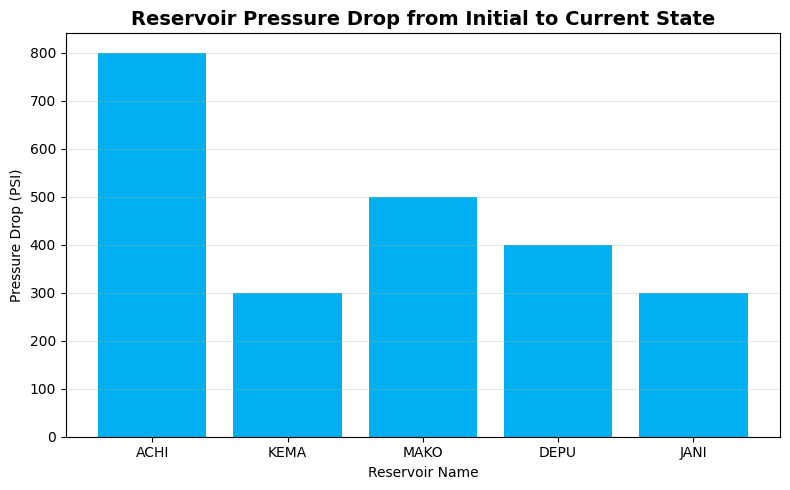

In [ ]:
# Calculate pressure drop
reservoir_info['Pressure Drop'] = reservoir_info['Initial Reservoir Pressure (PSI)'] - reservoir_info['Current Average Reservoir Pressure (PSI)']

# Plot pressure drop
plt.figure(figsize=(8, 5))
plt.bar(reservoir_info['Reservoir Name'],
        reservoir_info['Pressure Drop'],
        color='#00B0F0')

plt.title('Reservoir Pressure Drop from Initial to Current State', fontsize=14, fontweight='bold')
plt.ylabel('Pressure Drop (PSI)')
plt.xlabel('Reservoir Name')
plt.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

ACHI has experienced the most significant pressure drop at 800 PSI, which represents a substantial depletion from its original state. MAKO shows the second-largest drop at 500 PSI, while DEPU has declined by 400 PSI. Interestingly, KEMA and JANI show the smallest pressure drops at 300 PSI each, suggesting these reservoirs have maintained their pressure better over time, possibly due to strong aquifer support, lower production rates, or gas injection programs.

### 4.4 PVT Property Relationships
Analyze the relationship between solution gas-oil ratio (GOR) and formation volume factor (FVF), which are key indicators of fluid properties.

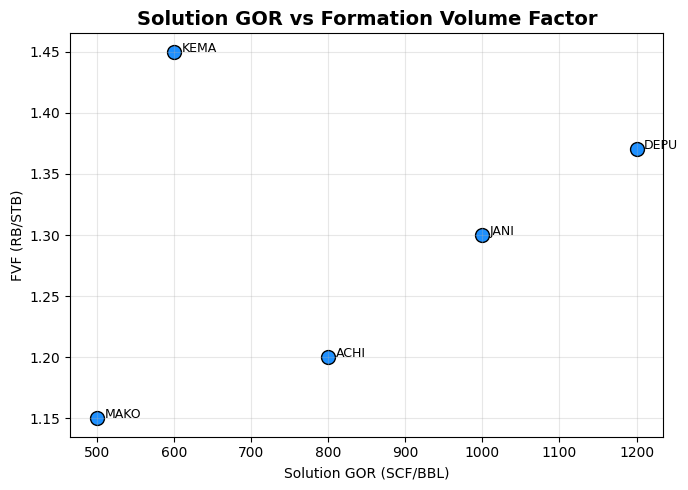

In [ ]:
# Scatter plot of PVT properties
plt.figure(figsize=(7, 5))
plt.scatter(reservoir_info['Solution Gas-Oil-Ratio (SCF/BBL)'],
           reservoir_info['Formation Volume Factor (RB/STB)'],
           s=100, c='dodgerblue', edgecolors='black')

# Add reservoir labels
for i in range(len(reservoir_info)):
    plt.text(reservoir_info['Solution Gas-Oil-Ratio (SCF/BBL)'].iloc[i] + 10,
            reservoir_info['Formation Volume Factor (RB/STB)'][i],
            reservoir_info['Reservoir Name'][i], fontsize=9)

plt.title('Solution GOR vs Formation Volume Factor', fontsize=14, fontweight='bold')
plt.xlabel('Solution GOR (SCF/BBL)')
plt.ylabel('FVF (RB/STB)')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

DEPU exhibits the highest solution GOR at approximately 1,200 SCF/BBL with an FVF of about 1.37 RB/STB. There's a general trend showing that reservoirs with higher solution GOR tend to have higher formation volume factors, which makes sense from a petroleum engineering perspective as more dissolved gas leads to greater oil expansion.  KEMA appears to be an outlier with a relatively high FVF of 1.45 despite having a moderate solution GOR of 600 SCF/BBL, which might indicate unique fluid properties or measurement considerations for this reservoir.

### 4.5 Well Data Distribution Analysis
Examine the data availability across wells to ensure sufficient records for trend analysis.

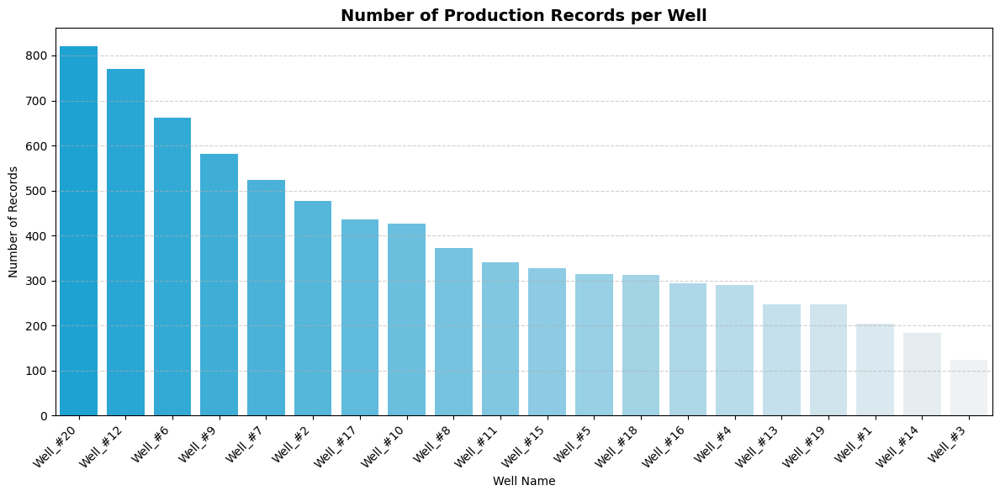

In [ ]:
# Count number of production records per well
well_counts = well_data['WELL_NAME'].value_counts().sort_values(ascending=False)
colors = sns.light_palette("#00B0F0", n_colors=len(well_counts), reverse=True)

# Visualize data distribution
plt.figure(figsize=(12, 6))
sns.barplot(x=well_counts.index, y=well_counts.values, palette=colors)

plt.xlabel('Well Name')
plt.ylabel('Number of Records')
plt.title('Number of Production Records per Well', fontsize=14, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


The data exhibits a distinct descending pattern from left to right, with Well_#20 having the most production records at approximately 820, followed closely by Well_#12 with around 770 records. This suggests these two wells have been monitored most frequently or have been in production for the longest period. The high number of records for these wells provides a robust dataset for analyzing their production behavior and trends over time.

### 4.6 Individual Well Time Series Visualization Functions
Define reusable functions for visualizing time series data to understand production behavior patterns.

In [ ]:
def plot_single_well_time_series(well_data, well_name, columns, title=None, ylabel="Value"):
    """
    Plot time series of specified columns for a single well.

    This function is useful for detailed analysis of individual well behavior,
    allowing engineers to identify anomalies, trends, and operational changes.

    Parameters:
        well_data (pd.DataFrame): DataFrame containing 'PROD_DATE' and 'WELL_NAME'
        well_name (str): Name of the well to plot (e.g., "Well_#1")
        columns (list): List of column names to plot
        title (str): Optional title for the plot
        ylabel (str): Y-axis label
    """
    # Make a copy and ensure date column is datetime
    well_data = well_data.copy()
    well_data['PROD_DATE'] = pd.to_datetime(well_data['PROD_DATE'])
    well_data = well_data.sort_values(['WELL_NAME', 'PROD_DATE'])

    # Filter for selected well
    well_data = well_data[well_data['WELL_NAME'] == well_name]

    if well_data.empty:
        print(f"Warning: No data found for {well_name}")
        return

    # Set default title if not provided
    if title is None:
        title = f"{well_name} - Time Series Plot"

    # Create plot
    plt.figure(figsize=(12, 5))
    for col in columns:
        if col in well_data.columns:
            plt.plot(well_data['PROD_DATE'], well_data[col],
                    label=col, linewidth=1.5, marker='o', markersize=3)
        else:
            print(f"Column '{col}' not found in dataset.")

    plt.title(title, fontsize=14)
    plt.xlabel('Production Date')
    plt.ylabel(ylabel)
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

### Example: Well Pressure Trends
Bottomhole, annulus, and wellhead pressures provide insights into well operating conditions and potential artificial lift usage.

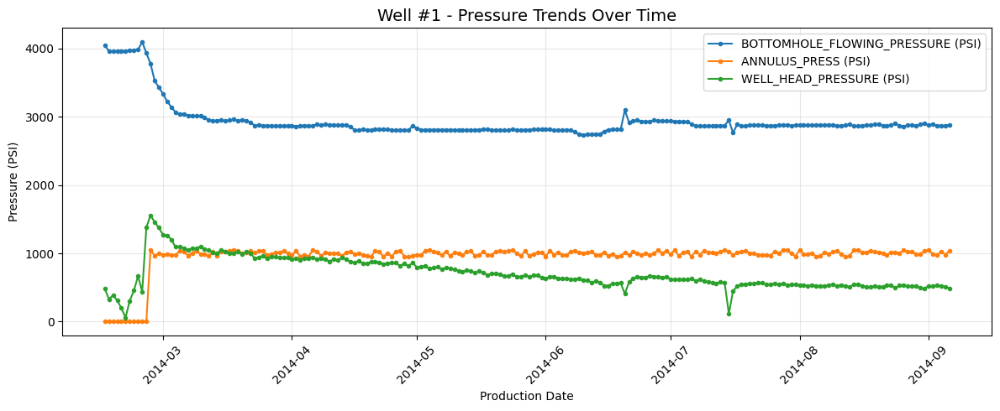

In [ ]:
# Example: Pressure trends for Well #1
plot_single_well_time_series(
    well_data=well_data,
    well_name='Well_#1',
    columns=[
        'BOTTOMHOLE_FLOWING_PRESSURE (PSI)',
        'ANNULUS_PRESS (PSI)',
        'WELL_HEAD_PRESSURE (PSI)'
    ],
    title='Well #1 - Pressure Trends Over Time',
    ylabel='Pressure (PSI)'
)

Looking at Well #1's pressure trends, there's a clear startup phase where bottomhole flowing pressure drops sharply from 4,000 to 3,000 PSI before stabilizing. The annulus pressure consistently runs around 1,000 PSI throughout the production period, suggesting this well might be gas lifted. The wellhead pressure shows some early instability, including periods where it drops to zero, likely indicating shut-ins or operational issues during the initial production phase.

### Example: Cumulative Production Profiles
Cumulative production curves help identify production phases and potential interventions.

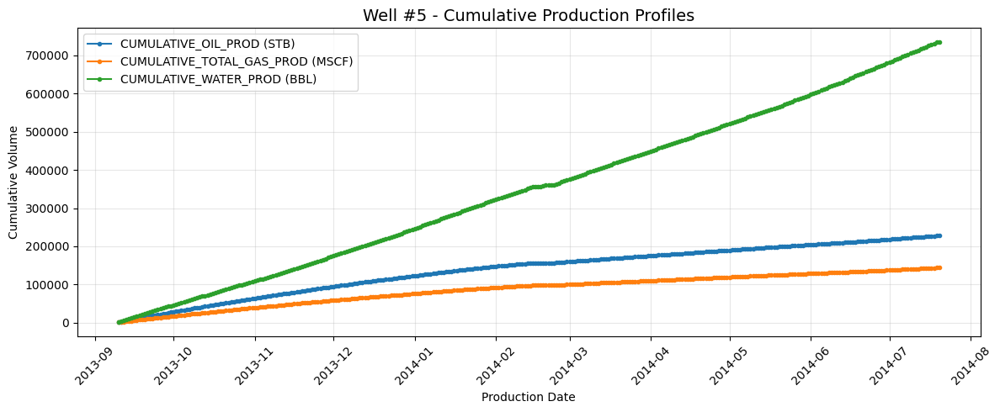

In [ ]:
# Example: Production profiles for Well #5
plot_single_well_time_series(
    well_data=well_data,
    well_name='Well_#5',
    columns=[
        'CUMULATIVE_OIL_PROD (STB)',
        'CUMULATIVE_TOTAL_GAS_PROD (MSCF)',
        'CUMULATIVE_WATER_PROD (BBL)'
    ],
    title='Well #5 - Cumulative Production Profiles',
    ylabel='Cumulative Volume'
)

Well #5's cumulative production profile reveals this is a high water-producing well. Water production dominates significantly, reaching about 750,000 barrels compared to only 225,000 barrels of oil. This gives a very high watercut, suggesting either water breakthrough has occurred or the well is completed in a zone with significant water production.

### Example: Temperature Monitoring
Temperature data helps validate flow conditions and identify potential issues like hydrate formation.

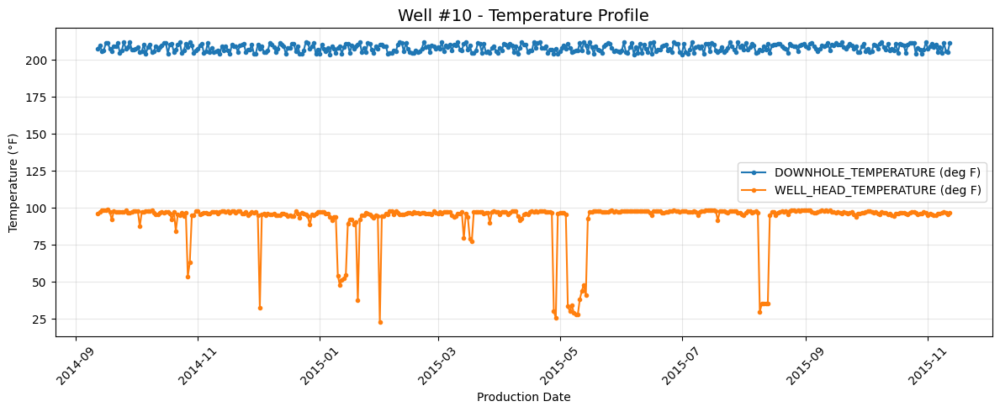

In [ ]:
# Example: Temperature trends for Well #10
plot_single_well_time_series(
    well_data=well_data,
    well_name='Well_#10',
    columns=[
        'DOWNHOLE_TEMPERATURE (deg F)',
        'WELL_HEAD_TEMPERATURE (deg F)'
    ],
    title='Well #10 - Temperature Profile',
    ylabel='Temperature (°F)'
)

Well #10's temperature profile shows stable downhole temperatures around 210°F, but the wellhead temperature exhibits concerning drops to as low as 25°F at several points. These dramatic temperature drops likely indicate well shut-ins or severe flow restrictions, possibly due to operational issues or maintenance periods.

### Example: Choke Management
Choke size variations indicate production optimization efforts and flow control strategies.

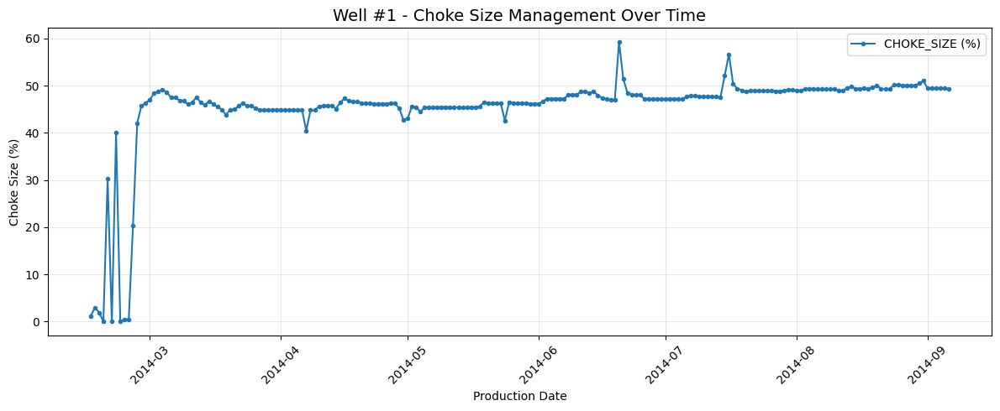

In [ ]:
# Example: Choke size management for Well #1
plot_single_well_time_series(
    well_data=well_data,
    well_name='Well_#1',
    columns=['CHOKE_SIZE (%)'],
    title="Well #1 - Choke Size Management Over Time",
    ylabel="Choke Size (%)"
)

The choke management for Well #1 shows initial operational challenges with highly variable choke settings, including complete closure. After the startup period, the choke stabilized around 45-48% for extended periods, with two deliberate increases to 60% in mid-2014, possibly to boost production or conduct well tests.

### 4.7 Multi-Well Comparison Visualization
To efficiently compare all wells, we create a grid visualization function that shows trends across the entire field.

In [ ]:
def extract_number(well_name):
    """Extract numeric index from well name for proper sorting."""
    match = re.search(r'\d+', str(well_name))
    return int(match.group()) if match else float('inf')

In [ ]:
def plot_well_time_series(well_data, columns, title="Time Series Plot", ylabel="Value",
                         show_well_numbers=True, text_position=(0.02, 0.98), text_fontsize=12):
    """
    Plots time series of specified columns for each well in a grid layout.

    This visualization allows for quick identification of wells with similar
    or anomalous behavior patterns across the field.

    Parameters:
        well_data (pd.DataFrame): Production data
        columns (list): Columns to plot
        title (str): Overall plot title
        ylabel (str): Y-axis label
        show_well_numbers (bool): Display well numbers on subplots
        text_position (tuple): Position for well number labels
        text_fontsize (int): Font size for well numbers
    """
    # Prepare data
    well_data = well_data.copy()
    well_data['PROD_DATE'] = pd.to_datetime(well_data['PROD_DATE'])
    well_data = well_data.sort_values(['WELL_NAME', 'PROD_DATE'])

    # Get sorted well list
    wells = sorted(well_data['WELL_NAME'].dropna().unique(), key=extract_number)
    n_wells = len(wells)

    # Define subplot grid (4 columns for better visibility)
    n_cols = 4
    n_rows = (n_wells + n_cols - 1) // n_cols

    # Create figure with subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows * 4), sharex=False)
    axes = axes.flatten()

    # Plot each well
    for idx, well in enumerate(wells):
        ax = axes[idx]
        well_well_data = well_data[well_data['WELL_NAME'] == well]

        # Plot each requested column
        for col in columns:
            if col in well_well_data.columns:
                ax.plot(well_well_data['PROD_DATE'], well_well_data[col],
                       label=col, linewidth=1, marker='o', markersize=2)

        # Add well number label if enabled
        if show_well_numbers:
            ax.text(text_position[0], text_position[1], f"Well #{idx+1}",
                   transform=ax.transAxes, fontsize=text_fontsize, fontweight='bold',
                   verticalalignment='top', bbox=dict(boxstyle='round,pad=0.3',
                   facecolor='white', alpha=0.8))

        # Formatting
        ax.set_title(f"{well}", fontsize=10)
        ax.grid(True, alpha=0.3)
        ax.tick_params(axis='x', rotation=45)

        # Label axes on edge plots only
        if idx % n_cols == 0:
            ax.set_ylabel(ylabel)
        if idx >= (n_rows - 1) * n_cols:
            ax.set_xlabel('Production Date')

    # Remove unused axes
    for j in range(idx + 1, len(axes)):
        fig.delaxes(axes[j])

    # Add shared legend at top
    fig.legend(columns, loc='upper center', ncol=len(columns), fontsize=12)

    # Final layout
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.suptitle(title, fontsize=16)
    plt.show()

### Cumulative Production Profiles - All Wells
This comprehensive view helps identify wells with similar depletion patterns and production characteristics.

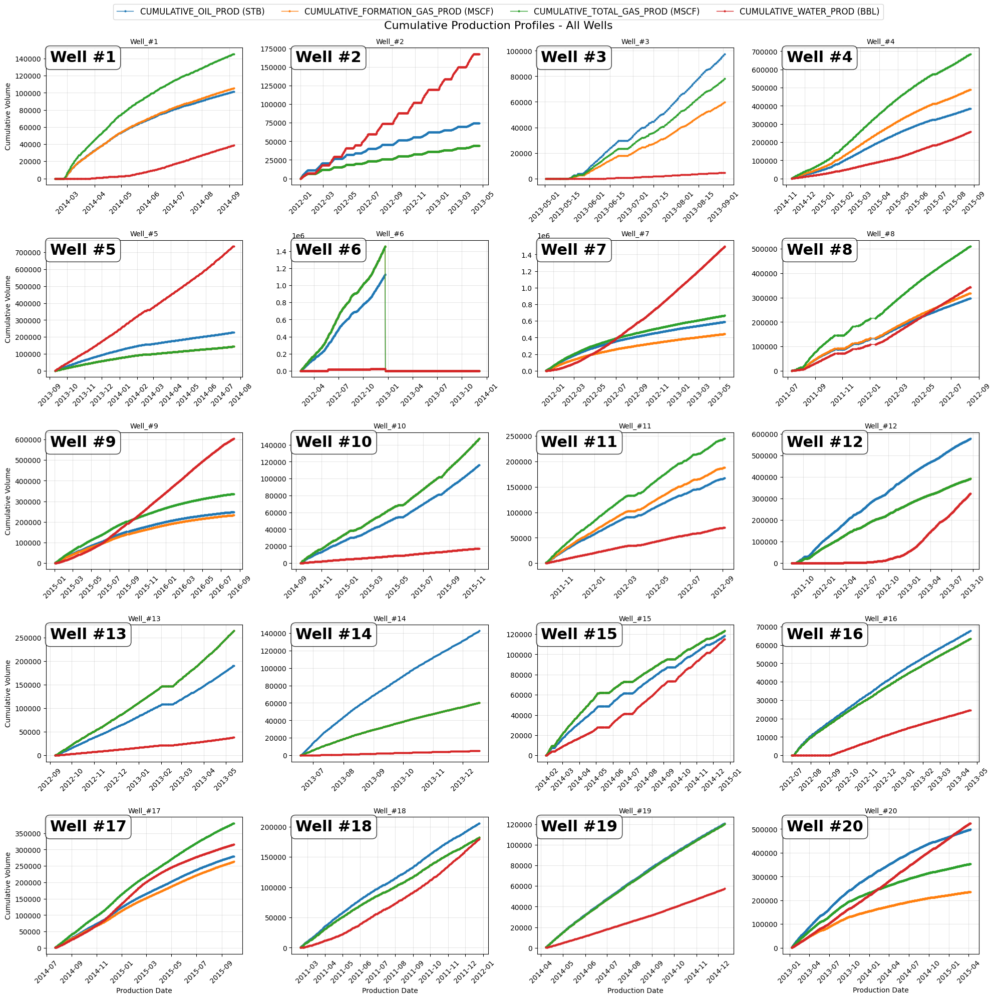

In [ ]:
plot_well_time_series(
    well_data=well_data,
    columns=[
        'CUMULATIVE_OIL_PROD (STB)',
        'CUMULATIVE_FORMATION_GAS_PROD (MSCF)',
        'CUMULATIVE_TOTAL_GAS_PROD (MSCF)',
        'CUMULATIVE_WATER_PROD (BBL)'
    ],
    title="Cumulative Production Profiles - All Wells",
    ylabel="Cumulative Volume",
    show_well_numbers=True,
    text_position=(0.02, 0.98),
    text_fontsize=22
)

Several distinct production patterns emerge. Wells #2, #5, #7, and #9 show predominantly water production with the red line climbing steeply while oil and gas remain relatively flat. These appear to be high water-cut wells, possibly indicating water breakthrough or production from water-bearing zones. In contrast, Wells like well #1, #4, #10, #11, and #13 demonstrate strong oil production with proportional gas production, suggesting healthy oil wells with normal dissolved gas production.

### Pressure Trends - All Wells
Pressure behavior analysis helps identify wells with similar reservoir connectivity and operating conditions.

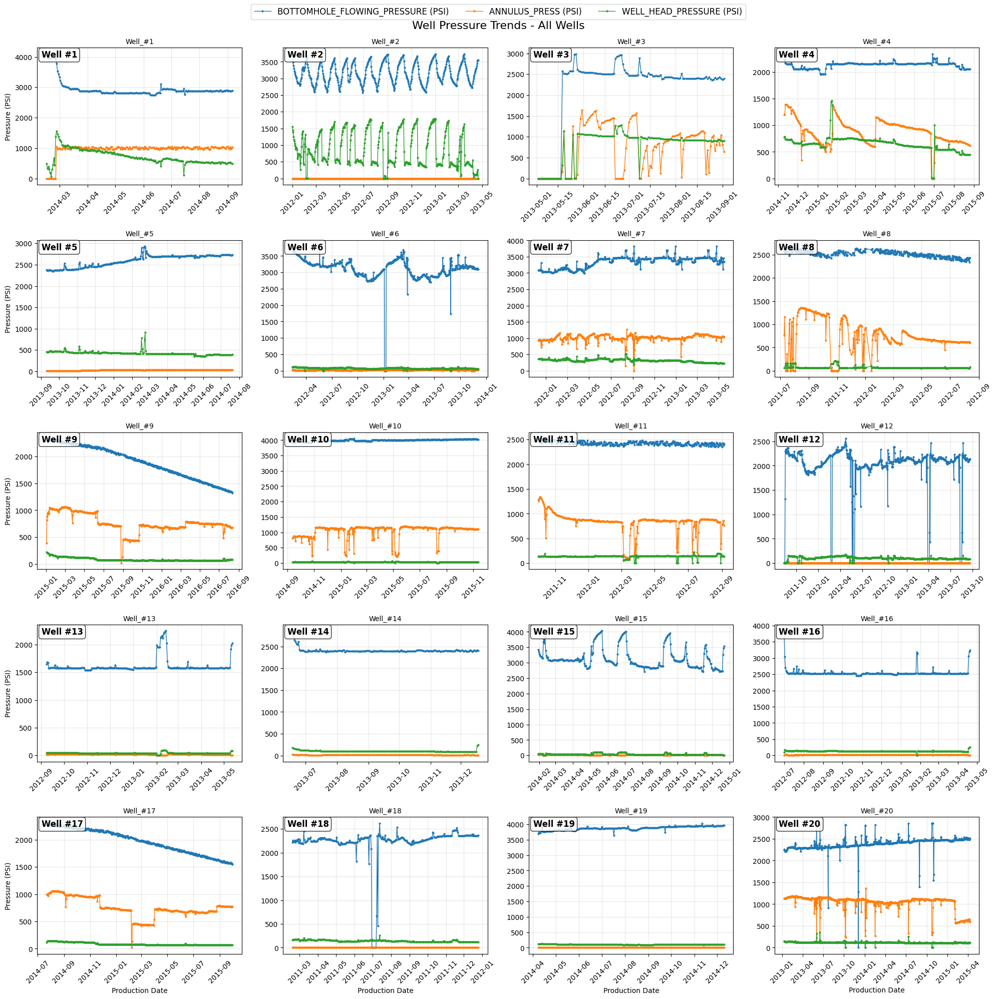

In [ ]:
plot_well_time_series(
    well_data=well_data,
    columns=[
        'BOTTOMHOLE_FLOWING_PRESSURE (PSI)',
        'ANNULUS_PRESS (PSI)',
        'WELL_HEAD_PRESSURE (PSI)'
    ],
    title="Well Pressure Trends - All Wells",
    ylabel="Pressure (PSI)",
    show_well_numbers=True,
    text_position=(0.02, 0.98),
    text_fontsize=12
)

The pressure chart reveals critical operational characteristics through bottomhole flowing pressure, annulus pressure, and wellhead pressure measurements. Wells #1, #3, #4, #11 e.t.c show sustained high annulus pressures, which strongly indicates continuous gas lift operations. The stable, elevated annulus pressure is characteristic of gas injection for artificial lift.

### Temperature Profiles - All Wells
Temperature consistency helps validate data quality and identify wells with similar flow regimes.

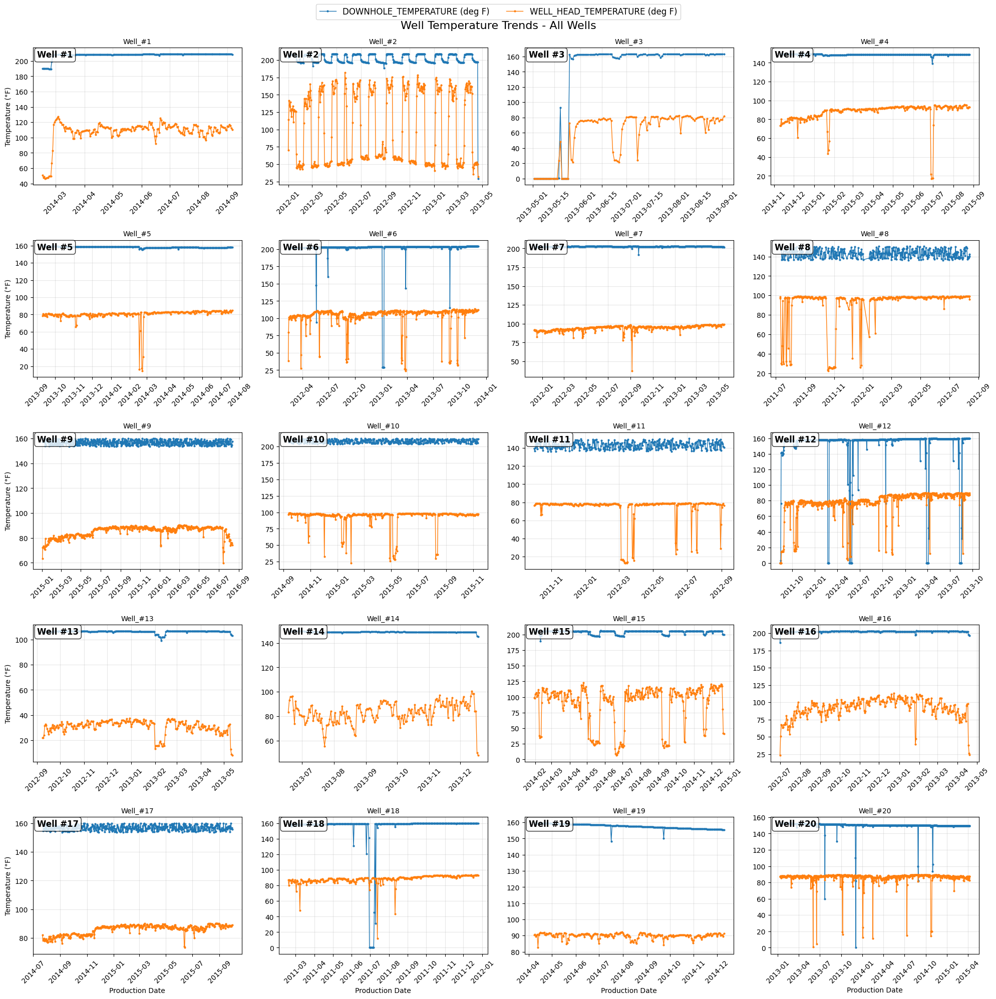

In [ ]:
plot_well_time_series(
    well_data=well_data,
    columns=[
        'DOWNHOLE_TEMPERATURE (deg F)',
        'WELL_HEAD_TEMPERATURE (deg F)'
    ],
    title="Well Temperature Trends - All Wells",
    ylabel="Temperature (°F)",
    show_well_numbers=True,
    text_position=(0.02, 0.98),
    text_fontsize=12
)

Temperature profiles provide insights into flow conditions and thermal behavior. Most wells maintain relatively stable temperature differentials between downhole and wellhead measurements. Wells #2, #8, and #12 show interesting cyclic temperature patterns at the wellhead, which often correlate with the pressure cycles seen in Chart 2, suggesting these fluctuations are related to operational changes or shut-in periods.

### Choke Size Management - All Wells
Choke adjustments reveal production optimization strategies and operational constraints.

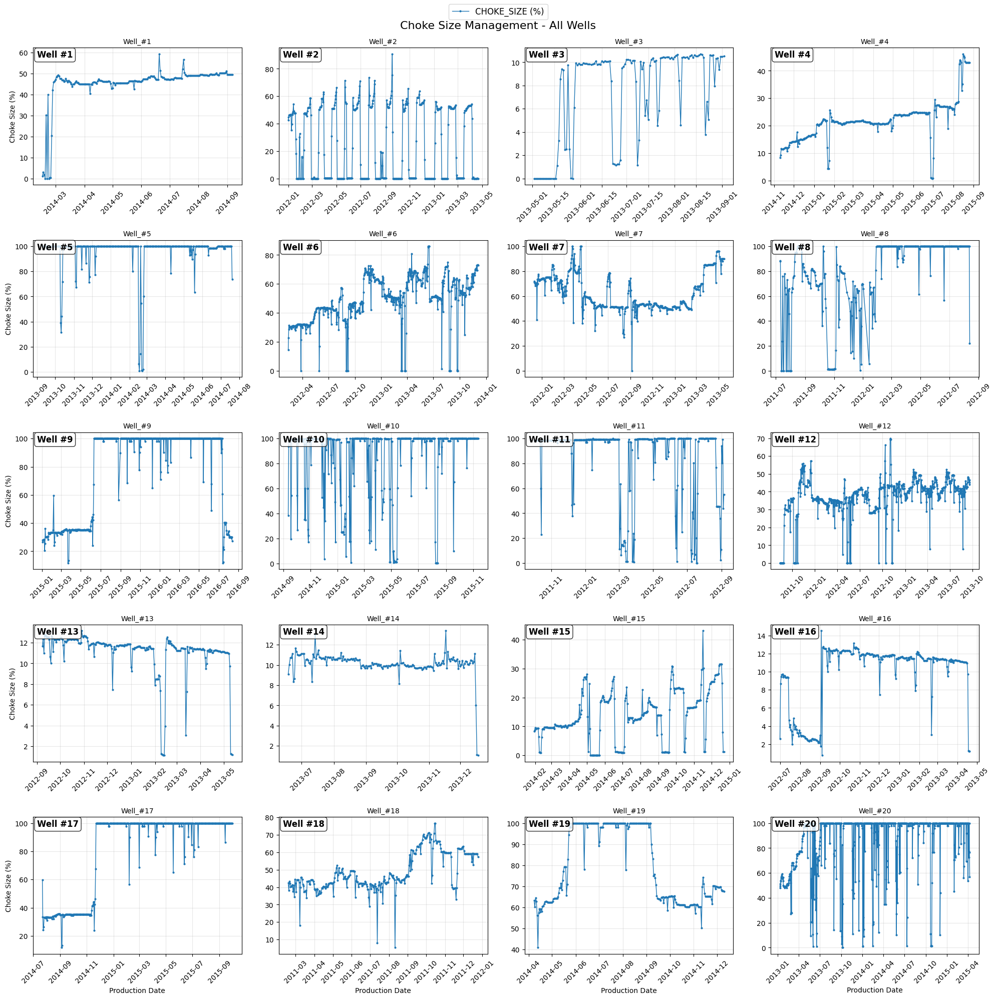

In [ ]:
plot_well_time_series(
    well_data=well_data,
    columns=['CHOKE_SIZE (%)'],
    title="Choke Size Management - All Wells",
    ylabel="Choke Size (%)",
    show_well_numbers=True,
    text_position=(0.02, 0.98),
    text_fontsize=12
)

The choke size chart reveals production control strategies across the field. Wells #5, #9, #10, and #11 operate with high, stable choke settings (80-100%), indicating unrestricted flow or maximum production strategies. These wells likely have sufficient reservoir pressure and productivity to maintain high rates.

## 5. Feature Engineering

### 5.1 Calculate Daily Production Rates
Since we have cumulative production data, we need to calculate daily rates by differencing consecutive values. This is essential for identifying production trends and anomalies.

In [ ]:
# Sort data by well and date to ensure proper differencing
well_data = well_data.sort_values(['WELL_NAME', 'PROD_DATE'])

# Calculate daily rates from cumulative values
# Note: diff() calculates the difference between consecutive rows within each well group
well_data['OIL_RATE'] = well_data.groupby('WELL_NAME')['CUMULATIVE_OIL_PROD (STB)'].diff()
well_data['GAS_RATE'] = well_data.groupby('WELL_NAME')['CUMULATIVE_TOTAL_GAS_PROD (MSCF)'].diff()
well_data['FORMATION_GAS_RATE'] = well_data.groupby('WELL_NAME')['CUMULATIVE_FORMATION_GAS_PROD (MSCF)'].diff()
well_data['WATER_RATE'] = well_data.groupby('WELL_NAME')['CUMULATIVE_WATER_PROD (BBL)'].diff()

# Fill NaN values (first row of each well) with 0
well_data['OIL_RATE'] = well_data['OIL_RATE'].fillna(0)
well_data['GAS_RATE'] = well_data['GAS_RATE'].fillna(0)
well_data['WATER_RATE'] = well_data['WATER_RATE'].fillna(0)

### Visualize Daily Oil Production Rates
Daily rates reveal production stability and help identify shut-ins or production anomalies.

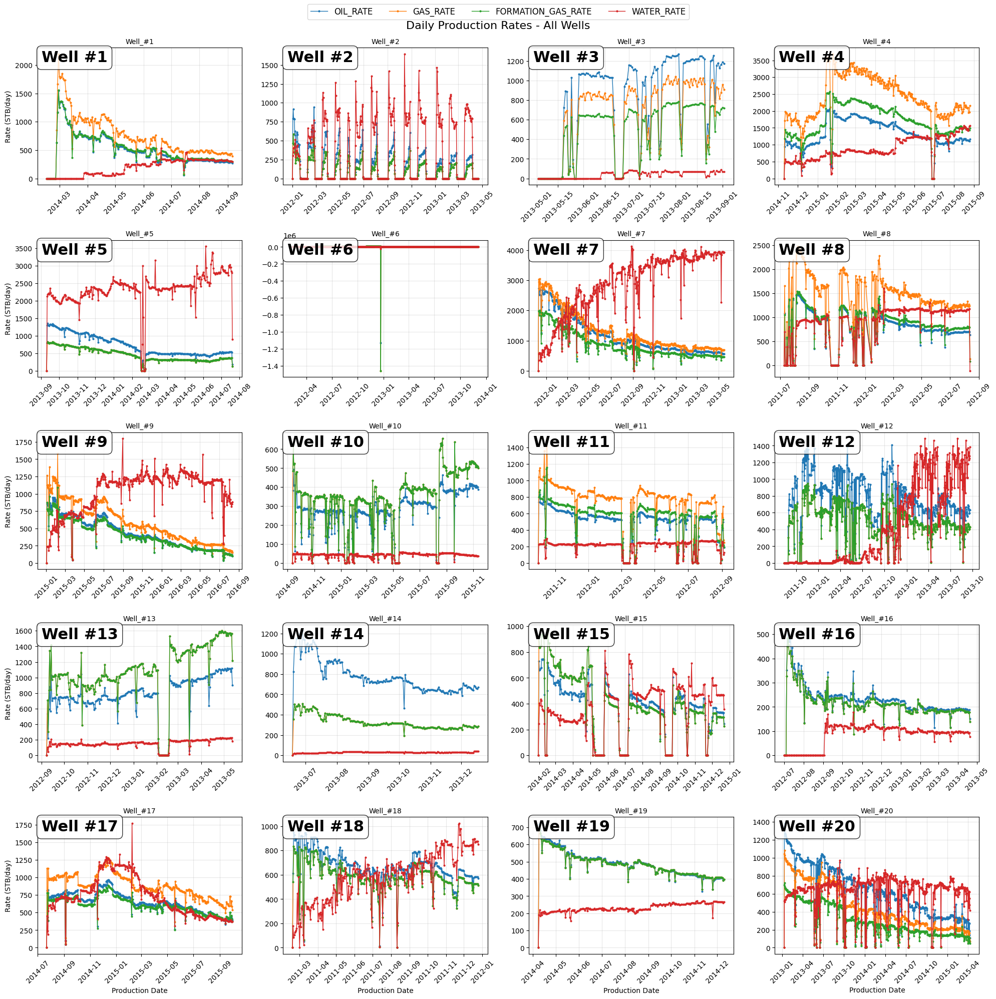

In [ ]:
plot_well_time_series(
    well_data=well_data,
    columns=['OIL_RATE', 'GAS_RATE', 'FORMATION_GAS_RATE','WATER_RATE' ],
    title="Daily Production Rates - All Wells",
    ylabel="Rate (STB/day)",
    show_well_numbers=True,
    text_position=(0.02, 0.98),
    text_fontsize=22
)

Several wells show clear production decline patterns. Well #2 exhibits highly erratic production with frequent shut-ins, suggesting operational issues. Wells #3, #10, #11 etc show relatively stable production with good oil rates maintained.

### 5.2 Calculate Key Production Ratios
Production ratios are fundamental indicators in petroleum engineering for understanding reservoir behavior and well performance.

In [ ]:
# Calculate Gas-Oil Ratio (GOR) in SCF/STB
# GOR indicates whether gas is coming out of solution (increasing GOR) or stable dissolved gas production
well_data['GOR'] = np.where(well_data['OIL_RATE'] > 0,
                            well_data['FORMATION_GAS_RATE'] / well_data['OIL_RATE'] * 1000,  # Convert MSCF to SCF
                            np.nan)

# Calculate Water Cut (fraction of water in total liquid production)
# Watercut trending upward indicates water breakthrough or coning
well_data['WATERCUT'] = well_data['WATER_RATE'] / (well_data['OIL_RATE'] + well_data['WATER_RATE'])

# Handle edge cases: infinite values and NaNs
well_data['GOR'] = well_data['GOR'].replace([np.inf, -np.inf], np.nan)
well_data['WATERCUT'] = well_data['WATERCUT'].fillna(0)

### Gas-Oil Ratio (GOR) Trends
GOR trends help identify whether wells are producing below or above the solution GOR, indicating different production mechanisms.

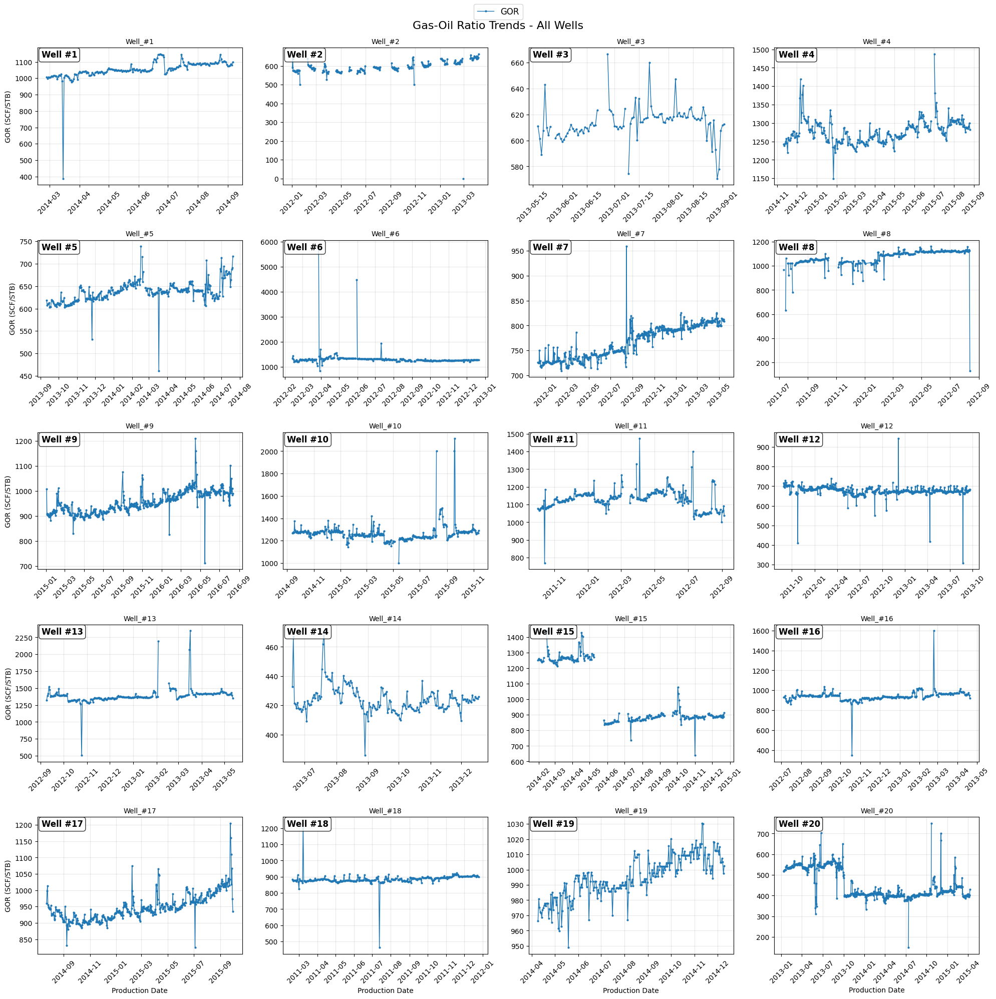

In [ ]:
# Visualize GOR trends with proper labels
plot_well_time_series(
    well_data=well_data,
    columns=['GOR'],
    title="Gas-Oil Ratio Trends - All Wells",
    ylabel="GOR (SCF/STB)",
    show_well_numbers=True,
    text_position=(0.02, 0.98),
    text_fontsize=12
)

 Most wells maintain relatively stable GOR values, which is good for reservoir management. However, Wells #5, #7, #9, and #17 show increasing GOR trends over time, indicating possible gas breakthrough or pressure depletion below bubble point.

### Watercut Trends
Watercut evolution helps identify water breakthrough timing and severity, critical for production optimization.

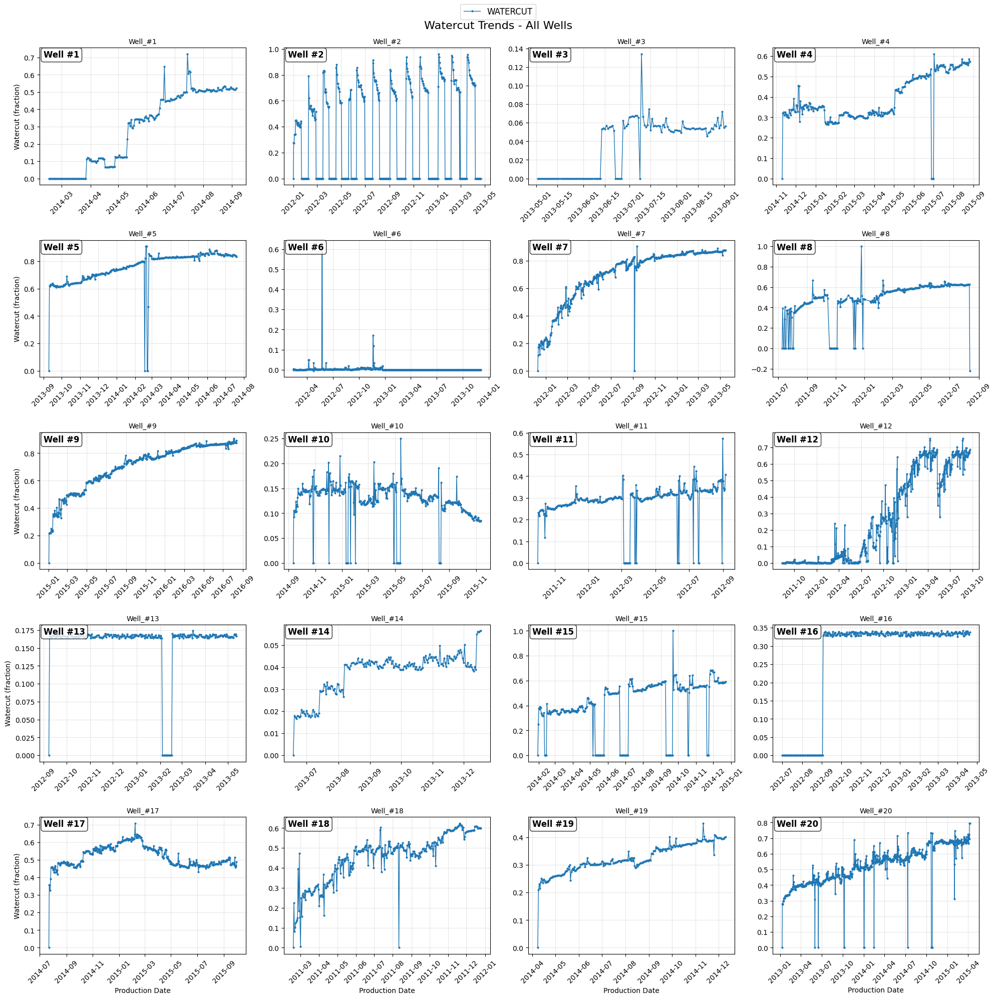

In [ ]:
# Visualize watercut trends
plot_well_time_series(
    well_data=well_data,
    columns=['WATERCUT'],
    title="Watercut Trends - All Wells",
    ylabel="Watercut (fraction)",
    show_well_numbers=True,
    text_position=(0.02, 0.98),
    text_fontsize=12
)

This reveals critical water management challenges. Wells #4, #7, #9, and #18 show steadily increasing watercut from near zero to 0.5-0.8, indicating progressive water breakthrough. Wells #2 and #10 demonstrate highly variable watercut with sudden spikes. Several wells like #13 and #16 maintain very low watercut throughout.

### 5.3 Calculate Pressure-Related Features
Pressure differentials provide insights into flow efficiency and potential issues like high friction losses or flow restrictions.

In [ ]:
# Calculate tubing pressure loss (friction and hydrostatic effects)
well_data['TUBING_LOSS'] = well_data['BOTTOMHOLE_FLOWING_PRESSURE (PSI)'] - well_data['WELL_HEAD_PRESSURE (PSI)']

# Calculate pressure ratios for flow efficiency analysis
well_data['BHP_WHP_RATIO'] = well_data['BOTTOMHOLE_FLOWING_PRESSURE (PSI)'] / well_data['WELL_HEAD_PRESSURE (PSI)']

### Tubing Pressure Loss Analysis
High tubing losses may indicate flow restrictions, while very low losses might suggest gas lift assistance.

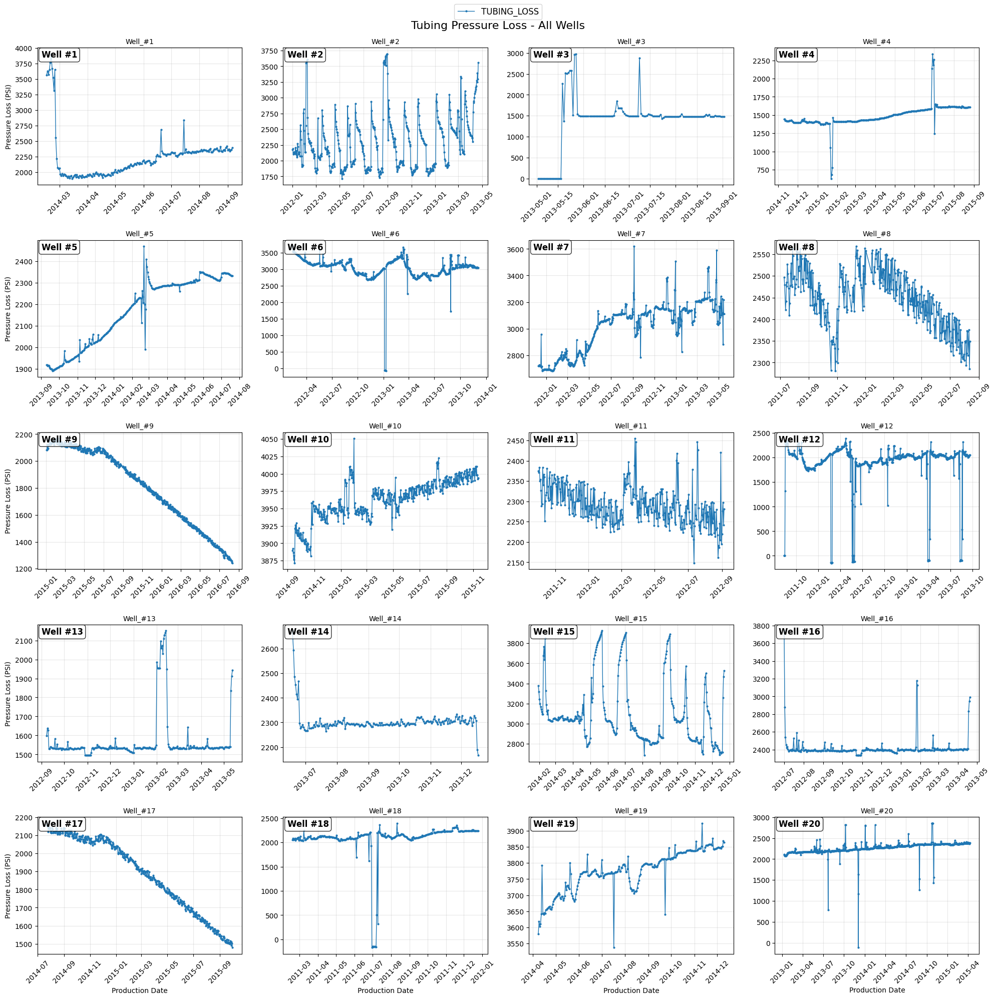

In [ ]:
plot_well_time_series(
    well_data=well_data,
    columns=['TUBING_LOSS'],
    title="Tubing Pressure Loss - All Wells",
    ylabel="Pressure Loss (PSI)",
    show_well_numbers=True,
    text_position=(0.02, 0.98),
    text_fontsize=12
)

Wells #9 and #17 show decreasing tubing losses over time, which typically indicates declining production rates. Well #2 exhibits extreme variations (1750-3750 PSI), confirming operational instability.

### BHP to WHP Ratio Analysis
This ratio helps identify wells with similar flow regimes and potential artificial lift candidates.

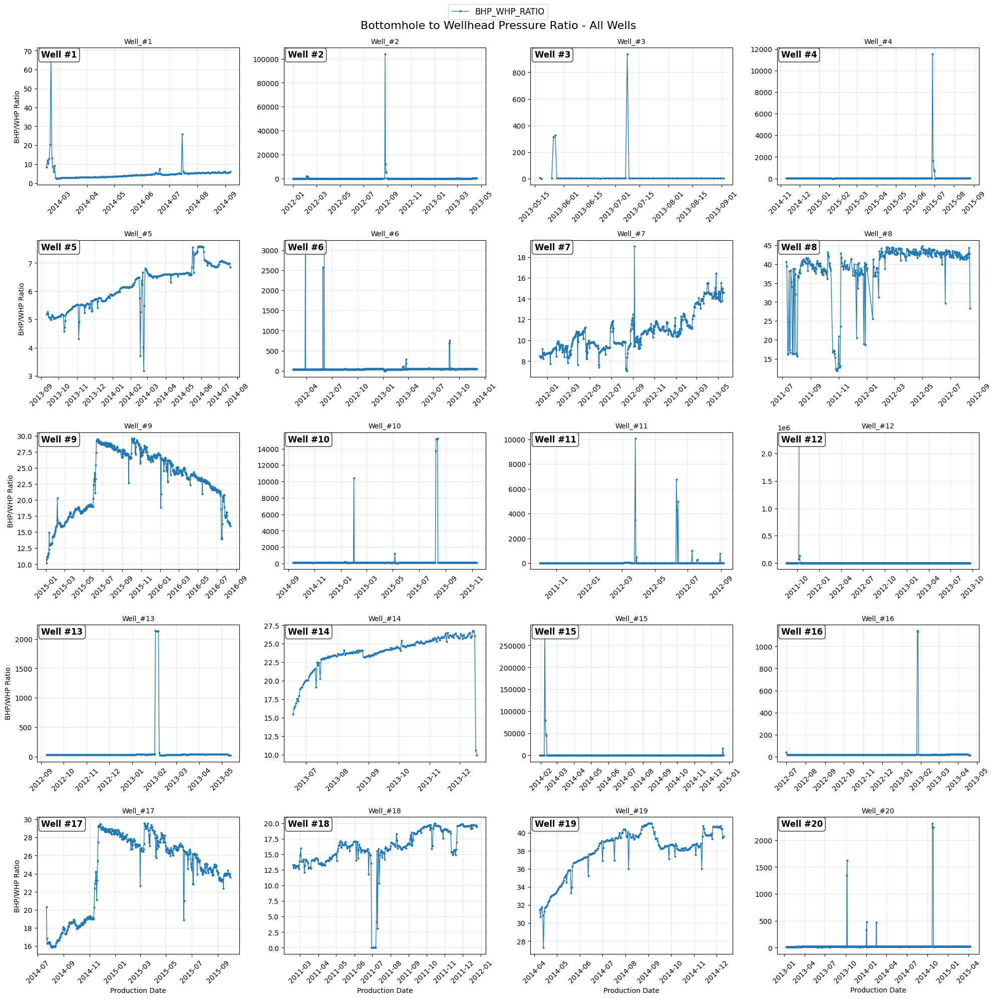

In [ ]:
plot_well_time_series(
    well_data=well_data,
    columns=['BHP_WHP_RATIO'],
    title="Bottomhole to Wellhead Pressure Ratio - All Wells",
    ylabel="BHP/WHP Ratio",
    show_well_numbers=True,
    text_position=(0.02, 0.98),
    text_fontsize=12
)

## 6. Classification Tasks

Now we proceed with the seven classification tasks as specified in the competition guidelines. Each task uses engineering principles and data-driven analysis to categorize the wells.

## Task 1: Reservoir Identification

**Objective**: Identify which reservoir each well is producing from based on bottomhole flowing pressure (BHFP) matching.

**Engineering Principle**: Wells connected to the same reservoir should have similar bottomhole pressures, assuming minimal pressure communication barriers. The guideline specifies a maximum 200 psi differential between the well's maximum BHFP and the reservoir's current average pressure.

In [ ]:
# Calculate maximum bottomhole flowing pressure for each well
# This represents the highest reservoir pressure the well has experienced
max_bhfp_by_well = well_data.groupby('WELL_NAME')['BOTTOMHOLE_FLOWING_PRESSURE (PSI)'].max().reset_index()
max_bhfp_by_well.columns = ['WELL_NAME', 'MAX_BHFP']

In [ ]:
def identify_reservoir(well_name, max_bhfp, reservoir_info, max_differential=200):
    """
    Identify which reservoir a well belongs to based on pressure differential.

    Engineering rationale: Wells produce from reservoirs where the pressure
    differential is minimal, indicating good pressure communication.

    Parameters:
    - well_name: Name of the well
    - max_bhfp: Maximum bottomhole flowing pressure of the well
    - reservoir_info: DataFrame with reservoir pressure information
    - max_differential: Maximum allowed pressure differential (default 200 psi per guidelines)

    Returns:
    - Dictionary with well assignment details
    """
    differentials = []

    # Calculate pressure differential for each reservoir
    for idx, reservoir in reservoir_info.iterrows():
        reservoir_name = reservoir['Reservoir Name']
        current_pressure = reservoir['Current Average Reservoir Pressure (PSI)']

        # Calculate absolute pressure differential
        differential = abs(max_bhfp - current_pressure)
        differentials.append({
            'Reservoir': reservoir_name,
            'Differential': differential,
            'Current_Pressure': current_pressure
        })

    # Find best matching reservoir (minimum differential)
    differentials_df = pd.DataFrame(differentials)
    best_match = differentials_df.loc[differentials_df['Differential'].idxmin()]

    # Validate against maximum allowed differential
    if best_match['Differential'] <= max_differential:
        return {
            'Well': well_name,
            'Reservoir Name': best_match['Reservoir'],
            'Pressure_Differential': best_match['Differential'],
            'Max_BHFP': max_bhfp,
            'Reservoir_Pressure': best_match['Current_Pressure']
        }
    else:
        # Flag wells that exceed the threshold (unusual case)
        return {
            'Well': well_name,
            'Reservoir Name': best_match['Reservoir'] + '_EXCEEDS',
            'Pressure_Differential': best_match['Differential'],
            'Max_BHFP': max_bhfp,
            'Reservoir_Pressure': best_match['Current_Pressure']
        }

In [ ]:
# Apply reservoir identification algorithm to all wells
reservoir_assignments = []
for idx, row in max_bhfp_by_well.iterrows():
    assignment = identify_reservoir(row['WELL_NAME'], row['MAX_BHFP'], reservoir_info)
    reservoir_assignments.append(assignment)

In [ ]:
# Create results dataframe and sort by well number
reservoir_classification = pd.DataFrame(reservoir_assignments)

# Extract numeric well numbers for proper sorting
reservoir_classification['Well_Number'] = reservoir_classification['Well'].str.extract(r'(\d+)').astype(int)
reservoir_classification = reservoir_classification.sort_values('Well_Number')

In [ ]:
# Quality check: Verify no wells exceed the 200 psi limit
exceeds_limit = reservoir_classification[reservoir_classification['Pressure_Differential'] > 200]
if len(exceeds_limit) > 0:
    print(f"\nWARNING: {len(exceeds_limit)} wells exceed 200 psi differential limit!")

### Visualization: Pressure Differential Distribution
This boxplot shows how well each reservoir assignment meets the pressure matching criterion.

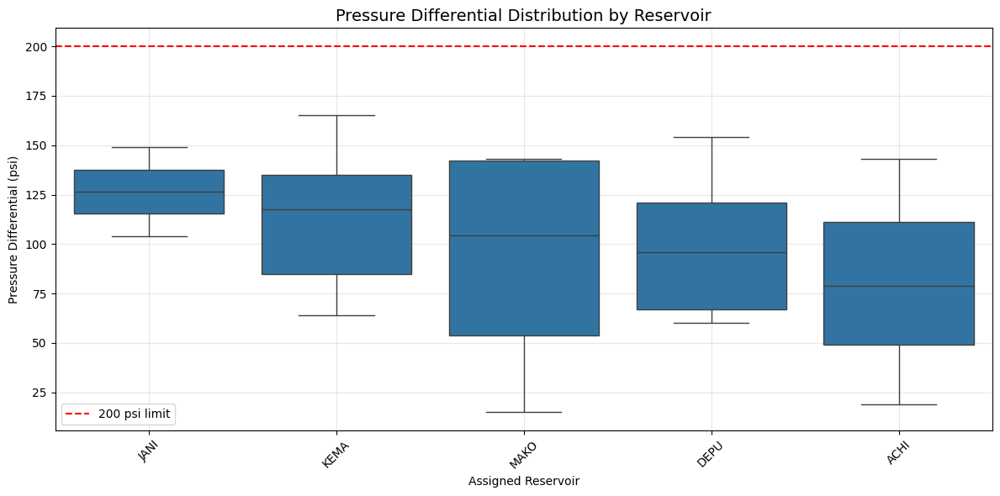

In [ ]:
# Visualization 1: Distribution of pressure differentials by reservoir
plt.figure(figsize=(12, 6))
sns.boxplot(data=reservoir_classification, x='Reservoir Name', y='Pressure_Differential')
plt.axhline(y=200, color='red', linestyle='--', label='200 psi limit')
plt.title('Pressure Differential Distribution by Reservoir', fontsize=14)
plt.xlabel('Assigned Reservoir')
plt.ylabel('Pressure Differential (psi)')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

This box plot shows how well each group of wells matches their assigned reservoir's pressure. The red dashed line at 200 psi represents the maximum allowable differential specified in the competition guidelines. All five reservoirs show their wells falling well within this limit. MAKO reservoir shows the widest distribution of pressure differentials.

### Well Distribution Across Reservoirs
Understanding how wells are distributed helps identify potential reservoir compartmentalization.

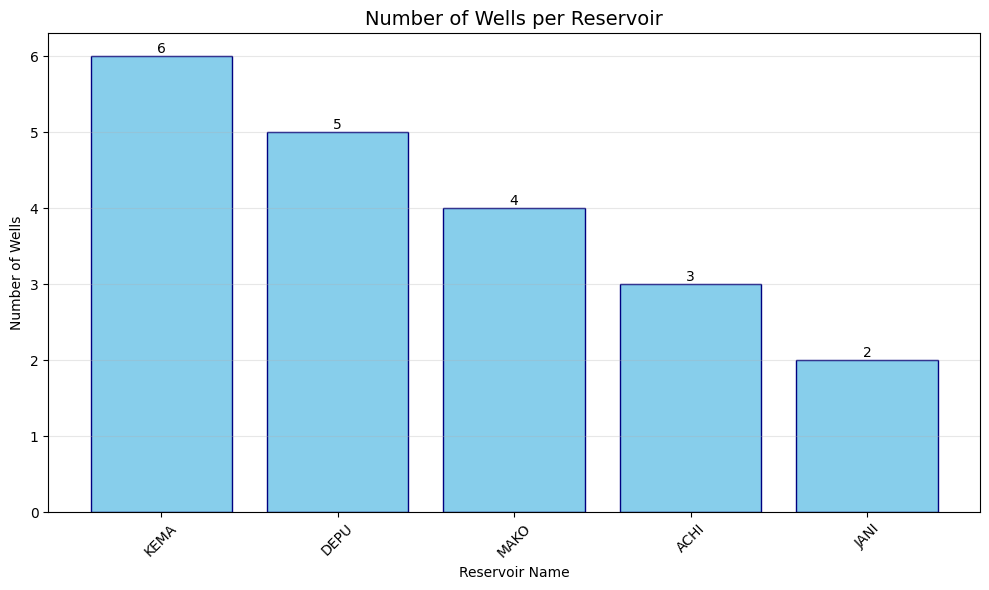

In [ ]:
# Visualization 2: Well count by reservoir
plt.figure(figsize=(10, 6))
reservoir_counts = reservoir_classification['Reservoir Name'].value_counts()
bars = plt.bar(reservoir_counts.index, reservoir_counts.values, color='skyblue', edgecolor='navy')
plt.title('Number of Wells per Reservoir', fontsize=14)
plt.xlabel('Reservoir Name')
plt.ylabel('Number of Wells')
plt.xticks(rotation=45)

# Add value labels on bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{int(height)}', ha='center', va='bottom')

plt.grid(True, axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

This chart reveals an uneven distribution across the field. KEMA reservoir has the most wells with 6, followed by DEPU with 5, MAKO with 4, ACHI with 3, and JANI with only 2 wells. This unbalanced distribution might reflect the actual reservoir sizes, productivity, or development priorities in the field.

### Pressure Communication Analysis
This scatter plot validates the reservoir assignments by showing how well BHFP matches reservoir pressure.

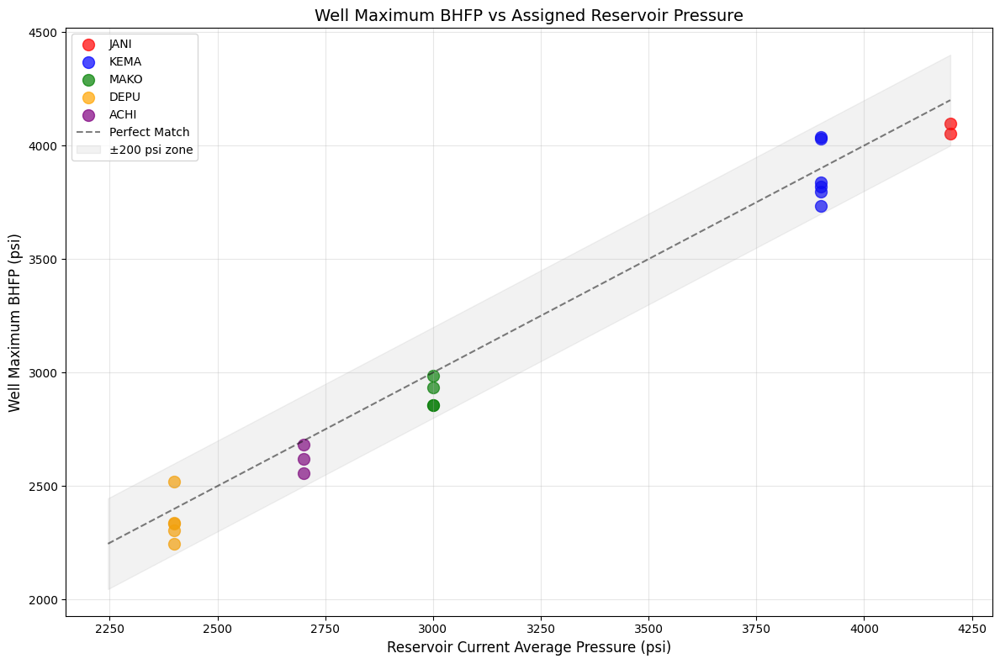

In [ ]:
# Visualization 3: Scatter plot of Max BHFP vs Reservoir Pressure
plt.figure(figsize=(12, 8))
colors = ['red', 'blue', 'green', 'orange', 'purple']
reservoirs = reservoir_classification['Reservoir Name'].unique()

for i, res in enumerate(reservoirs):
    res_data = reservoir_classification[reservoir_classification['Reservoir Name'] == res]
    plt.scatter(res_data['Reservoir_Pressure'], res_data['Max_BHFP'],
                label=res, alpha=0.7, s=100, color=colors[i % len(colors)])

# Add reference lines
min_p = min(reservoir_classification['Reservoir_Pressure'].min(),
            reservoir_classification['Max_BHFP'].min())
max_p = max(reservoir_classification['Reservoir_Pressure'].max(),
            reservoir_classification['Max_BHFP'].max())

# Perfect match line
plt.plot([min_p, max_p], [min_p, max_p], 'k--', alpha=0.5, label='Perfect Match')

# ±200 psi tolerance zone
plt.fill_between([min_p, max_p], [min_p-200, max_p-200], [min_p+200, max_p+200],
                 alpha=0.1, color='gray', label='±200 psi zone')

plt.xlabel('Reservoir Current Average Pressure (psi)', fontsize=12)
plt.ylabel('Well Maximum BHFP (psi)', fontsize=12)
plt.title('Well Maximum BHFP vs Assigned Reservoir Pressure', fontsize=14)
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

The scatter plot provides strong visual validation of the classification method. Each colored dot represents a well, grouped by its assigned reservoir. The black dashed diagonal line represents perfect pressure matching, while the gray shaded area shows the ±200 psi tolerance zone. All wells fall within this acceptable zone, and most cluster relatively close to their reservoir's average pressure.

### Pressure Differential Heatmap
This comprehensive view shows pressure differentials between all wells and all reservoirs, helping validate our assignments.

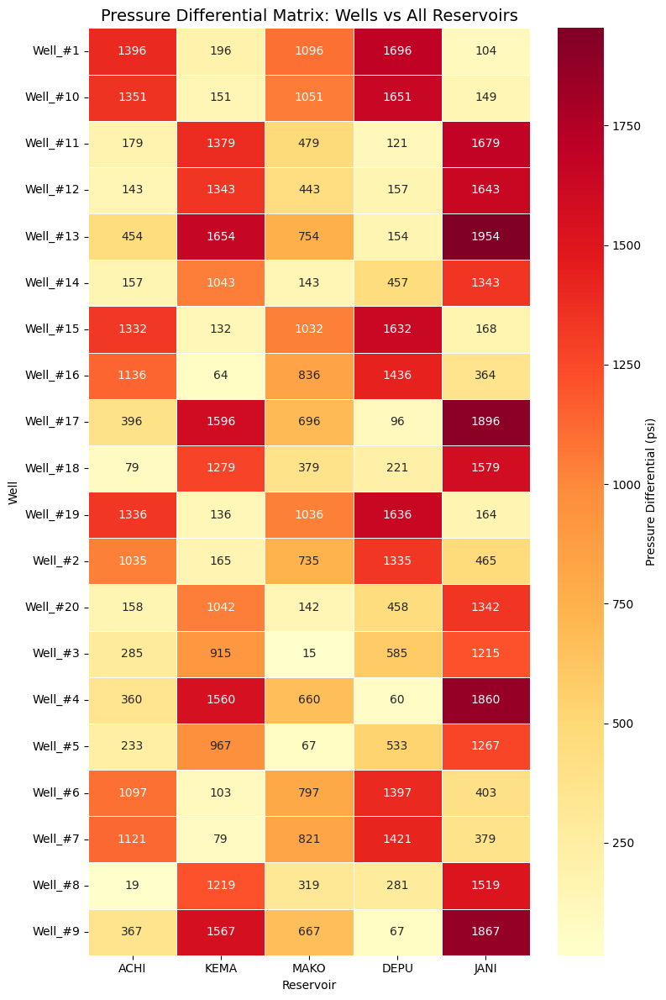

In [ ]:
# Create matrix of pressure differentials for all well-reservoir combinations
differential_matrix = pd.DataFrame(index=sorted(reservoir_classification['Well'].unique()),
                                  columns=reservoir_info['Reservoir Name'])

for well in differential_matrix.index:
    well_bhfp = reservoir_classification[reservoir_classification['Well'] == well]['Max_BHFP'].values[0]
    for res in differential_matrix.columns:
        res_pressure = reservoir_info[reservoir_info['Reservoir Name'] == res]['Current Average Reservoir Pressure (PSI)'].values[0]
        differential_matrix.loc[well, res] = abs(well_bhfp - res_pressure)

# Convert to numeric type
differential_matrix = differential_matrix.astype(float)

# Create heatmap
plt.figure(figsize=(8, 12))
sns.heatmap(differential_matrix, cmap='YlOrRd', cbar_kws={'label': 'Pressure Differential (psi)'},
            fmt='.0f', linewidths=0.5, annot=True)
plt.title('Pressure Differential Matrix: Wells vs All Reservoirs', fontsize=14)
plt.xlabel('Reservoir')
plt.ylabel('Well')
plt.tight_layout()
plt.show()

The Pressure Differential Matrix above shows what the pressure differential would have been if each well had been assigned to any of the five reservoirs. The color intensity immediately reveals the classification logic - the lightest colors (lowest differentials) align with the actual assignments. For example, Well #3 shows a differential of only 15 psi with MAKO reservoir but much higher values (285-1215 psi) with other reservoirs, clearly confirming MAKO as the correct assignment.

In [ ]:
# Save classification results
print("First 10 Reservoir Assignments")
print(reservoir_classification[['Well', 'Reservoir Name', 'Pressure_Differential']].head(10))

# Prepare final classification format
final_classification = reservoir_classification.copy()
final_classification['Well'] = final_classification['Well_Number']
final_classification = final_classification[['Well', 'Reservoir Name']].sort_values('Well')

First 10 Reservoir Assignments
        Well Reservoir Name  Pressure_Differential
0    Well_#1           JANI                    104
11   Well_#2           KEMA                    165
13   Well_#3           MAKO                     15
14   Well_#4           DEPU                     60
15   Well_#5           MAKO                     67
16   Well_#6           KEMA                    103
17   Well_#7           KEMA                     79
18   Well_#8           ACHI                     19
19   Well_#9           DEPU                     67
1   Well_#10           JANI                    149


## Reservoir Classification ML Validation

This section explores whether production patterns support our pressure-based reservoir assignments
using supervised learning on all ~8,000 production records.

### Objectives:
1. Validate that production patterns align with pressure-based assignments
2. Identify which features best distinguish between reservoirs
3. Find potential anomalies or edge cases
4. Quantify the separability of reservoirs based on production data


### Step 1: Prepare Training Labels
Map the well-level reservoir assignments to all production records to create supervised learning labels.

In [ ]:
# Create a mapping of wells to their assigned reservoirs
well_to_reservoir = reservoir_classification.set_index('Well')['Reservoir Name'].to_dict()

# Apply this mapping to all production records
print(f"Total production records: {len(well_data)}")
well_data['Assigned_Reservoir'] = well_data['WELL_NAME'].map(well_to_reservoir)

Total production records: 7955


In [ ]:
# Check for any unmapped records
unmapped = well_data['Assigned_Reservoir'].isna().sum()
if unmapped > 0:
    print(f"\nWarning: {unmapped} records could not be mapped to a reservoir")

### Step 2: Feature Engineering
Extract comprehensive features from production data that might indicate reservoir characteristics.

In [ ]:
def prepare_ml_features_full_dataset(well_data):
    """
    Prepare feature matrix for ML validation using all production records.

    Features are selected based on petroleum engineering principles:
    - Pressure relationships indicate reservoir connectivity
    - Production ratios reflect fluid properties
    - Operational parameters show completion/lift strategies
    """

    # Create a copy to avoid modifying original data
    df = well_data.copy()

    # Basic features directly from data
    feature_columns = [
        'BOTTOMHOLE_FLOWING_PRESSURE (PSI)',
        'DOWNHOLE_TEMPERATURE (deg F)',
        'ANNULUS_PRESS (PSI)',
        'CHOKE_SIZE (%)',
        'WELL_HEAD_PRESSURE (PSI)',
        'WELL_HEAD_TEMPERATURE (deg F)',
        'ON_STREAM_HRS',
        # Using rates instead of cumulative for point-in-time analysis
        'OIL_RATE',
        'GAS_RATE',
        'WATER_RATE'
    ]

    # Calculate additional engineering features
    # Pressure ratios and differentials
    df['BHP_WHP_RATIO'] = df['BOTTOMHOLE_FLOWING_PRESSURE (PSI)'] / (df['WELL_HEAD_PRESSURE (PSI)'] + 1)
    df['TUBING_PRESSURE_DROP'] = df['BOTTOMHOLE_FLOWING_PRESSURE (PSI)'] - df['WELL_HEAD_PRESSURE (PSI)']
    df['BHP_ANNULUS_RATIO'] = df['BOTTOMHOLE_FLOWING_PRESSURE (PSI)'] / (df['ANNULUS_PRESS (PSI)'] + 1)

    # Temperature gradient
    df['TEMP_GRADIENT'] = (df['DOWNHOLE_TEMPERATURE (deg F)'] - df['WELL_HEAD_TEMPERATURE (deg F)']) / (df['DOWNHOLE_TEMPERATURE (deg F)'] + 1)

    # Production ratios (with safe division)
    total_liquid = df['OIL_RATE'] + df['WATER_RATE']
    df['WATERCUT'] = np.where(total_liquid > 0, df['WATER_RATE'] / total_liquid, 0)
    df['LIQUID_RATE'] = total_liquid

    # GOR calculation (handle zeros)
    df['GOR'] = np.where(df['OIL_RATE'] > 0, df['GAS_RATE'] / df['OIL_RATE'], 0)

    # Gas-Liquid Ratio
    df['GLR'] = np.where(total_liquid > 0, df['GAS_RATE'] / total_liquid, 0)

    # Add calculated features to feature list
    feature_columns.extend([
        'BHP_WHP_RATIO',
        'TUBING_PRESSURE_DROP',
        'BHP_ANNULUS_RATIO',
        'TEMP_GRADIENT',
        'WATERCUT',
        'LIQUID_RATE',
        'GOR',
        'GLR'
    ])

    # Extract features and target
    features = df[feature_columns].copy()
    target = df['Assigned_Reservoir']

    # Handle infinite values
    features = features.replace([np.inf, -np.inf], np.nan)

    return features, target, feature_columns


In [ ]:
# Prepare features and target
print("Preparing features for ML analysis...")
X, y, feature_names = prepare_ml_features_full_dataset(well_data)

print(f"\nFeature matrix shape: {X.shape}")
print(f"Target distribution:")
print(y.value_counts())

Preparing features for ML analysis...

Feature matrix shape: (7955, 18)
Target distribution:
Assigned_Reservoir
KEMA    2531
DEPU    1896
ACHI    1455
MAKO    1442
JANI     631
Name: count, dtype: int64


### Step 3: Data Preprocessing
Handle missing values and scale features for optimal ML performance.

In [ ]:
# Handle missing values
print("Handling missing values...")
imputer = SimpleImputer(strategy='median')
X_imputed = imputer.fit_transform(X)

# Scale features
print("Scaling features...")
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_imputed)

Handling missing values...
Scaling features...


In [ ]:
# Encode target labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

print(f"\nReservoir mapping:")
for i, reservoir in enumerate(label_encoder.classes_):
    print(f"  {i}: {reservoir}")


Reservoir mapping:
  0: ACHI
  1: DEPU
  2: JANI
  3: KEMA
  4: MAKO


In [ ]:
# Create train/test splits
# Strategy A: Random split
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
)

print(f"\nTraining set size: {X_train.shape[0]}")
print(f"Test set size: {X_test.shape[0]}")


Training set size: 6364
Test set size: 1591


### Step 4: Model Training
Train multiple classifiers to understand which features are most predictive of reservoir assignment.

In [ ]:
# Initialize models
models = {
    'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1),
    'XGBoost': xgb.XGBClassifier(n_estimators=100, random_state=42, n_jobs=-1),
    'Logistic Regression': LogisticRegression(multi_class='multinomial', max_iter=1000, random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(n_estimators=100, random_state=42),
}

In [ ]:
# Train models and collect results
results = {}

In [ ]:
print("Training models...")
for name, model in models.items():
    print(f"\nTraining {name}...")

    # Train model
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    results[name] = {
        'model': model,
        'predictions': y_pred,
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1_score': f1,
        'classification_report': classification_report(y_test, y_pred,
                                                     target_names=label_encoder.classes_)
    }

    print(f"  Accuracy: {accuracy:.4f}")
    print(f"  Precision: {precision:.4f}")
    print(f"  F1-Score: {f1:.4f}")

Training models...

Training Random Forest...
  Accuracy: 0.9975
  Precision: 0.9975
  F1-Score: 0.9975

Training XGBoost...
  Accuracy: 0.9956
  Precision: 0.9956
  F1-Score: 0.9956

Training Logistic Regression...
  Accuracy: 0.9855
  Precision: 0.9856
  F1-Score: 0.9856

Training Gradient Boosting...
  Accuracy: 0.9981
  Precision: 0.9981
  F1-Score: 0.9981


### Step 5: Cross-Validation for Robust Performance Estimates
Use k-fold cross-validation to ensure our performance metrics are reliable.

In [ ]:
# Perform cross-validation for the best model
best_model_name = max(results.items(), key=lambda x: x[1]['accuracy'])[0]
best_model = models[best_model_name]

print(f"\nPerforming 5-fold cross-validation with {best_model_name}...")
cv_scores = cross_val_score(best_model, X_scaled, y_encoded, cv=5, scoring='accuracy')

print(f"Cross-validation scores: {cv_scores}")
print(f"Mean CV accuracy: {cv_scores.mean():.4f} (+/- {cv_scores.std() * 2:.4f})")


Performing 5-fold cross-validation with Gradient Boosting...
Cross-validation scores: [0.70835952 0.83280955 0.99874293 0.95097423 0.97737272]
Mean CV accuracy: 0.8937 (+/- 0.2179)


### Step 6: Model Evaluation and Analysis
Detailed analysis of model performance and insights.

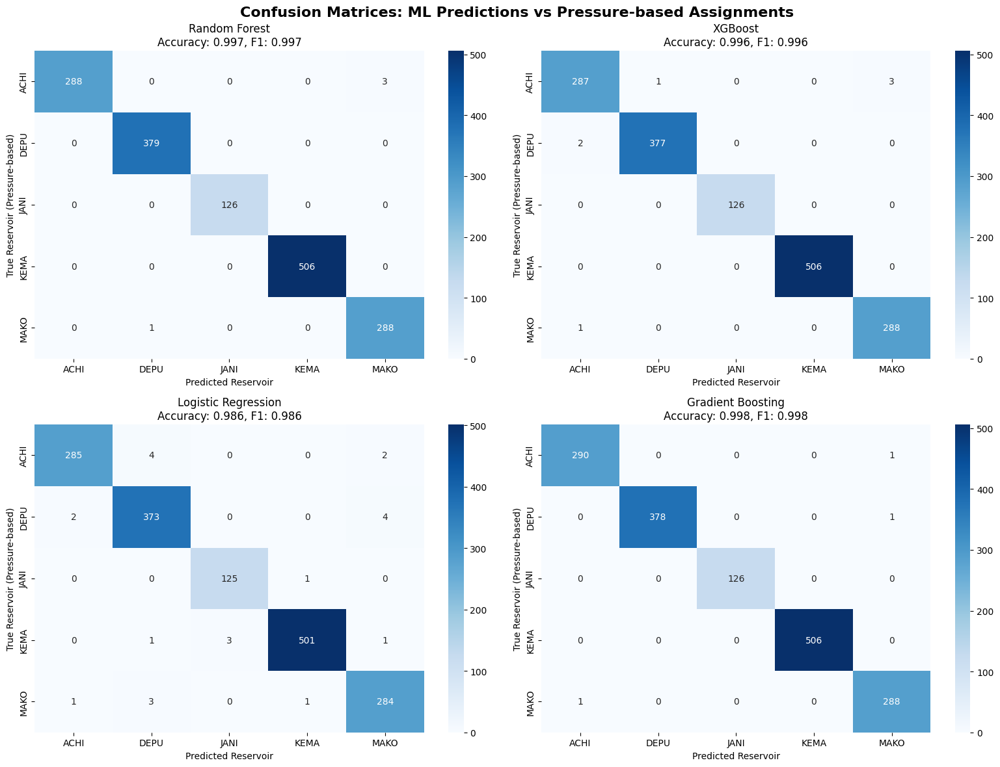

In [ ]:
# Display detailed results for each model
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

for idx, (name, result) in enumerate(results.items()):
    ax = axes[idx]

    # Create confusion matrix
    cm = confusion_matrix(y_test, result['predictions'])

    # Plot confusion matrix
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax,
                xticklabels=label_encoder.classes_,
                yticklabels=label_encoder.classes_)

    ax.set_title(f'{name}\nAccuracy: {result["accuracy"]:.3f}, F1: {result["f1_score"]:.3f}')
    ax.set_xlabel('Predicted Reservoir')
    ax.set_ylabel('True Reservoir (Pressure-based)')

plt.suptitle('Confusion Matrices: ML Predictions vs Pressure-based Assignments',
             fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

Looking at the confusion matrices, all four models show exceptional performance with accuracies ranging from 98.6% to 99.8%. The diagonal blue squares represent correct predictions, and they're strongly dominant across all models. Random Forest and Gradient Boosting slightly outperform the others, both achieving around 99.8% accuracy. The most common misclassifications appear to be between ACHI and MAKO reservoirs and between DEPU and KEMA reservoirs. JANI reservoir seems to be the most distinctly classified with virtually no misclassifications.

### Step 7: Feature Importance Analysis
Understand which production characteristics best distinguish between reservoirs.

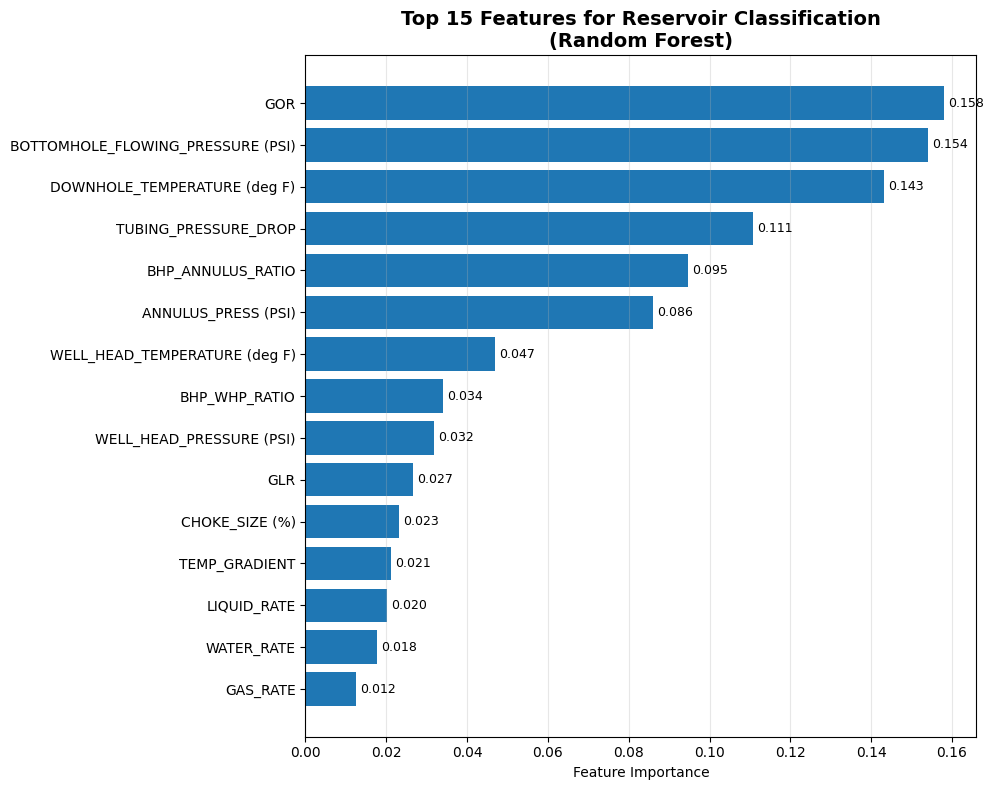

In [ ]:
# Extract feature importances from tree-based models
feature_importance_dict = {}

for name, result in results.items():
    if hasattr(result['model'], 'feature_importances_'):
        feature_importance_dict[name] = result['model'].feature_importances_

# Create feature importance visualization
if feature_importance_dict:
    # Use Random Forest importances for detailed analysis
    if 'Random Forest' in feature_importance_dict:
        importances = feature_importance_dict['Random Forest']

        # Create dataframe for visualization
        feature_imp_df = pd.DataFrame({
            'Feature': feature_names,
            'Importance': importances
        }).sort_values('Importance', ascending=False)

        # Plot top 15 features
        plt.figure(figsize=(10, 8))
        top_features = feature_imp_df.head(15)

        bars = plt.barh(range(len(top_features)), top_features['Importance'])
        plt.yticks(range(len(top_features)), top_features['Feature'])
        plt.xlabel('Feature Importance')
        plt.title('Top 15 Features for Reservoir Classification\n(Random Forest)',
                  fontsize=14, fontweight='bold')
        plt.gca().invert_yaxis()

        # Add value labels
        for i, bar in enumerate(bars):
            width = bar.get_width()
            plt.text(width + 0.001, bar.get_y() + bar.get_height()/2,
                    f'{width:.3f}', ha='left', va='center', fontsize=9)

        plt.grid(axis='x', alpha=0.3)
        plt.tight_layout()
        plt.show()

The feature importance chart reveals insights about what distinguishes these reservoirs. GOR (Gas-Oil Ratio) emerges as the most important feature with an importance score of 0.158, followed closely by bottomhole flowing pressure at 0.154. This makes perfect engineering sense - GOR reflects the fluid properties and phase behavior unique to each reservoir, while bottomhole pressure directly relates to your pressure-based classification method.

### Step 8: Performance Summary and Insights

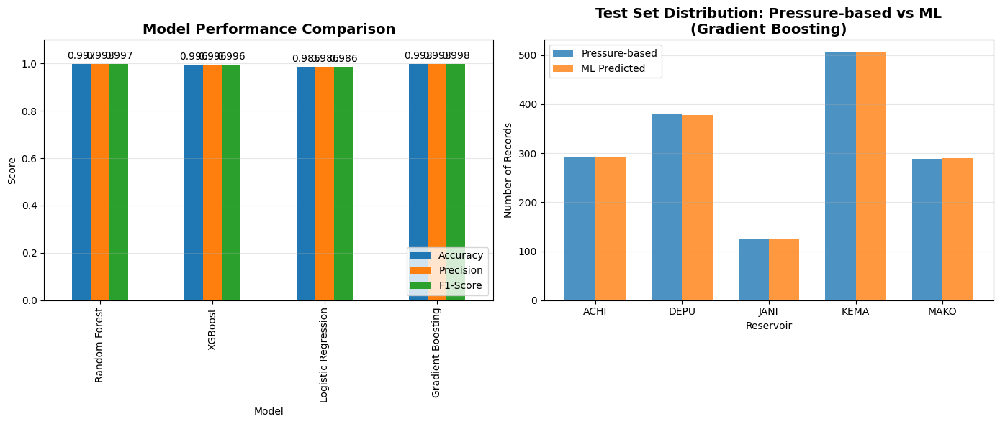

In [ ]:
# Create summary visualization
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Performance comparison
metrics_df = pd.DataFrame({
    'Model': list(results.keys()),
    'Accuracy': [r['accuracy'] for r in results.values()],
    'Precision': [r['precision'] for r in results.values()],
    'F1-Score': [r['f1_score'] for r in results.values()]
})

metrics_df.set_index('Model').plot(kind='bar', ax=ax1)
ax1.set_title('Model Performance Comparison', fontsize=14, fontweight='bold')
ax1.set_ylabel('Score')
ax1.set_ylim(0, 1.1)
ax1.legend(loc='lower right')
ax1.grid(axis='y', alpha=0.3)

# Add value labels
for container in ax1.containers:
    ax1.bar_label(container, fmt='%.3f', padding=3)

# Reservoir prediction distribution
best_predictions = results[best_model_name]['predictions']
prediction_counts = pd.Series(best_predictions).value_counts()
true_counts = pd.Series(y_test).value_counts()

x = np.arange(len(label_encoder.classes_))
width = 0.35

bars1 = ax2.bar(x - width/2, true_counts.sort_index(), width,
                label='Pressure-based', alpha=0.8)
bars2 = ax2.bar(x + width/2, prediction_counts.sort_index(), width,
                label='ML Predicted', alpha=0.8)

ax2.set_xlabel('Reservoir')
ax2.set_ylabel('Number of Records')
ax2.set_title(f'Test Set Distribution: Pressure-based vs ML\n({best_model_name})',
              fontsize=14, fontweight='bold')
ax2.set_xticks(x)
ax2.set_xticklabels(label_encoder.classes_)
ax2.legend()
ax2.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

The model performance comparison shows remarkably consistent results across all four algorithms, with accuracies above 98.6%. This consistency across different model types (tree-based, linear, and boosting methods) strongly validates that the production patterns genuinely support our pressure-based assignments rather than being an artifact of a particular algorithm.

In [ ]:
# Calculate and display key insights
best_accuracy = max(r['accuracy'] for r in results.values())
avg_accuracy = np.mean([r['accuracy'] for r in results.values()])
print("RESERVOIR CLASSIFICATION ML VALIDATION")
print(f"\nDataset size: {len(X)} production records from {len(well_data['WELL_NAME'].unique())} wells")
print(f"Number of reservoirs: {len(label_encoder.classes_)}")
print(f"\nBest model: {best_model_name}")
print(f"Best accuracy: {best_accuracy:.4f}")
print(f"Average accuracy across models: {avg_accuracy:.4f}")
print(f"Cross-validation accuracy: {cv_scores.mean():.4f} ± {cv_scores.std() * 2:.4f}")

RESERVOIR CLASSIFICATION ML VALIDATION

Dataset size: 7955 production records from 20 wells
Number of reservoirs: 5

Best model: Gradient Boosting
Best accuracy: 0.9981
Average accuracy across models: 0.9942
Cross-validation accuracy: 0.8937 ± 0.2179


## Task 2: Reservoir Type Classification (Saturated vs Undersaturated)

**Objective**: Determine whether each reservoir is saturated or undersaturated based on initial conditions.

**Engineering Principle**:
- **Undersaturated**: Initial pressure > Bubble point pressure (all gas dissolved in oil)
- **Saturated**: Initial pressure ≤ Bubble point pressure (free gas phase exists)

This classification is crucial as it affects production behavior, GOR trends, and recovery mechanisms.

In [ ]:
def classify_reservoir_type(reservoir_info):
    """
    Classify reservoirs as saturated or undersaturated based on initial conditions.

    Engineering rationale:
    - Undersaturated: Pi > Pb → Single phase oil, constant GOR until Pb reached
    - Saturated: Pi ≤ Pb → Two-phase flow, increasing GOR expected
    """
    reservoir_types = []

    for idx, reservoir in reservoir_info.iterrows():
        name = reservoir['Reservoir Name']
        initial_pressure = reservoir['Initial Reservoir Pressure (PSI)']
        bubble_point = reservoir['Bubble Point Pressure (PSI)']

        # Apply classification criterion
        if initial_pressure > bubble_point:
            res_type = 'Undersaturated'
        else:
            res_type = 'Saturated'

        reservoir_types.append({
            'Reservoir Name': name,
            'Reservoir Type': res_type,
            'Initial Pressure (PSI)': initial_pressure,
            'Bubble Point Pressure (PSI)': bubble_point,
            'Pressure Difference (PSI)': initial_pressure - bubble_point
        })

    return pd.DataFrame(reservoir_types)

In [ ]:
# Apply reservoir type classification
reservoir_type_df = classify_reservoir_type(reservoir_info)

### Visualization: Initial vs Bubble Point Pressure Comparison
This chart clearly shows which reservoirs started above or below their bubble point pressure.

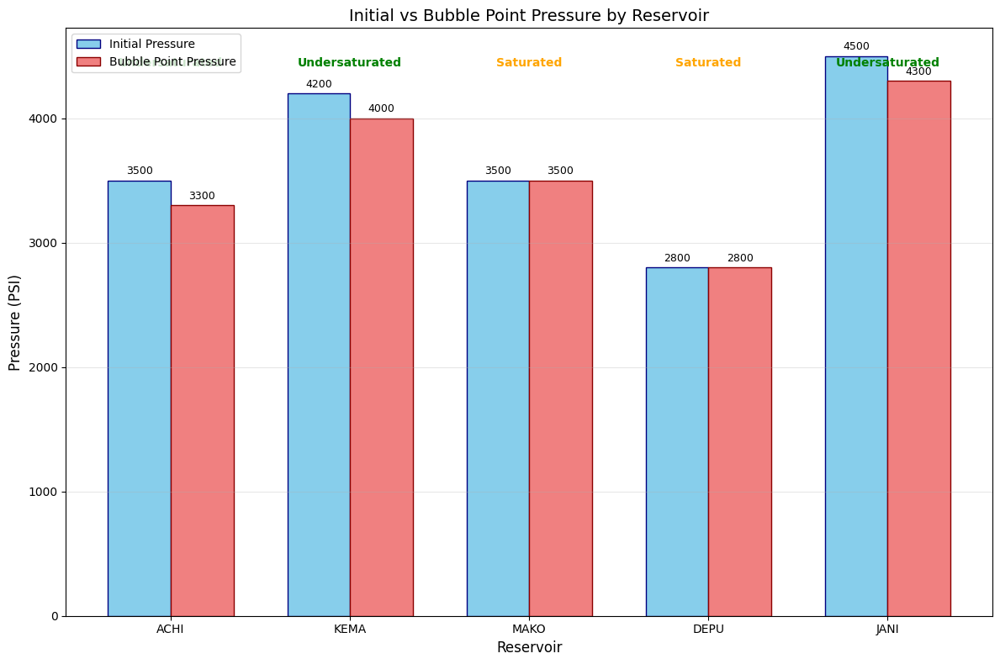

In [ ]:
# Create comparison chart with reservoir type labels
fig, ax = plt.subplots(figsize=(12, 8))

x = np.arange(len(reservoir_type_df))
width = 0.35

# Create grouped bars
bars1 = ax.bar(x - width/2, reservoir_type_df['Initial Pressure (PSI)'],
                width, label='Initial Pressure', color='skyblue', edgecolor='navy')
bars2 = ax.bar(x + width/2, reservoir_type_df['Bubble Point Pressure (PSI)'],
                width, label='Bubble Point Pressure', color='lightcoral', edgecolor='darkred')

# Customize chart
ax.set_xlabel('Reservoir', fontsize=12)
ax.set_ylabel('Pressure (PSI)', fontsize=12)
ax.set_title('Initial vs Bubble Point Pressure by Reservoir', fontsize=14)
ax.set_xticks(x)
ax.set_xticklabels(reservoir_type_df['Reservoir Name'])
ax.legend()
ax.grid(True, axis='y', alpha=0.3)

# Add value labels on bars
def autolabel(bars):
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{int(height)}',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),
                    textcoords="offset points",
                    ha='center', va='bottom',
                    fontsize=9)

autolabel(bars1)
autolabel(bars2)

# Add reservoir type labels at the top
for i, (idx, row) in enumerate(reservoir_type_df.iterrows()):
    res_type = row['Reservoir Type']
    color = 'green' if res_type == 'Undersaturated' else 'orange'
    ax.text(i, ax.get_ylim()[1] * 0.95, res_type,
            ha='center', va='top', fontweight='bold', color=color)

plt.tight_layout()
plt.show()

This reveals that two reservoirs (MAKO, DEPU) are saturated, meaning they started at bubble point pressure and have free gas present. ACHI, KEMA and JANI are undersaturated with initial pressures well above their bubble points, indicating single-phase oil production initially.

In [ ]:
# Merge reservoir type with well classification
reservoir_classification = reservoir_classification.merge(
    reservoir_type_df[['Reservoir Name', 'Reservoir Type']],
    on='Reservoir Name',
    how='left'
)

### Well Distribution by Reservoir Type
This pie chart shows the proportion of wells in saturated vs undersaturated reservoirs.

In [ ]:
wells_by_type = reservoir_classification.groupby('Reservoir Type')['Well'].count()

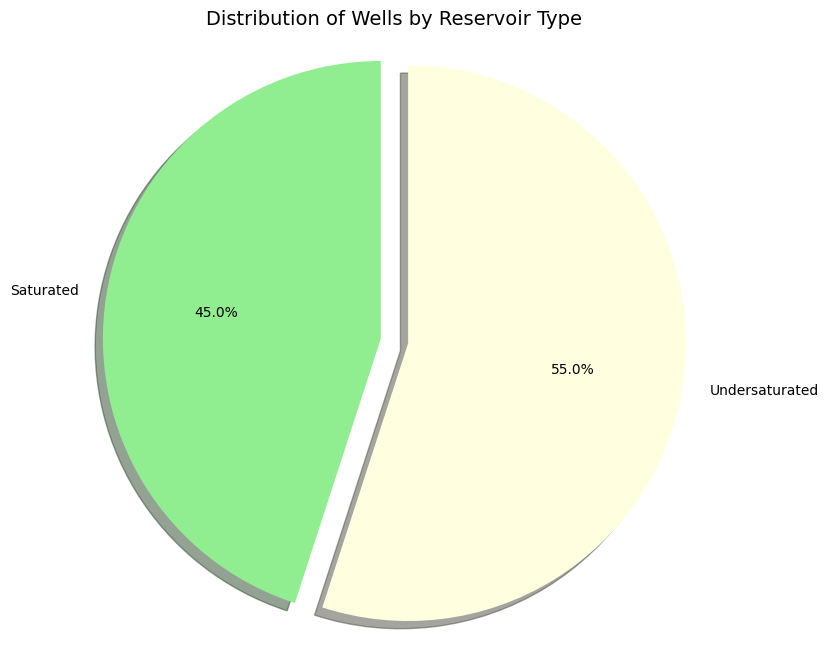

In [ ]:
# Create pie chart
plt.figure(figsize=(8, 8))
colors = ['lightgreen', 'lightyellow']
explode = (0.05, 0.05)
plt.pie(wells_by_type.values, labels=wells_by_type.index, autopct='%1.1f%%',
        colors=colors, explode=explode, shadow=True, startangle=90)
plt.title('Distribution of Wells by Reservoir Type', fontsize=14)
plt.axis('equal')
plt.show()

# Update classification dataframe
final_classification = reservoir_classification.copy()
final_classification['Well'] = final_classification['Well_Number']
final_classification = final_classification[['Well', 'Reservoir Name', 'Reservoir Type']].sort_values('Well')

## Task 3: Well Type Classification (Naturally Flowing vs Gas Lifted)

**Objective**: Classify wells as Naturally Flowing (NF) or Gas Lifted (GL) based on operational data.

**Engineering Indicators for Gas Lift:**
1. **High annulus pressure**: Gas injection requires sustained pressure (typically >500 psi)
2. **Injected gas volume**: Total gas production > Formation gas production
3. **Elevated GOR**: Significantly higher than reservoir solution GOR
4. **Stable annulus pressure**: GL wells maintain consistent injection pressure

In [ ]:
def classify_well_type(well_data, reservoir_classification, reservoir_info):
    """
    Classify wells as Naturally Flowing (NF) or Gas Lifted (GL).

    Engineering reasoning:
    - Gas lifted wells have gas injected through annulus (high annulus pressure)
    - Total gas production > Formation gas production (injected gas adds to total)
    - GOR significantly higher than reservoir solution GOR
    - Annulus pressure patterns differ between NF and GL wells
    """

    well_indicators = []

    for well_name in well_data['WELL_NAME'].unique():
        well_subset = well_data[well_data['WELL_NAME'] == well_name].copy()

        # Get reservoir and solution GOR for this well
        reservoir = reservoir_classification[
            reservoir_classification['Well'] == well_name
        ]['Reservoir Name'].values[0]

        sol_gor = reservoir_info[
            reservoir_info['Reservoir Name'] == reservoir
        ]['Solution Gas-Oil-Ratio (SCF/BBL)'].values[0]

        # Calculate gas lift indicators

        # Indicator 1: Annulus pressure statistics
        avg_annulus_pressure = well_subset['ANNULUS_PRESS (PSI)'].mean()
        min_annulus_pressure = well_subset['ANNULUS_PRESS (PSI)'].min()
        annulus_std = well_subset['ANNULUS_PRESS (PSI)'].std()

        # Indicator 2: Injected gas volume (Total - Formation gas)
        well_subset['INJECTED_GAS'] = (
            well_subset['CUMULATIVE_TOTAL_GAS_PROD (MSCF)'] -
            well_subset['CUMULATIVE_FORMATION_GAS_PROD (MSCF)']
        )
        total_injected_gas = well_subset['INJECTED_GAS'].max()

        # Indicator 3: GOR comparison
        avg_gor = well_subset['GOR'].mean()
        gor_ratio = avg_gor / sol_gor if sol_gor > 0 else 1

        well_indicators.append({
            'Well': well_name,
            'Avg_Annulus_Pressure': avg_annulus_pressure,
            'Min_Annulus_Pressure': min_annulus_pressure,
            'Total_Injected_Gas': total_injected_gas,
            'Avg_GOR': avg_gor,
            'Solution_GOR': sol_gor,
            'GOR_Ratio': gor_ratio,
            'Annulus_Pressure_Std': annulus_std
        })

    indicators_df = pd.DataFrame(well_indicators)

    # Classification logic based on engineering thresholds
    def classify_single_well(row):
        """Apply multi-criteria classification for gas lift detection"""
        # Engineering-based thresholds
        high_annulus_threshold = 500  # psi - typical gas injection pressure
        min_annulus_threshold = 300   # psi - minimum for sustained injection
        gor_ratio_threshold = 1.5     # 50% higher than solution GOR

        # Score-based classification
        gl_indicators = 0

        if row['Avg_Annulus_Pressure'] > high_annulus_threshold:
            gl_indicators += 2  # Strong indicator

        if row['Min_Annulus_Pressure'] > min_annulus_threshold:
            gl_indicators += 1  # Maintains injection pressure

        if row['Total_Injected_Gas'] > 1000:  # Significant injected gas (MSCF)
            gl_indicators += 2  # Strong indicator

        if row['GOR_Ratio'] > gor_ratio_threshold:
            gl_indicators += 1

        # Need strong evidence (score >= 3) for gas lift classification
        return 'GL' if gl_indicators >= 3 else 'NF'

    indicators_df['Well Type'] = indicators_df.apply(classify_single_well, axis=1)

    return indicators_df

# Apply well type classification
well_type_indicators = classify_well_type(well_data, reservoir_classification, reservoir_info)

### Comprehensive Well Type Analysis Dashboard
This multi-panel visualization provides various perspectives on the NF vs GL classification.

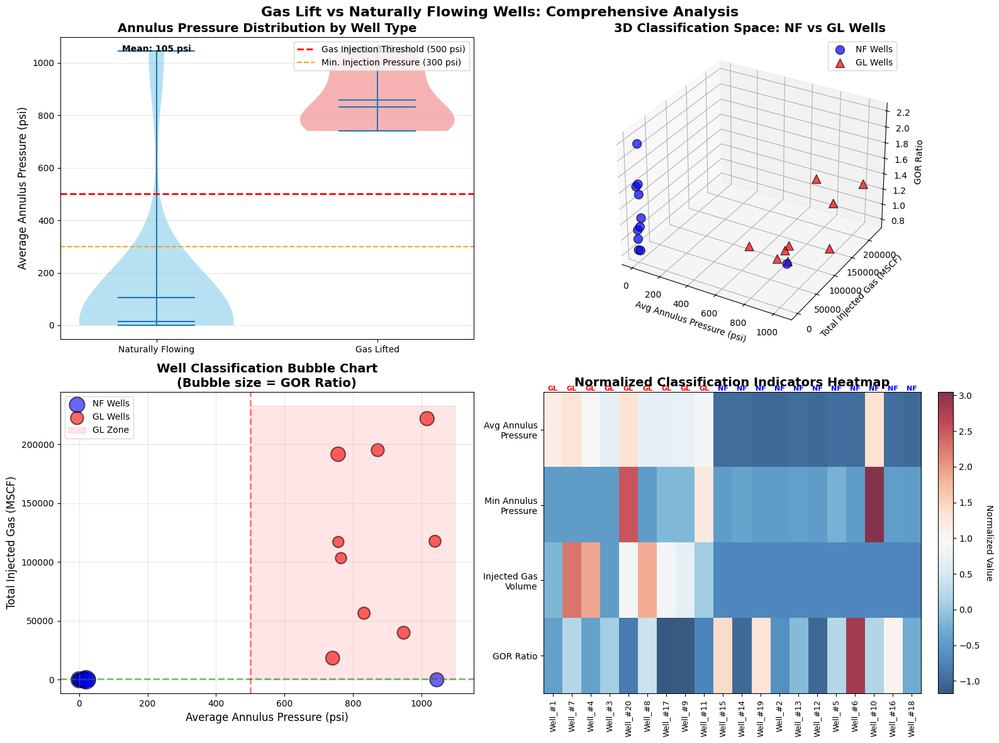

In [ ]:
# Enhanced Visualization: Comprehensive Well Type Classification Overview
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Subplot 1: Annulus Pressure Distribution with Violin Plot
ax1 = axes[0, 0]
# Create violin plot for distribution shape
violin_parts = ax1.violinplot([well_type_indicators[well_type_indicators['Well Type'] == 'NF']['Avg_Annulus_Pressure'].values,
                               well_type_indicators[well_type_indicators['Well Type'] == 'GL']['Avg_Annulus_Pressure'].values],
                              positions=[0, 1], widths=0.7, showmeans=True, showmedians=True)

# Customize violin colors
colors = ['skyblue', 'lightcoral']
for i, pc in enumerate(violin_parts['bodies']):
    pc.set_facecolor(colors[i])
    pc.set_alpha(0.6)

# Add threshold lines
ax1.axhline(y=500, color='red', linestyle='--', linewidth=2, label='Gas Injection Threshold (500 psi)')
ax1.axhline(y=300, color='orange', linestyle='--', linewidth=1.5, label='Min. Injection Pressure (300 psi)')
ax1.set_xticks([0, 1])
ax1.set_xticklabels(['Naturally Flowing', 'Gas Lifted'])
ax1.set_ylabel('Average Annulus Pressure (psi)', fontsize=12)
ax1.set_title('Annulus Pressure Distribution by Well Type', fontsize=14, fontweight='bold')
ax1.legend(loc='upper right')
ax1.grid(True, alpha=0.3, axis='y')

# Add mean values
nf_mean = well_type_indicators[well_type_indicators['Well Type'] == 'NF']['Avg_Annulus_Pressure'].mean()
gl_mean = well_type_indicators[well_type_indicators['Well Type'] == 'GL']['Avg_Annulus_Pressure'].mean()
ax1.text(0, ax1.get_ylim()[1] * 0.95, f'Mean: {nf_mean:.0f} psi', ha='center', fontsize=10, fontweight='bold')
ax1.text(1, ax1.get_ylim()[1] * 0.95, f'Mean: {gl_mean:.0f} psi', ha='center', fontsize=10, fontweight='bold')

# Subplot 2: 3D Scatter Plot
ax2 = axes[0, 1]
ax2.remove()  # Remove 2D axis
ax2 = fig.add_subplot(2, 2, 2, projection='3d')

# Create 3D visualization
for well_type, color, marker in [('NF', 'blue', 'o'), ('GL', 'red', '^')]:
    data = well_type_indicators[well_type_indicators['Well Type'] == well_type]
    ax2.scatter(data['Avg_Annulus_Pressure'],
                data['Total_Injected_Gas'],
                data['GOR_Ratio'],
                label=f'{well_type} Wells',
                alpha=0.7,
                s=100,
                color=color,
                marker=marker,
                edgecolor='black')

ax2.set_xlabel('Avg Annulus Pressure (psi)', fontsize=10)
ax2.set_ylabel('Total Injected Gas (MSCF)', fontsize=10)
ax2.set_zlabel('GOR Ratio', fontsize=10)
ax2.set_title('3D Classification Space: NF vs GL Wells', fontsize=14, fontweight='bold')
ax2.legend()

# Subplot 3: Bubble Chart
ax3 = axes[1, 0]
# Bubble size represents GOR ratio
size_scale = 200
for well_type, color in [('NF', 'blue'), ('GL', 'red')]:
    data = well_type_indicators[well_type_indicators['Well Type'] == well_type]
    sizes = data['GOR_Ratio'] * size_scale
    scatter = ax3.scatter(data['Avg_Annulus_Pressure'],
                         data['Total_Injected_Gas'],
                         s=sizes,
                         alpha=0.6,
                         color=color,
                         edgecolor='black',
                         linewidth=1.5,
                         label=f'{well_type} Wells')

# Add classification zones
ax3.axvline(x=500, color='red', linestyle='--', alpha=0.5, linewidth=2)
ax3.axhline(y=1000, color='green', linestyle='--', alpha=0.5, linewidth=2)
ax3.fill_between([500, ax3.get_xlim()[1]], 0, ax3.get_ylim()[1],
                 alpha=0.1, color='red', label='GL Zone')

ax3.set_xlabel('Average Annulus Pressure (psi)', fontsize=12)
ax3.set_ylabel('Total Injected Gas (MSCF)', fontsize=12)
ax3.set_title('Well Classification Bubble Chart\n(Bubble size = GOR Ratio)', fontsize=14, fontweight='bold')
ax3.legend()
ax3.grid(True, alpha=0.3)

# Subplot 4: Classification Indicators Heatmap
ax4 = axes[1, 1]
# Prepare data for heatmap
indicators_matrix = well_type_indicators[['Avg_Annulus_Pressure', 'Min_Annulus_Pressure',
                                         'Total_Injected_Gas', 'GOR_Ratio']].copy()
indicators_matrix['Well Type'] = well_type_indicators['Well Type']

# Normalize for visualization
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
normalized_data = scaler.fit_transform(indicators_matrix.iloc[:, :-1])
normalized_df = pd.DataFrame(normalized_data,
                            columns=['Avg Annulus\nPressure', 'Min Annulus\nPressure',
                                   'Injected Gas\nVolume', 'GOR Ratio'],
                            index=well_type_indicators['Well'])

# Sort by well type
sorted_indices = indicators_matrix.sort_values('Well Type').index
normalized_df = normalized_df.iloc[sorted_indices]

# Create heatmap
im = ax4.imshow(normalized_df.T, aspect='auto', cmap='RdBu_r', alpha=0.8)
ax4.set_xticks(range(len(normalized_df)))
ax4.set_xticklabels(normalized_df.index, rotation=90, fontsize=9)
ax4.set_yticks(range(len(normalized_df.columns)))
ax4.set_yticklabels(normalized_df.columns)
ax4.set_title('Normalized Classification Indicators Heatmap', fontsize=14, fontweight='bold')

# Add colorbar
cbar = plt.colorbar(im, ax=ax4, fraction=0.046, pad=0.04)
cbar.set_label('Normalized Value', rotation=270, labelpad=15)

# Add well type annotations
well_types = indicators_matrix.sort_values('Well Type')['Well Type']
for i, wt in enumerate(well_types):
    color = 'red' if wt == 'GL' else 'blue'
    ax4.text(i, -0.5, wt, ha='center', va='bottom', color=color, fontweight='bold', fontsize=8)

plt.suptitle('Gas Lift vs Naturally Flowing Wells: Comprehensive Analysis', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

The annulus pressure distribution shows a dramatic separation - naturally flowing wells cluster around 105 psi while gas lifted wells average 859 psi. The 500+ psi threshold we used makes perfect engineering sense. The bubble chart reinforces this by showing GL wells in the upper right quadrant with both high annulus pressure and significant injected gas volumes.

### Statistical Summary Dashboard
This dashboard provides quantitative comparisons and distribution analysis of key indicators.

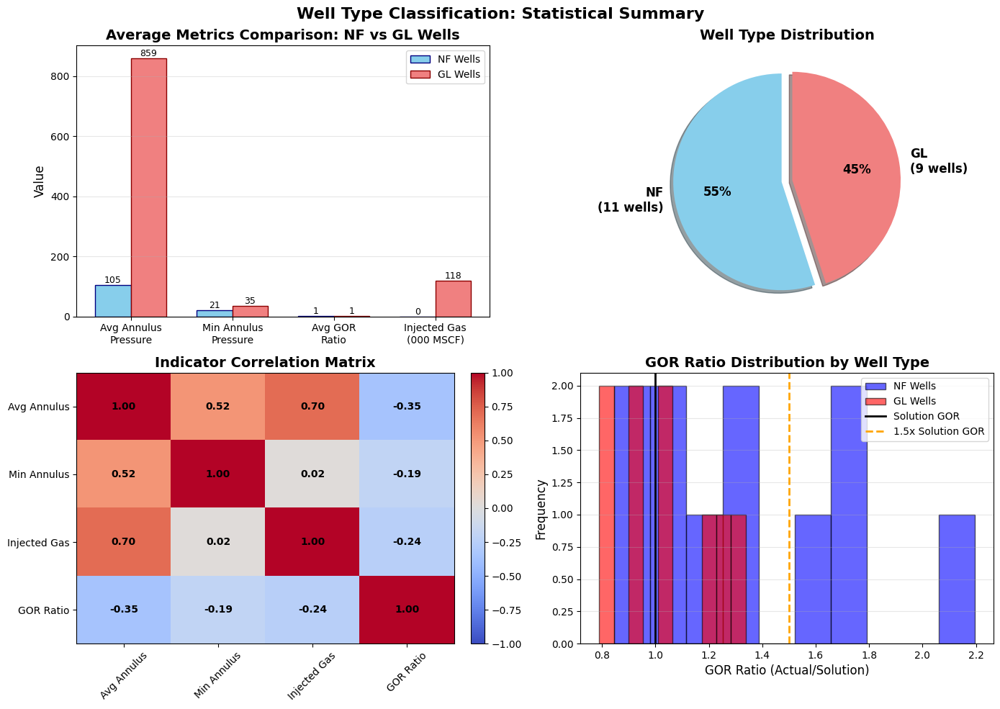

In [ ]:
# Statistical Summary Dashboard
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Subplot 1: Bar chart comparison of key metrics
ax1 = axes[0, 0]
metrics = ['Avg Annulus\nPressure', 'Min Annulus\nPressure', 'Avg GOR\nRatio', 'Injected Gas\n(000 MSCF)']
nf_values = [
    well_type_indicators[well_type_indicators['Well Type'] == 'NF']['Avg_Annulus_Pressure'].mean(),
    well_type_indicators[well_type_indicators['Well Type'] == 'NF']['Min_Annulus_Pressure'].mean(),
    well_type_indicators[well_type_indicators['Well Type'] == 'NF']['GOR_Ratio'].mean(),
    well_type_indicators[well_type_indicators['Well Type'] == 'NF']['Total_Injected_Gas'].mean() / 1000
]
gl_values = [
    well_type_indicators[well_type_indicators['Well Type'] == 'GL']['Avg_Annulus_Pressure'].mean(),
    well_type_indicators[well_type_indicators['Well Type'] == 'GL']['Min_Annulus_Pressure'].mean(),
    well_type_indicators[well_type_indicators['Well Type'] == 'GL']['GOR_Ratio'].mean(),
    well_type_indicators[well_type_indicators['Well Type'] == 'GL']['Total_Injected_Gas'].mean() / 1000
]

x = np.arange(len(metrics))
width = 0.35

bars1 = ax1.bar(x - width/2, nf_values, width, label='NF Wells', color='skyblue', edgecolor='navy')
bars2 = ax1.bar(x + width/2, gl_values, width, label='GL Wells', color='lightcoral', edgecolor='darkred')

ax1.set_ylabel('Value', fontsize=12)
ax1.set_title('Average Metrics Comparison: NF vs GL Wells', fontsize=14, fontweight='bold')
ax1.set_xticks(x)
ax1.set_xticklabels(metrics)
ax1.legend()
ax1.grid(True, axis='y', alpha=0.3)

# Add value labels
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.0f}', ha='center', va='bottom', fontsize=9)

# Subplot 2: Pie chart of well distribution
ax2 = axes[0, 1]
well_counts = well_type_indicators['Well Type'].value_counts()
colors = ['skyblue', 'lightcoral']
explode = (0.05, 0.05)
wedges, texts, autotexts = ax2.pie(well_counts.values,
                                   labels=[f'{k}\n({v} wells)' for k, v in well_counts.items()],
                                   autopct='%1.0f%%',
                                   colors=colors,
                                   explode=explode,
                                   shadow=True,
                                   startangle=90,
                                   textprops={'fontsize': 12, 'fontweight': 'bold'})
ax2.set_title('Well Type Distribution', fontsize=14, fontweight='bold')

# Subplot 3: Correlation matrix
ax3 = axes[1, 0]
correlation_data = well_type_indicators[['Avg_Annulus_Pressure', 'Min_Annulus_Pressure',
                                       'Total_Injected_Gas', 'GOR_Ratio']].corr()
im = ax3.imshow(correlation_data, cmap='coolwarm', aspect='auto', vmin=-1, vmax=1)
ax3.set_xticks(range(len(correlation_data.columns)))
ax3.set_yticks(range(len(correlation_data.columns)))
ax3.set_xticklabels(['Avg Annulus', 'Min Annulus', 'Injected Gas', 'GOR Ratio'], rotation=45)
ax3.set_yticklabels(['Avg Annulus', 'Min Annulus', 'Injected Gas', 'GOR Ratio'])
ax3.set_title('Indicator Correlation Matrix', fontsize=14, fontweight='bold')

# Add correlation values
for i in range(len(correlation_data.columns)):
    for j in range(len(correlation_data.columns)):
        text = ax3.text(j, i, f'{correlation_data.iloc[i, j]:.2f}',
                       ha="center", va="center", color="black", fontweight='bold')

plt.colorbar(im, ax=ax3, fraction=0.046, pad=0.04)

# Subplot 4: GOR ratio distribution
ax4 = axes[1, 1]
ax4.hist(well_type_indicators[well_type_indicators['Well Type'] == 'NF']['GOR_Ratio'],
         bins=10, alpha=0.6, label='NF Wells', color='blue', edgecolor='black')
ax4.hist(well_type_indicators[well_type_indicators['Well Type'] == 'GL']['GOR_Ratio'],
         bins=10, alpha=0.6, label='GL Wells', color='red', edgecolor='black')
ax4.axvline(x=1.0, color='black', linestyle='-', linewidth=2, label='Solution GOR')
ax4.axvline(x=1.5, color='orange', linestyle='--', linewidth=2, label='1.5x Solution GOR')
ax4.set_xlabel('GOR Ratio (Actual/Solution)', fontsize=12)
ax4.set_ylabel('Frequency', fontsize=12)
ax4.set_title('GOR Ratio Distribution by Well Type', fontsize=14, fontweight='bold')
ax4.legend()
ax4.grid(True, axis='y', alpha=0.3)

plt.suptitle('Well Type Classification: Statistical Summary', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# Merge well type with main classification
reservoir_classification = reservoir_classification.merge(
    well_type_indicators[['Well', 'Well Type']],
    on='Well',
    how='left'
)


The statistical summary confirms our classification captured real operational differences. The 45% of wells requiring gas lift (9 wells) shows a mature field needing pressure support. The correlation matrix reveals strong relationships between our key indicators - annulus pressure and injected gas show 0.70 correlation, validating that high annulus pressure indicates gas injection.

## Task 4: Production Type Classification (Steady vs Unsteady)

**Objective**: Classify wells based on production stability.

**Criterion**: Wells are considered **Unsteady** if oil production drops by >50% at least once within any 3-6 month interval. Otherwise, they are classified as **Steady**.

This classification helps identify wells requiring intervention or experiencing operational issues.

In [ ]:
def classify_production_type(well_data):
    """
    Classify wells as Steady or Unsteady based on oil production drops.

    Engineering rationale:
    - Unsteady wells show significant production drops (>50%)
    - May indicate: mechanical failures, reservoir issues, or operational problems
    - Time window (3-6 months) captures both short-term and seasonal effects
    """

    production_classifications = []

    for well_name in well_data['WELL_NAME'].unique():
        well_subset = well_data[well_data['WELL_NAME'] == well_name].copy()
        well_subset = well_subset.sort_values('PROD_DATE')

        # Get production data
        oil_rates = well_subset['OIL_RATE'].values
        dates = pd.to_datetime(well_subset['PROD_DATE'])

        # Initialize tracking
        is_unsteady = False
        drop_events = []

        # Define window sizes (90-180 days for 3-6 months)
        min_window = 90
        max_window = 180

        # Sliding window analysis
        for window_size in range(min_window, max_window + 1, 30):
            for start_idx in range(len(dates) - 1):
                start_date = dates.iloc[start_idx]
                end_date = start_date + pd.Timedelta(days=window_size)

                # Get data within window
                window_mask = (dates >= start_date) & (dates <= end_date)
                window_rates = oil_rates[window_mask]
                window_dates = dates[window_mask]

                if len(window_rates) < 5:  # Need sufficient data
                    continue

                # Find peak production in window
                peak_rate = np.max(window_rates)
                peak_idx = np.argmax(window_rates)

                if peak_rate < 10:  # Skip very low production periods
                    continue

                # Check for significant drops after peak
                for i in range(peak_idx + 1, len(window_rates)):
                    current_rate = window_rates[i]
                    drop_percentage = (peak_rate - current_rate) / peak_rate * 100

                    if drop_percentage > 50:
                        is_unsteady = True
                        drop_events.append({
                            'start_date': window_dates.iloc[peak_idx],
                            'end_date': window_dates.iloc[i],
                            'peak_rate': peak_rate,
                            'drop_rate': current_rate,
                            'drop_percentage': drop_percentage,
                            'window_days': window_size
                        })
                        break

                if is_unsteady:
                    break

            if is_unsteady:
                break

        # Store results
        production_classifications.append({
            'Well': well_name,
            'Production Type': 'Unsteady' if is_unsteady else 'Steady',
            'Drop_Events': len(drop_events),
            'Max_Drop_Percentage': max([e['drop_percentage'] for e in drop_events]) if drop_events else 0,
            'First_Drop_Date': min([e['start_date'] for e in drop_events]) if drop_events else None,
            'Drop_Details': drop_events
        })

    return pd.DataFrame(production_classifications)

# Apply classification
production_type_df = classify_production_type(well_data)

### Production Profile Visualization with Drop Event Highlighting
This visualization clearly shows steady vs unsteady production patterns and highlights significant drop events.

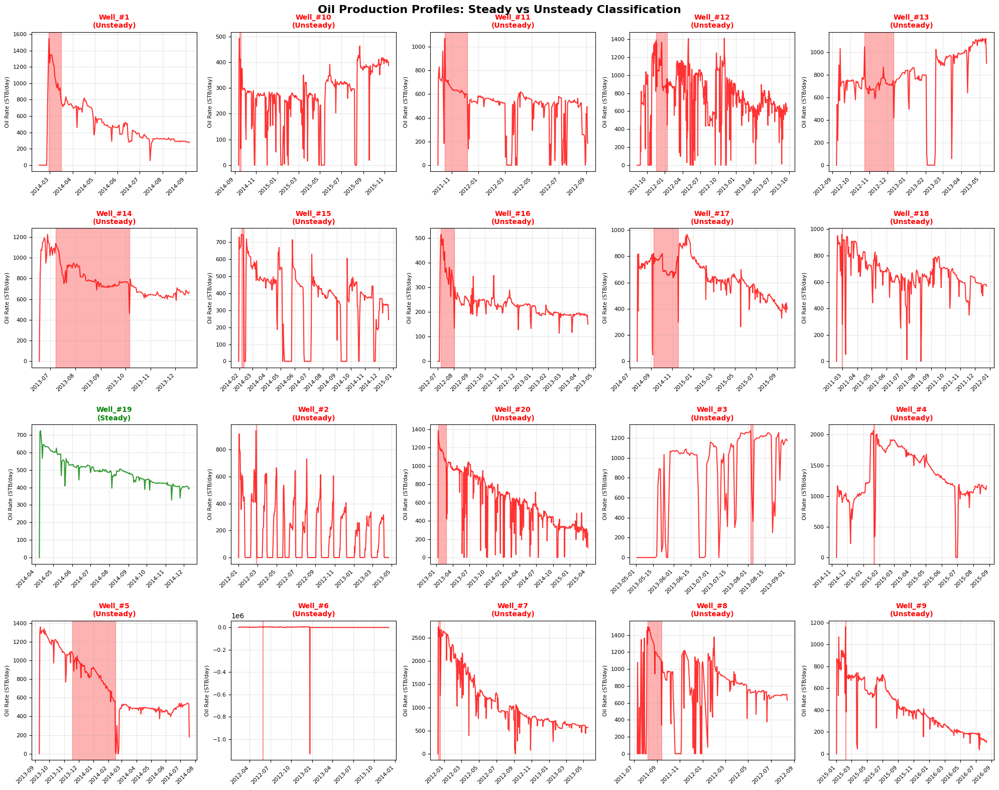

In [ ]:
# Visualization 1: Production profiles with drop events
fig, axes = plt.subplots(4, 5, figsize=(20, 16), sharex=False)
axes = axes.flatten()

for idx, (_, well_info) in enumerate(production_type_df.iterrows()):
    if idx >= 20:
        break

    ax = axes[idx]
    well_name = well_info['Well']
    prod_type = well_info['Production Type']

    # Get well data
    well_subset = well_data[well_data['WELL_NAME'] == well_name].sort_values('PROD_DATE')

    # Plot oil rate with color coding
    color = 'green' if prod_type == 'Steady' else 'red'
    ax.plot(well_subset['PROD_DATE'], well_subset['OIL_RATE'],
            color=color, linewidth=1.5, alpha=0.8)

    # Highlight drop periods for unsteady wells
    if prod_type == 'Unsteady' and well_info['Drop_Details']:
        for drop_event in well_info['Drop_Details']:
            ax.axvspan(drop_event['start_date'], drop_event['end_date'],
                      alpha=0.3, color='red')

    # Format
    ax.set_title(f'{well_name}\n({prod_type})', fontsize=10, fontweight='bold', color=color)
    ax.set_ylabel('Oil Rate (STB/day)', fontsize=8)
    ax.tick_params(axis='both', labelsize=8)
    ax.grid(True, alpha=0.3)
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha='right')

plt.suptitle('Oil Production Profiles: Steady vs Unsteady Classification', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

This chart displays the daily oil production rates for all 20 wells over time, comparing steady versus unsteady production classifications. 19 out of 20 wells are classified as unsteady, with only Well #19 showing steady production. The red shaded areas on the unsteady wells highlight the specific time periods where significant production drops occurred. These drops appear quite dramatic in many cases - for instance, Well #1 shows a sharp decline from around 1600 STB/day to below 400 STB/day.

In [ ]:
steady_count = len(production_type_df[production_type_df['Production Type'] == 'Steady'])
unsteady_count = len(production_type_df[production_type_df['Production Type'] == 'Unsteady'])

### Production Type Statistical Analysis
This comprehensive analysis shows the distribution and characteristics of production drops.

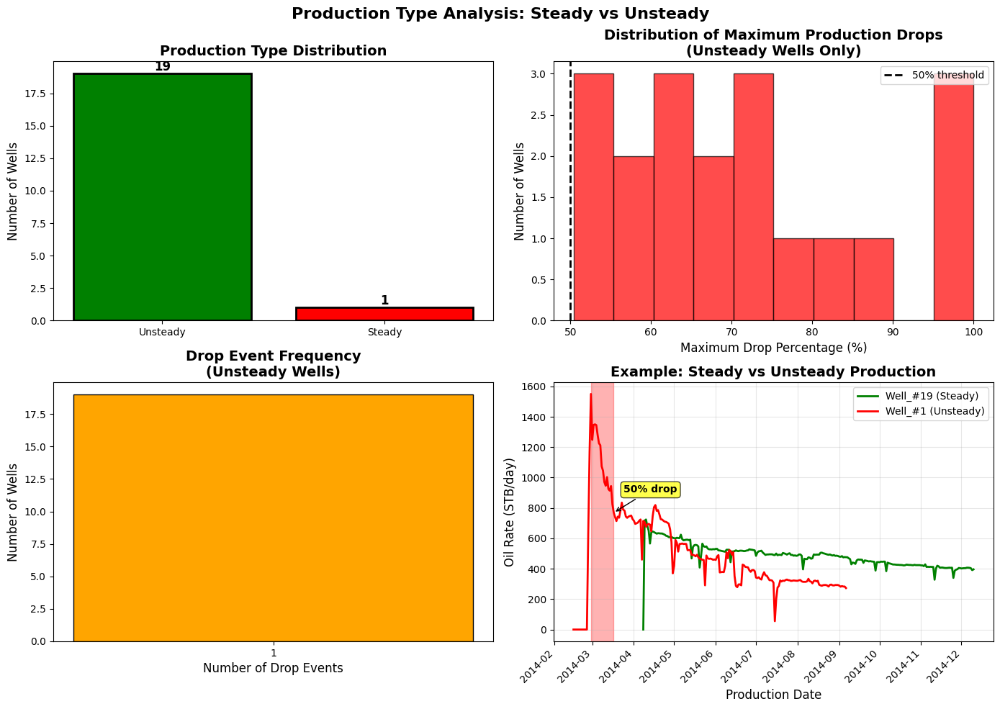

In [ ]:
# Statistical comparison visualization
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Subplot 1: Classification counts
ax1 = axes[0, 0]
prod_counts = production_type_df['Production Type'].value_counts()
bars = ax1.bar(prod_counts.index, prod_counts.values,
                color=['green', 'red'], edgecolor='black', linewidth=2)
ax1.set_ylabel('Number of Wells', fontsize=12)
ax1.set_title('Production Type Distribution', fontsize=14, fontweight='bold')

for bar in bars:
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height,
             f'{int(height)}', ha='center', va='bottom', fontsize=12, fontweight='bold')

# Subplot 2: Drop percentage distribution
ax2 = axes[0, 1]
unsteady_drops = production_type_df[production_type_df['Production Type'] == 'Unsteady']['Max_Drop_Percentage']
if len(unsteady_drops) > 0:
    ax2.hist(unsteady_drops, bins=10, color='red', alpha=0.7, edgecolor='black')
    ax2.axvline(x=50, color='black', linestyle='--', linewidth=2, label='50% threshold')
    ax2.set_xlabel('Maximum Drop Percentage (%)', fontsize=12)
    ax2.set_ylabel('Number of Wells', fontsize=12)
    ax2.set_title('Distribution of Maximum Production Drops\n(Unsteady Wells Only)', fontsize=14, fontweight='bold')
    ax2.legend()

# Subplot 3: Drop event frequency
ax3 = axes[1, 0]
unsteady_events = production_type_df[production_type_df['Production Type'] == 'Unsteady']['Drop_Events']
if len(unsteady_events) > 0:
    event_counts = unsteady_events.value_counts().sort_index()
    ax3.bar(event_counts.index, event_counts.values, color='orange', edgecolor='black')
    ax3.set_xlabel('Number of Drop Events', fontsize=12)
    ax3.set_ylabel('Number of Wells', fontsize=12)
    ax3.set_title('Drop Event Frequency\n(Unsteady Wells)', fontsize=14, fontweight='bold')
    ax3.set_xticks(event_counts.index)

# Subplot 4: Example comparison
ax4 = axes[1, 1]
steady_example = production_type_df[production_type_df['Production Type'] == 'Steady']['Well'].iloc[0] if steady_count > 0 else None
unsteady_example = production_type_df[production_type_df['Production Type'] == 'Unsteady']['Well'].iloc[0] if unsteady_count > 0 else None

if steady_example:
    steady_data = well_data[well_data['WELL_NAME'] == steady_example].sort_values('PROD_DATE')
    ax4.plot(steady_data['PROD_DATE'], steady_data['OIL_RATE'],
             'g-', linewidth=2, label=f'{steady_example} (Steady)')

if unsteady_example:
    unsteady_data = well_data[well_data['WELL_NAME'] == unsteady_example].sort_values('PROD_DATE')
    ax4.plot(unsteady_data['PROD_DATE'], unsteady_data['OIL_RATE'],
             'r-', linewidth=2, label=f'{unsteady_example} (Unsteady)')

    # Highlight first drop event
    drop_details = production_type_df[production_type_df['Well'] == unsteady_example]['Drop_Details'].iloc[0]
    for drop in drop_details[:1]:
        ax4.axvspan(drop['start_date'], drop['end_date'], alpha=0.3, color='red')
        ax4.annotate(f"{drop['drop_percentage']:.0f}% drop",
                    xy=(drop['end_date'], drop['drop_rate']),
                    xytext=(10, 20), textcoords='offset points',
                    fontsize=10, fontweight='bold',
                    bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.7),
                    arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0'))

ax4.set_xlabel('Production Date', fontsize=12)
ax4.set_ylabel('Oil Rate (STB/day)', fontsize=12)
ax4.set_title('Example: Steady vs Unsteady Production', fontsize=14, fontweight='bold')
ax4.legend()
ax4.grid(True, alpha=0.3)
plt.setp(ax4.xaxis.get_majorticklabels(), rotation=45, ha='right')

plt.suptitle('Production Type Analysis: Steady vs Unsteady', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# Merge with main classification
reservoir_classification = reservoir_classification.merge(
    production_type_df[['Well', 'Production Type']],
    on='Well',
    how='left'
)

The chart above provides a statistical breakdown of these production classifications. The top-left bar chart confirms the overwhelming dominance of unsteady wells - 19 versus just 1 steady well. The top-right histogram reveals that among the unsteady wells, most experienced production drops between 50% and 70%, though some had drops as severe as 100% (complete cessation of production). The bottom-left chart shows that all unsteady wells experienced exactly one major drop event during the monitoring period. The bottom-right comparison illustrates the difference between steady and unsteady production - Well #19 maintains relatively stable production while Well #1 shows that characteristic sharp 50% drop marked with the yellow annotation.

## Task 5: Formation GOR Trend Classification

**Objective**: Classify wells based on their Formation GOR trend relative to solution GOR.

**Categories**:
- **bSolGOR**: Producing at or below solution GOR (only dissolved gas)
- **aSolGOR**: Producing above solution GOR (free gas production)
- **Combo**: Shows both behaviors over time

**Note**: We use Formation GOR (excluding injected gas) for accurate reservoir behavior analysis.

In [ ]:
# Calculate Formation GOR (using formation gas only, not total gas)

# Calculate formation gas rate from cumulative
well_data['FORMATION_GAS_RATE'] = well_data.groupby('WELL_NAME')['CUMULATIVE_FORMATION_GAS_PROD (MSCF)'].diff()
well_data['FORMATION_GAS_RATE'] = well_data['FORMATION_GAS_RATE'].fillna(0)

# Calculate Formation GOR in SCF/STB
well_data['FORMATION_GOR'] = np.where(well_data['OIL_RATE'] > 0,
                                      well_data['FORMATION_GAS_RATE'] / well_data['OIL_RATE'] * 1000,
                                      np.nan)

# Handle infinities
well_data['FORMATION_GOR'] = well_data['FORMATION_GOR'].replace([np.inf, -np.inf], np.nan)

def classify_gor_trend(well_data, reservoir_classification, reservoir_info):
    """
    Classify wells based on Formation GOR trend relative to solution GOR.

    Engineering rationale:
    - Below solution GOR: Only dissolved gas production
    - Above solution GOR: Free gas phase present
    - Trend changes indicate reservoir pressure dropping below bubble point
    """

    gor_classifications = []

    for well_name in well_data['WELL_NAME'].unique():
        well_subset = well_data[well_data['WELL_NAME'] == well_name].copy()
        well_subset = well_subset.sort_values('PROD_DATE')

        # Get reservoir solution GOR
        reservoir = reservoir_classification[
            reservoir_classification['Well'] == well_name
        ]['Reservoir Name'].values[0]

        solution_gor = reservoir_info[
            reservoir_info['Reservoir Name'] == reservoir
        ]['Solution Gas-Oil-Ratio (SCF/BBL)'].values[0]

        # Filter valid data
        valid_gor = well_subset[(well_subset['FORMATION_GOR'] > 0) &
                               (well_subset['FORMATION_GOR'] < 10000) &  # Remove outliers
                               (well_subset['OIL_RATE'] > 10)]

        if len(valid_gor) < 10:
            # Default if insufficient data
            gor_trend = 'bSolGOR'
            avg_gor = solution_gor
            early_gor = solution_gor
            late_gor = solution_gor
            above_periods = 0
            below_periods = 0
        else:
            gor_values = valid_gor['FORMATION_GOR'].values
            avg_gor = np.mean(gor_values)

            # Early vs late production analysis
            early_cutoff = int(len(gor_values) * 0.25)
            early_gor = np.mean(gor_values[:early_cutoff])

            late_cutoff = int(len(gor_values) * 0.75)
            late_gor = np.mean(gor_values[late_cutoff:])

            # Tolerance band (±10% for measurement uncertainty)
            tolerance = 0.10
            upper_bound = solution_gor * (1 + tolerance)
            lower_bound = solution_gor * (1 - tolerance)

            # Count periods above/below solution GOR
            above_periods = np.sum(gor_values > upper_bound)
            below_periods = np.sum(gor_values <= upper_bound)

            # Classification logic
            above_ratio = above_periods / len(gor_values)

            if above_ratio > 0.80:  # Predominantly above
                gor_trend = 'aSolGOR'
            elif above_ratio < 0.20:  # Predominantly below
                gor_trend = 'bSolGOR'
            else:  # Mixed
                gor_trend = 'Combo'

            # Check for transitions
            if early_gor <= upper_bound and late_gor > upper_bound:
                gor_trend = 'Combo'  # Transition from below to above
            elif early_gor > upper_bound and late_gor <= upper_bound:
                gor_trend = 'Combo'  # Unusual transition from above to below

        gor_classifications.append({
            'Well': well_name,
            'Formation GOR Trend': gor_trend,
            'Solution_GOR': solution_gor,
            'Avg_Formation_GOR': avg_gor,
            'Early_GOR': early_gor,
            'Late_GOR': late_gor,
            'GOR_Ratio': avg_gor / solution_gor if solution_gor > 0 else 1,
            'Above_Periods_Pct': (above_periods / (above_periods + below_periods) * 100)
                                if (above_periods + below_periods) > 0 else 0
        })

    return pd.DataFrame(gor_classifications)

# Apply classification
gor_trend_df = classify_gor_trend(well_data, reservoir_classification, reservoir_info)

### Formation GOR Trend Visualization
This comprehensive view shows how each well's Formation GOR compares to its reservoir's solution GOR over time.

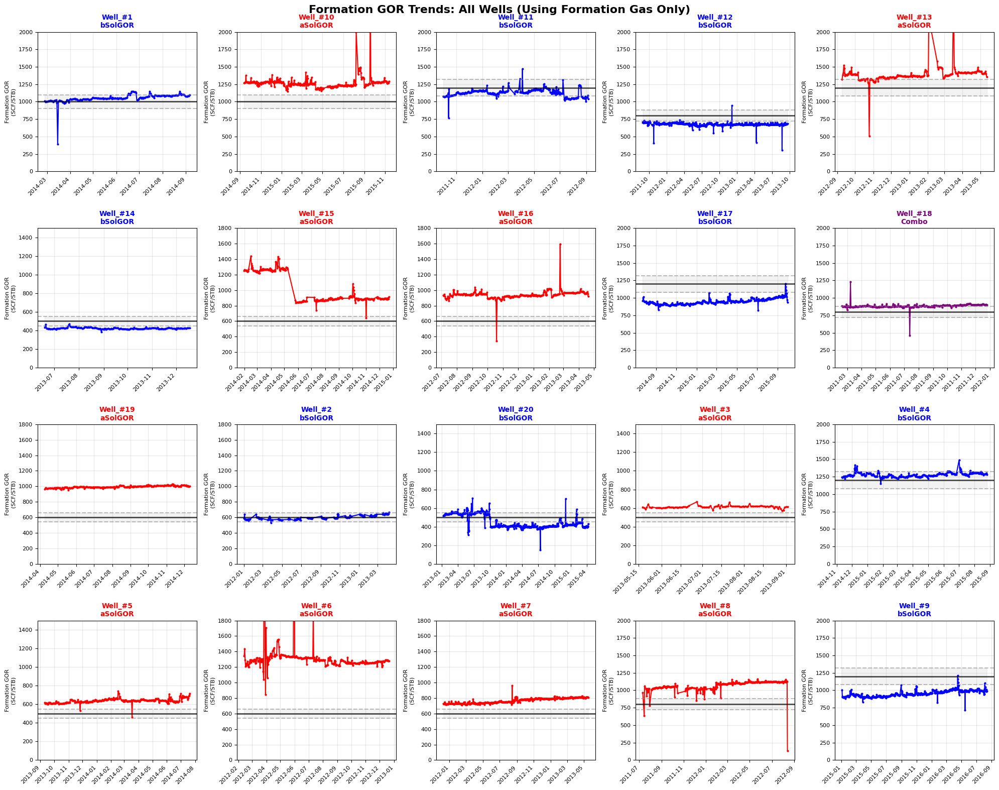

In [ ]:
# Visualization: Formation GOR trends for all wells
fig, axes = plt.subplots(4, 5, figsize=(20, 16))
axes = axes.flatten()

for idx, (_, well_info) in enumerate(gor_trend_df.iterrows()):
    if idx >= 20:
        break

    ax = axes[idx]
    well_name = well_info['Well']
    trend = well_info['Formation GOR Trend']
    sol_gor = well_info['Solution_GOR']

    # Get well data
    well_subset = well_data[well_data['WELL_NAME'] == well_name]
    valid_data = well_subset[(well_subset['FORMATION_GOR'] > 0) &
                            (well_subset['FORMATION_GOR'] < 10000) &
                            (well_subset['OIL_RATE'] > 10)]

    if len(valid_data) > 0:
        # Plot Formation GOR with color coding
        color_map = {'bSolGOR': 'blue', 'aSolGOR': 'red', 'Combo': 'purple'}
        ax.plot(valid_data['PROD_DATE'], valid_data['FORMATION_GOR'],
                color=color_map[trend], linewidth=1.5, marker='o', markersize=2)

        # Solution GOR reference line
        ax.axhline(y=sol_gor, color='black', linestyle='-', linewidth=2, alpha=0.7)

        # Tolerance band
        ax.axhline(y=sol_gor * 1.1, color='gray', linestyle='--', alpha=0.5)
        ax.axhline(y=sol_gor * 0.9, color='gray', linestyle='--', alpha=0.5)

        # Shade tolerance zone
        ax.fill_between(valid_data['PROD_DATE'], sol_gor * 0.9, sol_gor * 1.1,
                       alpha=0.1, color='gray')

    # Format
    ax.set_title(f'{well_name}\n{trend}', fontsize=10, fontweight='bold',
                 color=color_map.get(trend, 'black'))
    ax.set_ylabel('Formation GOR\n(SCF/STB)', fontsize=8)
    ax.set_ylim(0, min(2000, sol_gor * 3))  # Limit for visibility
    ax.tick_params(axis='both', labelsize=8)
    ax.grid(True, alpha=0.3)
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha='right')

plt.suptitle('Formation GOR Trends: All Wells (Using Formation Gas Only)',
             fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

The Formation GOR trends chart uses only formation gas (excluding any injected gas) to calculate the gas-oil ratio. Each well plot shows the Formation GOR in SCF/STB over time, with a black horizontal line representing the solution GOR for that well's reservoir. The classification system is clear: wells producing below or at solution GOR (bSolGOR) are shown in blue, those above (aSolGOR) in red, and combination behavior (Combo) in purple.

### Formation GOR Statistical Analysis
This analysis provides insights into GOR behavior patterns across different trend types.

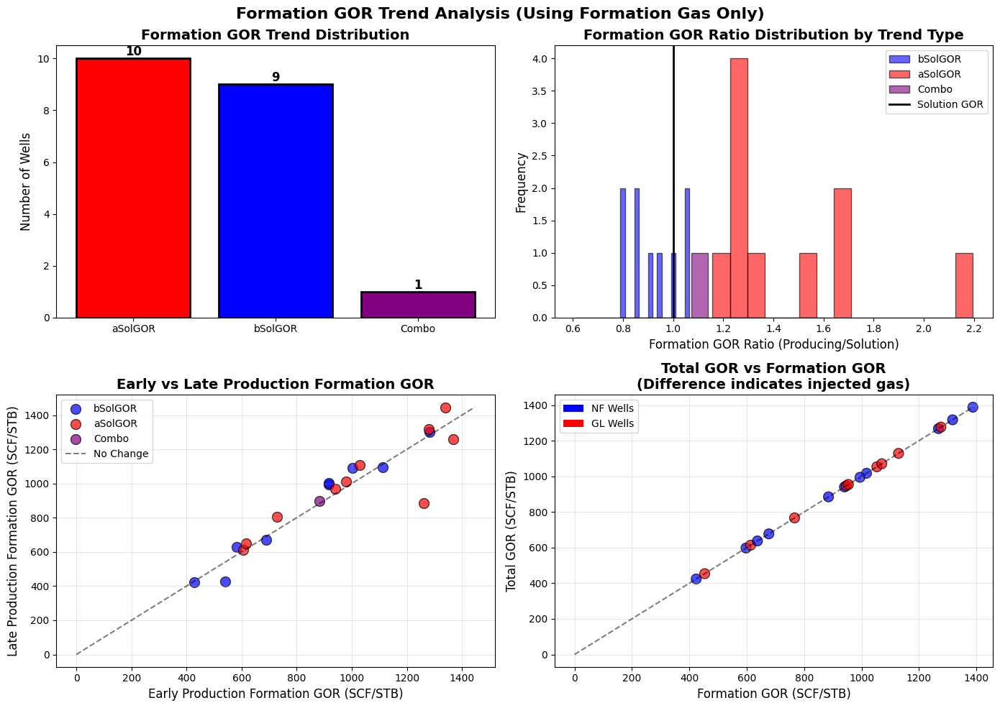

In [ ]:
# Statistical analysis visualization
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Subplot 1: Distribution by trend type
ax1 = axes[0, 0]
trend_counts = gor_trend_df['Formation GOR Trend'].value_counts()
colors = {'bSolGOR': 'blue', 'aSolGOR': 'red', 'Combo': 'purple'}
bars = ax1.bar(trend_counts.index, trend_counts.values,
                color=[colors[x] for x in trend_counts.index],
                edgecolor='black', linewidth=2)
ax1.set_ylabel('Number of Wells', fontsize=12)
ax1.set_title('Formation GOR Trend Distribution', fontsize=14, fontweight='bold')

for bar in bars:
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height,
             f'{int(height)}', ha='center', va='bottom', fontsize=12, fontweight='bold')

# Subplot 2: GOR ratio distribution
ax2 = axes[0, 1]
for trend in ['bSolGOR', 'aSolGOR', 'Combo']:
    data = gor_trend_df[gor_trend_df['Formation GOR Trend'] == trend]['GOR_Ratio']
    if len(data) > 0:
        ax2.hist(data, bins=15, alpha=0.6, label=trend, color=colors[trend], edgecolor='black')

ax2.axvline(x=1.0, color='black', linestyle='-', linewidth=2, label='Solution GOR')
ax2.set_xlabel('Formation GOR Ratio (Producing/Solution)', fontsize=12)
ax2.set_ylabel('Frequency', fontsize=12)
ax2.set_title('Formation GOR Ratio Distribution by Trend Type', fontsize=14, fontweight='bold')
ax2.legend()

# Subplot 3: Early vs Late GOR
ax3 = axes[1, 0]
for trend in ['bSolGOR', 'aSolGOR', 'Combo']:
    data = gor_trend_df[gor_trend_df['Formation GOR Trend'] == trend]
    if len(data) > 0:
        ax3.scatter(data['Early_GOR'], data['Late_GOR'],
                   label=trend, alpha=0.7, s=100,
                   color=colors[trend], edgecolor='black')

# Diagonal reference line
max_gor = max(gor_trend_df['Early_GOR'].max(), gor_trend_df['Late_GOR'].max())
ax3.plot([0, max_gor], [0, max_gor], 'k--', alpha=0.5, label='No Change')
ax3.set_xlabel('Early Production Formation GOR (SCF/STB)', fontsize=12)
ax3.set_ylabel('Late Production Formation GOR (SCF/STB)', fontsize=12)
ax3.set_title('Early vs Late Production Formation GOR', fontsize=14, fontweight='bold')
ax3.legend()
ax3.grid(True, alpha=0.3)

# Subplot 4: Total vs Formation GOR comparison
ax4 = axes[1, 1]
# Compare total GOR (includes injected gas) vs Formation GOR
total_gor_avg = []
formation_gor_avg = []
well_names = []

for well_name in well_data['WELL_NAME'].unique():
    well_subset = well_data[well_data['WELL_NAME'] == well_name]
    valid_total = well_subset[(well_subset['GOR'] > 0) & (well_subset['GOR'] < 10000) &
                             (well_subset['OIL_RATE'] > 10)]
    valid_formation = well_subset[(well_subset['FORMATION_GOR'] > 0) &
                                 (well_subset['FORMATION_GOR'] < 10000) &
                                 (well_subset['OIL_RATE'] > 10)]

    if len(valid_total) > 10 and len(valid_formation) > 10:
        total_gor_avg.append(valid_total['GOR'].mean())
        formation_gor_avg.append(valid_formation['FORMATION_GOR'].mean())
        well_names.append(well_name)

if total_gor_avg:
    # Color by well type
    well_types = []
    for well in well_names:
        wt = well_type_indicators[well_type_indicators['Well'] == well]['Well Type'].values[0]
        well_types.append(wt)

    colors_wt = ['red' if wt == 'GL' else 'blue' for wt in well_types]
    ax4.scatter(formation_gor_avg, total_gor_avg, c=colors_wt, alpha=0.7, s=100, edgecolor='black')

    # Diagonal line
    max_val = max(max(total_gor_avg), max(formation_gor_avg))
    ax4.plot([0, max_val], [0, max_val], 'k--', alpha=0.5, label='Total = Formation')

    # Legend
    from matplotlib.patches import Patch
    legend_elements = [Patch(facecolor='blue', label='NF Wells'),
                      Patch(facecolor='red', label='GL Wells')]
    ax4.legend(handles=legend_elements, loc='upper left')

    ax4.set_xlabel('Formation GOR (SCF/STB)', fontsize=12)
    ax4.set_ylabel('Total GOR (SCF/STB)', fontsize=12)
    ax4.set_title('Total GOR vs Formation GOR\n(Difference indicates injected gas)',
                  fontsize=14, fontweight='bold')
    ax4.grid(True, alpha=0.3)

plt.suptitle('Formation GOR Trend Analysis (Using Formation Gas Only)',
             fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# Merge with main classification
reservoir_classification = reservoir_classification.merge(
    gor_trend_df[['Well', 'Formation GOR Trend']],
    on='Well',
    how='left'
)

The chart above provides deeper insights into these GOR trends. The distribution shows a nearly even split - 10 wells with aSolGOR behavior and 9 with bSolGOR, plus 1 Combo well. The Formation GOR ratio histogram reveals that bSolGOR wells cluster around ratios of 0.8-1.0 (below or at solution GOR), while aSolGOR wells spread across higher ratios from 1.2 to 2.2 times the solution GOR.

In [ ]:
# Display current classification progress
reservoir_classification

,Well,Reservoir Name,Pressure_Differential,Max_BHFP,Reservoir_Pressure,Well_Number,Reservoir Type,Well Type,Production Type,Formation GOR Trend
0,Well_#1,JANI,104,4096,4200,1,Undersaturated,GL,Unsteady,bSolGOR
1,Well_#2,KEMA,165,3735,3900,2,Undersaturated,NF,Unsteady,bSolGOR
2,Well_#3,MAKO,15,2985,3000,3,Saturated,GL,Unsteady,aSolGOR
3,Well_#4,DEPU,60,2340,2400,4,Saturated,GL,Unsteady,bSolGOR
4,Well_#5,MAKO,67,2933,3000,5,Saturated,NF,Unsteady,aSolGOR
5,Well_#6,KEMA,103,3797,3900,6,Undersaturated,NF,Unsteady,aSolGOR
6,Well_#7,KEMA,79,3821,3900,7,Undersaturated,GL,Unsteady,aSolGOR
7,Well_#8,ACHI,19,2681,2700,8,Undersaturated,GL,Unsteady,aSolGOR
8,Well_#9,DEPU,67,2333,2400,9,Saturated,GL,Unsteady,bSolGOR
9,Well_#10,JANI,149,4051,4200,10,Undersaturated,NF,Unsteady,aSolGOR


## Task 6: Watercut Trend Classification

**Objective**: Classify wells based on watercut trend over time.

**Categories**:
- **Flat**: Watercut remains relatively constant
- **Incr**: Watercut shows increasing trend (water breakthrough)
- **Decr**: Watercut shows decreasing trend (unusual but possible)
- **Combo**: Combination of trends

Watercut is a critical parameter for production optimization and water management strategies.

In [ ]:
def classify_watercut_trend(well_data):
    """
    Classify wells based on watercut trend over time.

    Engineering rationale:
    - Increasing watercut indicates water breakthrough or coning
    - Flat watercut suggests stable water production
    - Decreasing watercut is unusual but can occur with improved oil mobility
    """

    watercut_classifications = []

    for well_name in well_data['WELL_NAME'].unique():
        well_subset = well_data[well_data['WELL_NAME'] == well_name].copy()
        well_subset = well_subset.sort_values('PROD_DATE')

        # Filter valid watercut data
        total_liquid = well_subset['OIL_RATE'] + well_subset['WATER_RATE']
        valid_data = well_subset[(well_subset['WATERCUT'].notna()) &
                                (np.isfinite(well_subset['WATERCUT'])) &
                                (total_liquid > 10)]

        if len(valid_data) < 20:
            # Default values
            trend = 'Flat'
            slope = 0
            r_squared = 0
            avg_watercut = 0
            early_wc = 0
            late_wc = 0
            trend_changes = 0
        else:
            watercut_values = valid_data['WATERCUT'].values
            time_indices = np.arange(len(watercut_values))

            # Apply gentle smoothing to reduce noise
            from scipy.ndimage import uniform_filter1d
            window_size = min(7, len(watercut_values)//4)
            if window_size >= 3:
                smoothed_wc = uniform_filter1d(watercut_values, size=window_size, mode='nearest')
            else:
                smoothed_wc = watercut_values

            # Calculate statistics
            avg_watercut = np.mean(watercut_values)
            std_watercut = np.std(watercut_values)

            # Segment analysis
            segment_length = len(smoothed_wc) // 3
            if segment_length > 0:
                early_wc = np.mean(smoothed_wc[:segment_length])
                middle_wc = np.mean(smoothed_wc[segment_length:2*segment_length])
                late_wc = np.mean(smoothed_wc[-segment_length:])
            else:
                early_wc = smoothed_wc[0]
                late_wc = smoothed_wc[-1]
                middle_wc = np.mean(smoothed_wc)

            # Linear regression on smoothed data for overall trend
            from scipy import stats
            slope, intercept, r_value, p_value, std_err = stats.linregress(time_indices, smoothed_wc)
            r_squared = r_value ** 2

            # Calculate relative changes
            overall_change = late_wc - early_wc
            relative_change = overall_change / (early_wc + 0.01)  # Avoid division by zero

            # Detect trend changes
            trend_changes = 0
            if segment_length > 5:
                # Check if middle differs significantly from early and late
                if abs(middle_wc - early_wc) > 0.1 and abs(middle_wc - late_wc) > 0.1:
                    if (middle_wc > early_wc and middle_wc > late_wc) or \
                       (middle_wc < early_wc and middle_wc < late_wc):
                        trend_changes = 1

            # Classification logic
            # Key insight: Use relative changes and consider practical thresholds

            if trend_changes >= 1 or (abs(early_wc - middle_wc) > 0.15 and
                                     abs(middle_wc - late_wc) > 0.15):
                trend = 'Combo'
            elif abs(overall_change) < 0.05:  # Less than 5% absolute change
                trend = 'Flat'
            elif abs(relative_change) < 0.2 and std_watercut < 0.1:  # Low relative change and low variability
                trend = 'Flat'
            else:
                # Significant change detected
                if overall_change > 0:
                    # Check consistency of increase
                    if early_wc <= middle_wc <= late_wc or \
                       (late_wc > early_wc and r_squared > 0.3):
                        trend = 'Incr'
                    else:
                        trend = 'Combo'
                else:
                    # Check consistency of decrease
                    if early_wc >= middle_wc >= late_wc or \
                       (late_wc < early_wc and r_squared > 0.3):
                        trend = 'Decr'
                    else:
                        trend = 'Combo'

        # Store results (maintain original structure)
        watercut_classifications.append({
            'Well': well_name,
            'Watercut Trend': trend,
            'Avg_Watercut': avg_watercut,
            'Early_Watercut': early_wc,
            'Late_Watercut': late_wc,
            'Slope': slope,
            'R_squared': r_squared,
            'Trend_Changes': trend_changes,
            'Watercut_Change': late_wc - early_wc
        })

    return pd.DataFrame(watercut_classifications)

# Apply classification
watercut_trend_df = classify_watercut_trend(well_data)

### Watercut Trend Visualization
This visualization shows watercut evolution for all wells with trend line overlays.

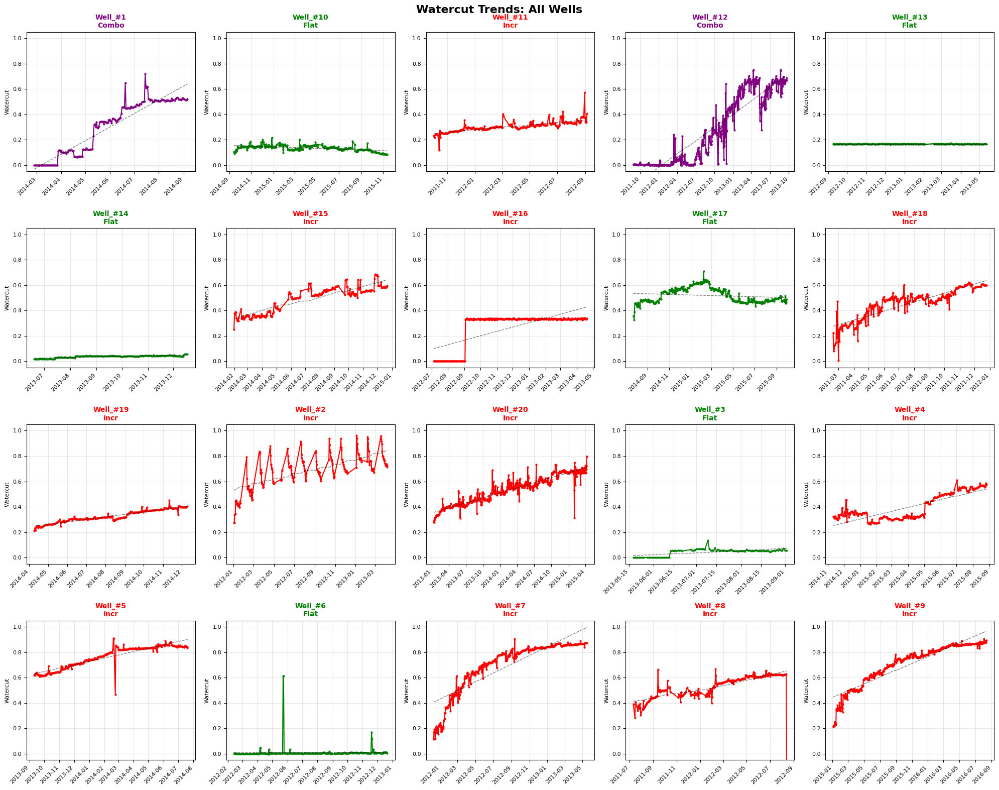

In [ ]:
# Visualization: Watercut trends for all wells
fig, axes = plt.subplots(4, 5, figsize=(20, 16))
axes = axes.flatten()

for idx, (_, well_info) in enumerate(watercut_trend_df.iterrows()):
    if idx >= 20:
        break

    ax = axes[idx]
    well_name = well_info['Well']
    trend = well_info['Watercut Trend']

    # Get well data
    well_subset = well_data[well_data['WELL_NAME'] == well_name].sort_values('PROD_DATE')
    total_liquid = well_subset['OIL_RATE'] + well_subset['WATER_RATE']
    valid_data = well_subset[(well_subset['WATERCUT'].notna()) &
                            (np.isfinite(well_subset['WATERCUT'])) &
                            (total_liquid > 10)]

    if len(valid_data) > 0:
        # Plot watercut with color coding
        color_map = {'Flat': 'green', 'Incr': 'red', 'Decr': 'blue', 'Combo': 'purple'}
        ax.plot(valid_data['PROD_DATE'], valid_data['WATERCUT'],
                color=color_map[trend], linewidth=1.5, marker='o', markersize=2)

        # Add trend line
        if len(valid_data) >= 20:
            from scipy import stats
            time_indices = np.arange(len(valid_data))
            slope, intercept, _, _, _ = stats.linregress(time_indices, valid_data['WATERCUT'].values)
            trend_line = slope * time_indices + intercept
            ax.plot(valid_data['PROD_DATE'], trend_line, 'k--', alpha=0.5, linewidth=1)

    # Format
    ax.set_title(f'{well_name}\n{trend}', fontsize=10, fontweight='bold',
                 color=color_map.get(trend, 'black'))
    ax.set_ylabel('Watercut', fontsize=8)
    ax.set_ylim(-0.05, 1.05)  # Watercut range 0-1
    ax.tick_params(axis='both', labelsize=8)
    ax.grid(True, alpha=0.3)
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha='right')

plt.suptitle('Watercut Trends: All Wells', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

The majority of wells (12 out of 20) show increasing watercut trends, displayed in red. This dominance of increasing water production is a significant operational challenge, as it indicates widespread water breakthrough across the field.

The flat watercut wells (6 total, shown in green) demonstrate good reservoir management with stable water production throughout their history. Wells like #10, #13, and #14 maintain remarkably consistent watercut levels, suggesting effective water control or favorable reservoir conditions. Only 2 wells show combination patterns (purple), indicating complex water production behavior with multiple trend changes.

### Watercut Statistical Analysis
This comprehensive analysis shows watercut behavior patterns and changes over time.

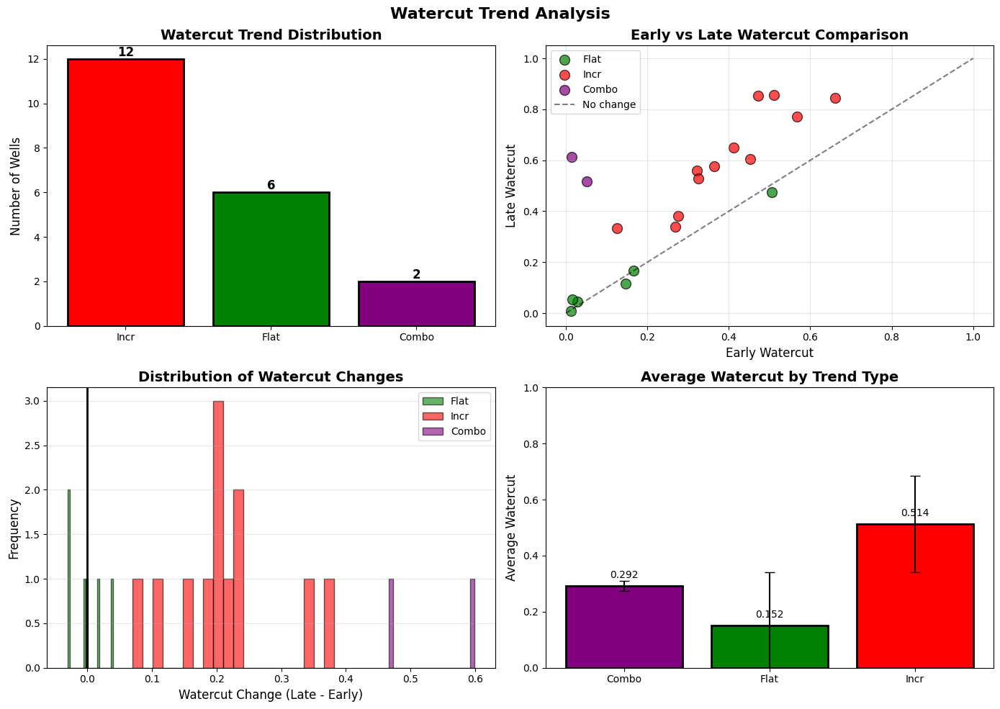

In [ ]:
# Statistical analysis visualization
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Subplot 1: Distribution by trend type
ax1 = axes[0, 0]
trend_counts = watercut_trend_df['Watercut Trend'].value_counts()
colors = {'Flat': 'green', 'Incr': 'red', 'Decr': 'blue', 'Combo': 'purple'}
bars = ax1.bar(trend_counts.index, trend_counts.values,
                color=[colors.get(x, 'gray') for x in trend_counts.index],
                edgecolor='black', linewidth=2)
ax1.set_ylabel('Number of Wells', fontsize=12)
ax1.set_title('Watercut Trend Distribution', fontsize=14, fontweight='bold')

for bar in bars:
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height,
             f'{int(height)}', ha='center', va='bottom', fontsize=12, fontweight='bold')

# Subplot 2: Early vs Late watercut
ax2 = axes[0, 1]
for trend in ['Flat', 'Incr', 'Decr', 'Combo']:
    data = watercut_trend_df[watercut_trend_df['Watercut Trend'] == trend]
    if len(data) > 0:
        ax2.scatter(data['Early_Watercut'], data['Late_Watercut'],
                   label=trend, alpha=0.7, s=100,
                   color=colors[trend], edgecolor='black')

# Reference line
ax2.plot([0, 1], [0, 1], 'k--', alpha=0.5, label='No change')
ax2.set_xlabel('Early Watercut', fontsize=12)
ax2.set_ylabel('Late Watercut', fontsize=12)
ax2.set_title('Early vs Late Watercut Comparison', fontsize=14, fontweight='bold')
ax2.set_xlim(-0.05, 1.05)
ax2.set_ylim(-0.05, 1.05)
ax2.legend()
ax2.grid(True, alpha=0.3)

# Subplot 3: Watercut change distribution
ax3 = axes[1, 0]
for trend in ['Flat', 'Incr', 'Decr', 'Combo']:
    data = watercut_trend_df[watercut_trend_df['Watercut Trend'] == trend]['Watercut_Change']
    if len(data) > 0:
        ax3.hist(data, bins=20, alpha=0.6, label=trend, color=colors[trend], edgecolor='black')

ax3.axvline(x=0, color='black', linestyle='-', linewidth=2)
ax3.set_xlabel('Watercut Change (Late - Early)', fontsize=12)
ax3.set_ylabel('Frequency', fontsize=12)
ax3.set_title('Distribution of Watercut Changes', fontsize=14, fontweight='bold')
ax3.legend()
ax3.grid(True, axis='y', alpha=0.3)

# Subplot 4: Average watercut by trend
ax4 = axes[1, 1]
trend_types = watercut_trend_df['Watercut Trend'].unique()
avg_wc = [watercut_trend_df[watercut_trend_df['Watercut Trend'] == t]['Avg_Watercut'].mean()
          for t in trend_types]
std_wc = [watercut_trend_df[watercut_trend_df['Watercut Trend'] == t]['Avg_Watercut'].std()
          for t in trend_types]

bars = ax4.bar(trend_types, avg_wc, yerr=std_wc,
                color=[colors.get(t, 'gray') for t in trend_types],
                edgecolor='black', linewidth=2, capsize=5)
ax4.set_ylabel('Average Watercut', fontsize=12)
ax4.set_title('Average Watercut by Trend Type', fontsize=14, fontweight='bold')
ax4.set_ylim(0, 1)

for bar, avg in zip(bars, avg_wc):
    ax4.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 0.02,
             f'{avg:.3f}', ha='center', va='bottom', fontsize=10)

plt.suptitle('Watercut Trend Analysis', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

The scatter plot above shows most red dots above the diagonal line, confirming that late-production watercut values are higher than early-production values for these wells.

### Example Time Series for Each Trend Type
Representative examples help understand the characteristics of each watercut trend classification.

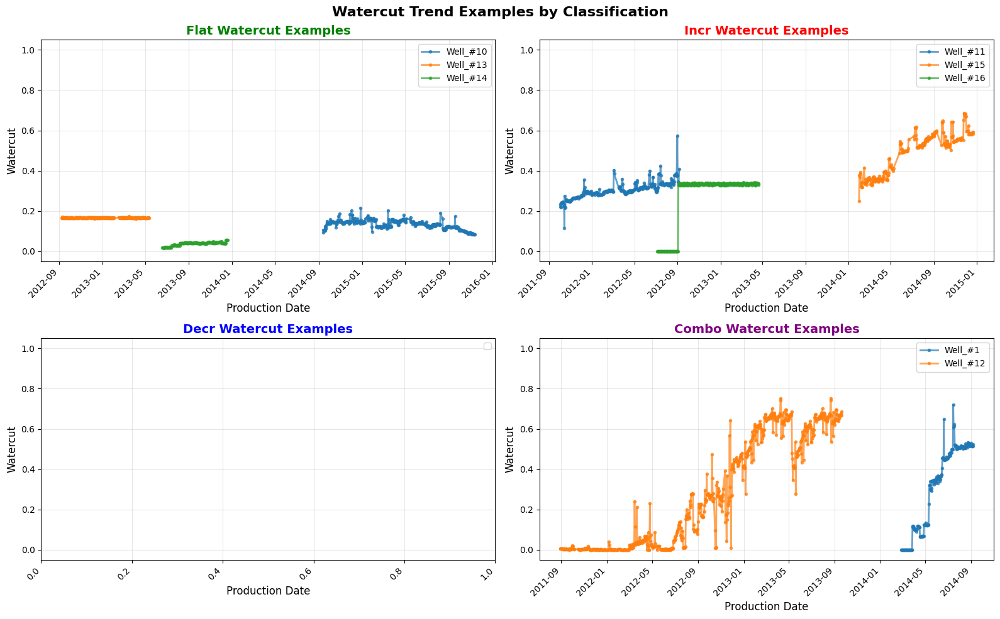

In [ ]:
# Time series examples visualization
fig, axes = plt.subplots(2, 2, figsize=(16, 10))
axes = axes.flatten()

for idx, trend in enumerate(['Flat', 'Incr', 'Decr', 'Combo']):
    ax = axes[idx]

    # Get example wells (up to 3 per trend)
    trend_wells = watercut_trend_df[watercut_trend_df['Watercut Trend'] == trend]['Well'].values[:3]

    for well_name in trend_wells:
        well_subset = well_data[well_data['WELL_NAME'] == well_name].sort_values('PROD_DATE')
        total_liquid = well_subset['OIL_RATE'] + well_subset['WATER_RATE']
        valid_data = well_subset[(well_subset['WATERCUT'].notna()) &
                                (np.isfinite(well_subset['WATERCUT'])) &
                                (total_liquid > 10)]

        if len(valid_data) > 0:
            ax.plot(valid_data['PROD_DATE'], valid_data['WATERCUT'],
                   label=well_name, linewidth=2, marker='o', markersize=3, alpha=0.7)

    ax.set_title(f'{trend} Watercut Examples', fontsize=14, fontweight='bold',
                 color=colors.get(trend, 'black'))
    ax.set_xlabel('Production Date', fontsize=12)
    ax.set_ylabel('Watercut', fontsize=12)
    ax.set_ylim(-0.05, 1.05)
    ax.legend(fontsize=10)
    ax.grid(True, alpha=0.3)
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha='right')

plt.suptitle('Watercut Trend Examples by Classification', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# Merge with main classification
reservoir_classification = reservoir_classification.merge(
    watercut_trend_df[['Well', 'Watercut Trend']],
    on='Well',
    how='left'
)

## Task 7: Oil Productivity Index (PI) Trend Classification

**Objective**: Classify wells based on Oil Productivity Index trend.

**Definition**: PI = Oil Rate / (Reservoir Pressure - BHFP)

**Categories**:
- **Flat**: PI remains relatively constant (stable well/reservoir conditions)
- **Incr**: PI shows increasing trend (improved productivity)
- **Decr**: PI shows decreasing trend (formation damage or depletion effects)
- **Combo**: Combination of trends

PI is a key indicator of well performance and helps identify candidates for stimulation or workover.

In [ ]:
def classify_pi_trend(well_data, reservoir_classification, reservoir_info):
    """
     Classify wells based on Oil Productivity Index (PI) trend.

     Engineering rationale:
     - PI measures well's ability to produce per unit pressure drawdown
     - Decreasing PI suggests formation damage, skin buildup, or depletion
     - Increasing PI indicates stimulation success or cleanup
     - Stable PI shows consistent reservoir-well system
     """

    pi_classifications = []

    for well_name in well_data['WELL_NAME'].unique():
        well_subset = well_data[well_data['WELL_NAME'] == well_name].copy()
        well_subset = well_subset.sort_values('PROD_DATE')

        # Get reservoir info
        reservoir = reservoir_classification[
            reservoir_classification['Well'] == well_name
        ]['Reservoir Name'].values[0]

        res_pressure = reservoir_info[
            reservoir_info['Reservoir Name'] == reservoir
        ]['Current Average Reservoir Pressure (PSI)'].values[0]

        # Calculate PI with filtering
        pressure_diff = res_pressure - well_subset['BOTTOMHOLE_FLOWING_PRESSURE (PSI)']

        # lenient filtering to retain more data points
        valid_data = well_subset[(pressure_diff > 30) &  # Reduced from 50
                                (well_subset['OIL_RATE'] > 5) &  # Reduced from 10
                                (well_subset['BOTTOMHOLE_FLOWING_PRESSURE (PSI)'] > 0)]

        if len(valid_data) < 20:
            # Default values
            trend = 'Flat'
            slope = 0
            r_squared = 0
            avg_pi = 0
            early_pi = 0
            late_pi = 0
            trend_changes = 0
        else:
            # Calculate PI values
            pressure_diff_valid = res_pressure - valid_data['BOTTOMHOLE_FLOWING_PRESSURE (PSI)']
            pi_values = valid_data['OIL_RATE'] / pressure_diff_valid

            # outlier removal using IQR method with percentiles
            pi_25th = np.percentile(pi_values, 25)
            pi_75th = np.percentile(pi_values, 75)
            iqr = pi_75th - pi_25th

            # bounds to keep more data
            lower_bound = pi_25th - 2 * iqr
            upper_bound = pi_75th + 2 * iqr

            # Also use absolute limits based on engineering judgment
            pi_clean = pi_values[(pi_values >= max(0, lower_bound)) &
                                (pi_values <= min(upper_bound, np.median(pi_values) * 5))]

            if len(pi_clean) < 10:
                pi_clean = pi_values  # Use all data if too few after cleaning

            # Apply smoothing to reduce noise
            pi_series = pd.Series(pi_clean)
            if len(pi_series) > 7:
                pi_smoothed = pi_series.rolling(window=5, center=True, min_periods=1).median()
            else:
                pi_smoothed = pi_series

            time_indices = np.arange(len(pi_smoothed))

            # Calculate statistics (maintain original variable names)
            avg_pi = np.mean(pi_smoothed)
            std_pi = np.std(pi_smoothed)

            # Segment analysis
            segment_length = len(pi_smoothed) // 3
            if segment_length > 0:
                early_pi = np.mean(pi_smoothed.iloc[:segment_length])
                middle_pi = np.mean(pi_smoothed.iloc[segment_length:2*segment_length])
                late_pi = np.mean(pi_smoothed.iloc[-segment_length:])
            else:
                early_pi = pi_smoothed.iloc[0]
                late_pi = pi_smoothed.iloc[-1]
                middle_pi = np.mean(pi_smoothed)

            # Linear regression
            from scipy import stats
            slope, intercept, r_value, p_value, std_err = stats.linregress(time_indices, pi_smoothed.values)
            r_squared = r_value ** 2

            # Calculate relative changes
            pi_change = late_pi - early_pi
            relative_change = pi_change / early_pi if early_pi > 0 else 0

            # Detect trend changes
            trend_changes = 0
            if segment_length > 5:
                # Check for significant deviations in middle segment
                early_to_middle = (middle_pi - early_pi) / early_pi if early_pi > 0 else 0
                middle_to_late = (late_pi - middle_pi) / middle_pi if middle_pi > 0 else 0

                # Trend reversal detection
                if abs(early_to_middle) > 0.15 and abs(middle_to_late) > 0.15:
                    if early_to_middle * middle_to_late < 0:  # Sign change
                        trend_changes = 1

            # Improved classification logic for PI
            # Key insight: PI trends are often more subtle than other parameters

            if trend_changes >= 1:
                trend = 'Combo'
            elif abs(relative_change) < 0.15:  # Less than 15% relative change
                trend = 'Flat'
            elif std_pi / avg_pi < 0.2 and abs(slope / avg_pi) < 0.001:  # Low coefficient of variation
                trend = 'Flat'
            else:
                # Check for formation damage (sharp decrease)
                if late_pi < early_pi * 0.7:  # 30% drop
                    trend = 'Decr'
                # Check for stimulation/cleanup (sharp increase)
                elif late_pi > early_pi * 1.3:  # 30% increase
                    trend = 'Incr'
                # Gradual changes
                elif relative_change > 0.15:
                    # Verify consistency
                    if middle_pi >= early_pi * 0.9:  # No significant drop in middle
                        trend = 'Incr'
                    else:
                        trend = 'Combo'
                elif relative_change < -0.15:
                    # Verify consistency
                    if middle_pi <= early_pi * 1.1:  # No significant increase in middle
                        trend = 'Decr'
                    else:
                        trend = 'Combo'
                else:
                    trend = 'Flat'

        # Store results (maintain original structure)
        pi_classifications.append({
            'Well': well_name,
            'Oil Productivity Index Trend': trend,
            'Avg_PI': avg_pi,
            'Early_PI': early_pi,
            'Late_PI': late_pi,
            'PI_Change': late_pi - early_pi,
            'PI_Change_Pct': ((late_pi - early_pi) / early_pi * 100) if early_pi > 0 else 0,
            'Slope': slope,
            'R_squared': r_squared,
            'Trend_Changes': trend_changes
        })

    return pd.DataFrame(pi_classifications)

# Apply classification
pi_trend_df = classify_pi_trend(well_data, reservoir_classification, reservoir_info)

### PI Trend Visualization
This visualization shows productivity index evolution for all wells with trend indicators.

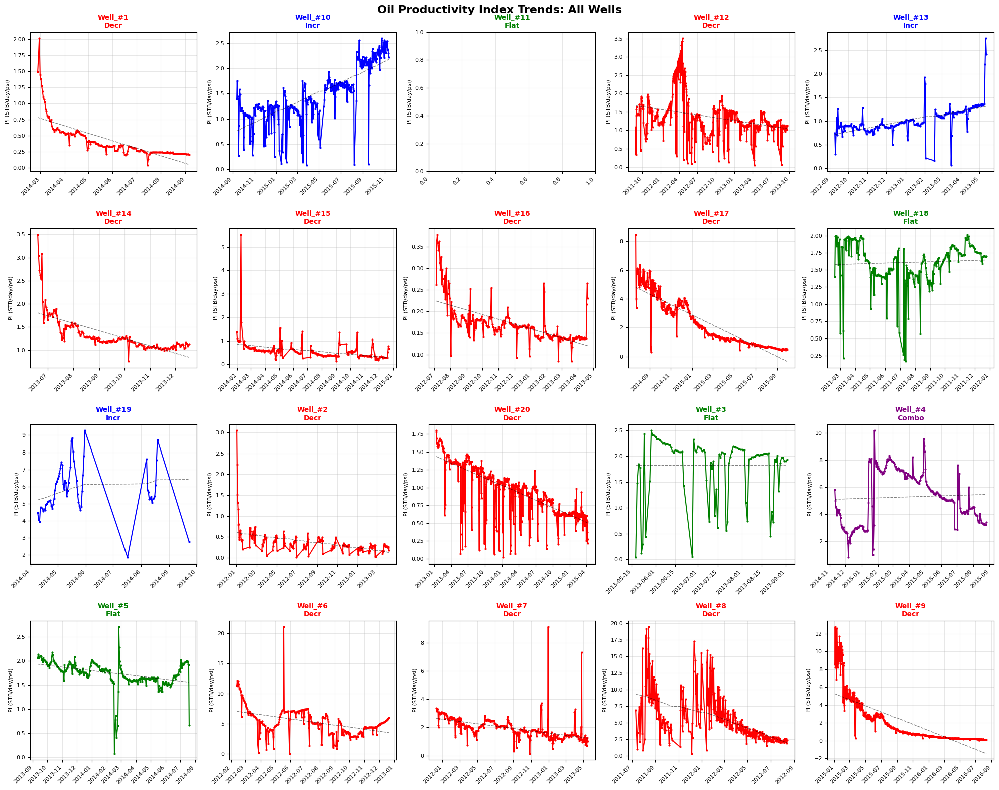

In [ ]:
# Visualization: PI trends for all wells
fig, axes = plt.subplots(4, 5, figsize=(20, 16))
axes = axes.flatten()

for idx, (_, well_info) in enumerate(pi_trend_df.iterrows()):
    if idx >= 20:
        break

    ax = axes[idx]
    well_name = well_info['Well']
    trend = well_info['Oil Productivity Index Trend']

    # Get well and reservoir data
    well_subset = well_data[well_data['WELL_NAME'] == well_name].sort_values('PROD_DATE')
    reservoir = reservoir_classification[
        reservoir_classification['Well'] == well_name
    ]['Reservoir Name'].values[0]
    res_pressure = reservoir_info[
        reservoir_info['Reservoir Name'] == reservoir
    ]['Current Average Reservoir Pressure (PSI)'].values[0]

    # Calculate PI
    pressure_diff = res_pressure - well_subset['BOTTOMHOLE_FLOWING_PRESSURE (PSI)']
    valid_data = well_subset[(pressure_diff > 50) &
                            (well_subset['OIL_RATE'] > 10) &
                            (well_subset['BOTTOMHOLE_FLOWING_PRESSURE (PSI)'] > 0)]

    if len(valid_data) > 0:
        pressure_diff_valid = res_pressure - valid_data['BOTTOMHOLE_FLOWING_PRESSURE (PSI)']
        pi_values = valid_data['OIL_RATE'] / pressure_diff_valid

        # Plot PI trend
        color_map = {'Flat': 'green', 'Incr': 'blue', 'Decr': 'red', 'Combo': 'purple'}
        ax.plot(valid_data['PROD_DATE'], pi_values,
                color=color_map[trend], linewidth=1.5, marker='o', markersize=2)

        # Add trend line
        if len(pi_values) >= 20:
            from scipy import stats
            time_indices = np.arange(len(pi_values))
            slope, intercept, _, _, _ = stats.linregress(time_indices, pi_values)
            trend_line = slope * time_indices + intercept
            ax.plot(valid_data['PROD_DATE'], trend_line, 'k--', alpha=0.5, linewidth=1)

    # Format
    ax.set_title(f'{well_name}\n{trend}', fontsize=10, fontweight='bold',
                 color=color_map.get(trend, 'black'))
    ax.set_ylabel('PI (STB/day/psi)', fontsize=8)
    ax.tick_params(axis='both', labelsize=8)
    ax.grid(True, alpha=0.3)
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha='right')

plt.suptitle('Oil Productivity Index Trends: All Wells', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

The Oil Productivity Index analysis reveals an even more concerning pattern. 12 out of 20 wells show declining PI trends (red), indicating widespread productivity deterioration.

### PI Statistical Analysis
This analysis provides insights into productivity changes and their distribution across trend types.

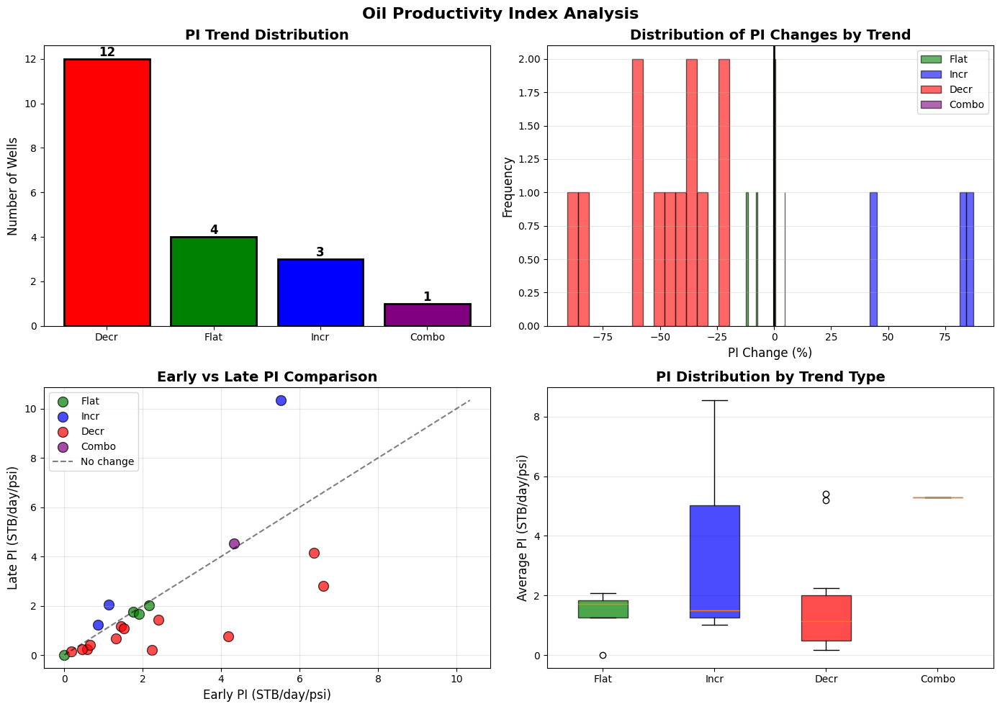

In [ ]:
# Statistical analysis visualization
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Subplot 1: Distribution by trend type
ax1 = axes[0, 0]
trend_counts = pi_trend_df['Oil Productivity Index Trend'].value_counts()
colors = {'Flat': 'green', 'Incr': 'blue', 'Decr': 'red', 'Combo': 'purple'}
bars = ax1.bar(trend_counts.index, trend_counts.values,
                color=[colors.get(x, 'gray') for x in trend_counts.index],
                edgecolor='black', linewidth=2)
ax1.set_ylabel('Number of Wells', fontsize=12)
ax1.set_title('PI Trend Distribution', fontsize=14, fontweight='bold')

for bar in bars:
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height,
             f'{int(height)}', ha='center', va='bottom', fontsize=12, fontweight='bold')

# Subplot 2: PI change percentage distribution
ax2 = axes[0, 1]
for trend in ['Flat', 'Incr', 'Decr', 'Combo']:
    data = pi_trend_df[pi_trend_df['Oil Productivity Index Trend'] == trend]['PI_Change_Pct']
    if len(data) > 0:
        ax2.hist(data, bins=15, alpha=0.6, label=trend, color=colors[trend], edgecolor='black')

ax2.axvline(x=0, color='black', linestyle='-', linewidth=2)
ax2.set_xlabel('PI Change (%)', fontsize=12)
ax2.set_ylabel('Frequency', fontsize=12)
ax2.set_title('Distribution of PI Changes by Trend', fontsize=14, fontweight='bold')
ax2.legend()
ax2.grid(True, axis='y', alpha=0.3)

# Subplot 3: Early vs Late PI comparison
ax3 = axes[1, 0]
for trend in ['Flat', 'Incr', 'Decr', 'Combo']:
    data = pi_trend_df[pi_trend_df['Oil Productivity Index Trend'] == trend]
    if len(data) > 0:
        ax3.scatter(data['Early_PI'], data['Late_PI'],
                   label=trend, alpha=0.7, s=100,
                   color=colors[trend], edgecolor='black')

# Reference line
max_pi = max(pi_trend_df['Early_PI'].max(), pi_trend_df['Late_PI'].max())
ax3.plot([0, max_pi], [0, max_pi], 'k--', alpha=0.5, label='No change')
ax3.set_xlabel('Early PI (STB/day/psi)', fontsize=12)
ax3.set_ylabel('Late PI (STB/day/psi)', fontsize=12)
ax3.set_title('Early vs Late PI Comparison', fontsize=14, fontweight='bold')
ax3.legend()
ax3.grid(True, alpha=0.3)

# Subplot 4: Box plot of average PI by trend
ax4 = axes[1, 1]
pi_by_trend = []
labels = []
for trend in ['Flat', 'Incr', 'Decr', 'Combo']:
    data = pi_trend_df[pi_trend_df['Oil Productivity Index Trend'] == trend]['Avg_PI']
    if len(data) > 0:
        pi_by_trend.append(data.values)
        labels.append(trend)

if pi_by_trend:
    bp = ax4.boxplot(pi_by_trend, labels=labels, patch_artist=True)
    for i, (box, label) in enumerate(zip(bp['boxes'], labels)):
        box.set_facecolor(colors.get(label, 'gray'))
        box.set_alpha(0.7)

ax4.set_ylabel('Average PI (STB/day/psi)', fontsize=12)
ax4.set_title('PI Distribution by Trend Type', fontsize=14, fontweight='bold')
ax4.grid(True, axis='y', alpha=0.3)

plt.suptitle('Oil Productivity Index Analysis', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# Merge PI trend with main classification
reservoir_classification = reservoir_classification.merge(
    pi_trend_df[['Well', 'Oil Productivity Index Trend']],
    on='Well',
    how='left'
)

# Rename column to match expected output format
reservoir_classification = reservoir_classification.rename(
    columns={'Oil Productivity Index Trend': 'Oil Productivity Index'}
)

The histogram subplot above shows most declining wells experienced PI drops between 25% and 75%, which represents significant productivity loss. This suggests formation damage, pressure depletion, or increasing skin effects across the field.

## 8. Final Results Compilation

To provide a comprehensive overview of our classification results, we create multiple visualization types that highlight different aspects of the well distributions. These visualizations are essential for:
- Understanding the overall field characterization
- Identifying dominant patterns across the 20 wells
- Supporting field development and production optimization decisions
- Providing executive-level summary for stakeholders

In [ ]:
# Prepare final classification dataframe
final_classification = reservoir_classification[['Well_Number', 'Reservoir Name', 'Reservoir Type',
                                               'Well Type', 'Production Type', 'Formation GOR Trend',
                                               'Watercut Trend', 'Oil Productivity Index']].copy()

In [ ]:
final_classification

,Well,Reservoir Name,Reservoir Type,Well Type,Production Type,Formation GOR Trend,Watercut Trend,Oil Productivity Index
0,1,JANI,Undersaturated,GL,Unsteady,bSolGOR,Combo,Decr
1,2,KEMA,Undersaturated,NF,Unsteady,bSolGOR,Incr,Decr
2,3,MAKO,Saturated,GL,Unsteady,aSolGOR,Flat,Flat
3,4,DEPU,Saturated,GL,Unsteady,bSolGOR,Incr,Combo
4,5,MAKO,Saturated,NF,Unsteady,aSolGOR,Incr,Flat
5,6,KEMA,Undersaturated,NF,Unsteady,aSolGOR,Flat,Decr
6,7,KEMA,Undersaturated,GL,Unsteady,aSolGOR,Incr,Decr
7,8,ACHI,Undersaturated,GL,Unsteady,aSolGOR,Incr,Decr
8,9,DEPU,Saturated,GL,Unsteady,bSolGOR,Incr,Decr
9,10,JANI,Undersaturated,NF,Unsteady,aSolGOR,Flat,Incr


In [ ]:
# Rename Well_Number to Well for final output
final_classification = final_classification.rename(columns={'Well_Number': 'Well'})

# Sort by well number
final_classification = final_classification.sort_values('Well')

In [ ]:
# Save to CSV format matching the sample submission
output_filename = 'Petromind_DSEATS_Africa_2025_Classification.csv'
final_classification.to_csv(output_filename, index=False)

In [ ]:
files.download(output_filename)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Bar Chart Summary by Classification Parameter

This visualization shows the distribution of wells across each classification category using bar charts. The height of each bar represents the number of wells, with percentages shown below to indicate relative proportions.


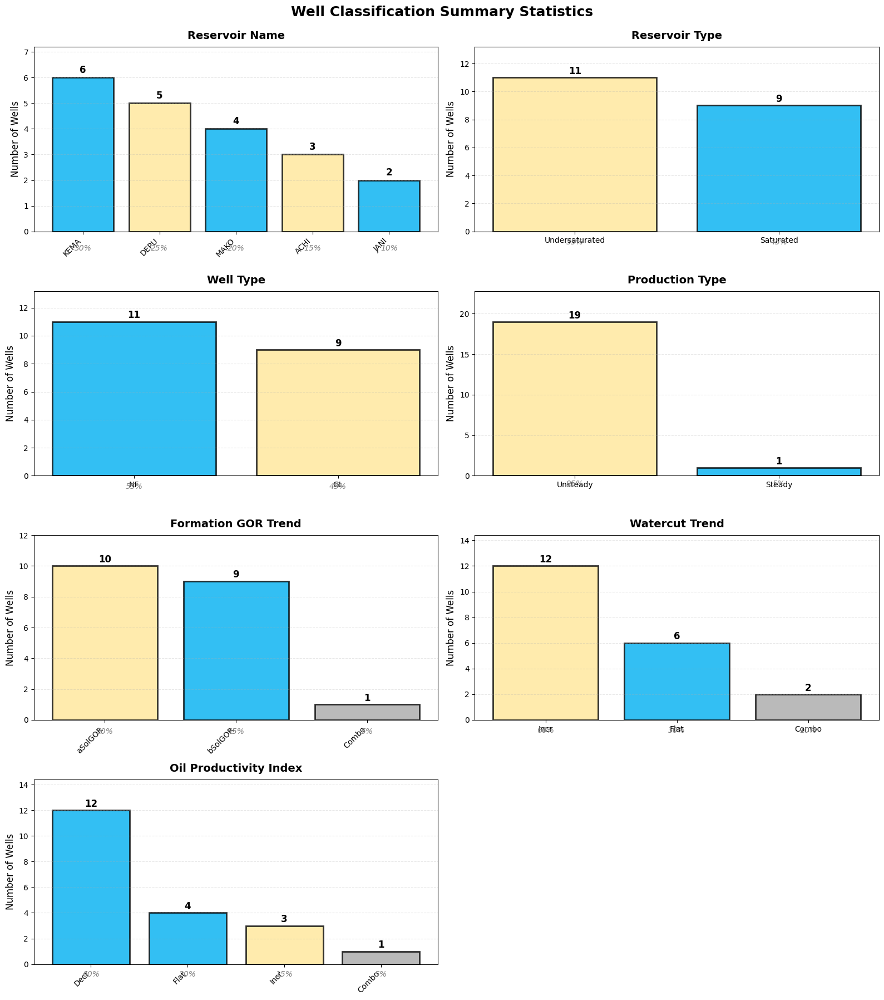

In [ ]:
# Create comprehensive bar chart visualizations for classification summary statistics
fig, axes = plt.subplots(4, 2, figsize=(16, 18))
axes = axes.flatten()

# Define professional color palettes for each classification type
# Colors chosen for clarity and distinction between categories
color_palettes = {
    'Reservoir Name': ['#00B0F0', '#FFE699', '#00B0F0', '#FFE699', '#00B0F0'],  # Alternating theme colors
    'Reservoir Type': {'Saturated': '#00B0F0', 'Undersaturated': '#FFE699'},  # Theme colors
    'Well Type': {'NF': '#00B0F0', 'GL': '#FFE699'},  # Theme colors
    'Production Type': {'Steady': '#00B0F0', 'Unsteady': '#FFE699'},  # Theme colors
    'Formation GOR Trend': {
        'bSolGOR': '#00B0F0',
        'aSolGOR': '#FFE699',
        'Combo': '#A9A9A9'  # Neutral gray for combo
    },
    'Watercut Trend': {
        'Flat': '#00B0F0',
        'Incr': '#FFE699',
        'Decr': '#00B0F0',
        'Combo': '#A9A9A9'  # Neutral gray for combo
    },
    'Oil Productivity Index': {
        'Flat': '#00B0F0',
        'Incr': '#FFE699',
        'Decr': '#00B0F0',
        'Combo': '#A9A9A9'  # Neutral gray for combo
    }
}


# Create individual bar plots for each classification parameter
for idx, col in enumerate(final_classification.columns[1:]):  # Skip 'Well' column
    ax = axes[idx]

    # Calculate value counts for current classification
    value_counts = final_classification[col].value_counts()

    # Select appropriate colors based on classification type
    if col == 'Reservoir Name':
        colors = color_palettes[col][:len(value_counts)]
    elif col in color_palettes and isinstance(color_palettes[col], dict):
        colors = [color_palettes[col].get(val, 'gray') for val in value_counts.index]
    else:
        colors = plt.cm.Set3(np.linspace(0, 1, len(value_counts)))

    # Create bar plot with professional styling
    bars = ax.bar(value_counts.index, value_counts.values, color=colors,
                   edgecolor='black', linewidth=2, alpha=0.8)

    # Add count labels on top of bars for clarity
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height + 0.1,
                f'{int(height)}', ha='center', va='bottom',
                fontsize=12, fontweight='bold')

    # Customize plot appearance
    ax.set_title(col, fontsize=14, fontweight='bold', pad=10)
    ax.set_ylabel('Number of Wells', fontsize=12)
    ax.set_ylim(0, max(value_counts.values) * 1.2)  # Add headroom for labels
    ax.grid(True, axis='y', alpha=0.3, linestyle='--')

    # Rotate labels for better readability where needed
    if col in ['Reservoir Name', 'Formation GOR Trend', 'Oil Productivity Index']:
        plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha='right')

    # Add percentage labels below x-axis for quick reference
    total_wells = len(final_classification)
    for i, (label, count) in enumerate(value_counts.items()):
        percentage = (count / total_wells) * 100
        ax.text(i, -0.5, f'{percentage:.0f}%', ha='center', va='top',
                fontsize=10, style='italic', color='gray')

# Remove empty subplot if we have odd number of classifications
if len(final_classification.columns[1:]) < len(axes):
    fig.delaxes(axes[-1])

plt.suptitle('Well Classification Summary Statistics', fontsize=18, fontweight='bold', y=0.995)
plt.tight_layout()
plt.show()

#### Pie Chart Distribution Analysis

Pie charts provide an intuitive view of proportional distributions for each classification parameter. This visualization is particularly useful for identifying dominant categories and understanding the overall field composition at a glance.


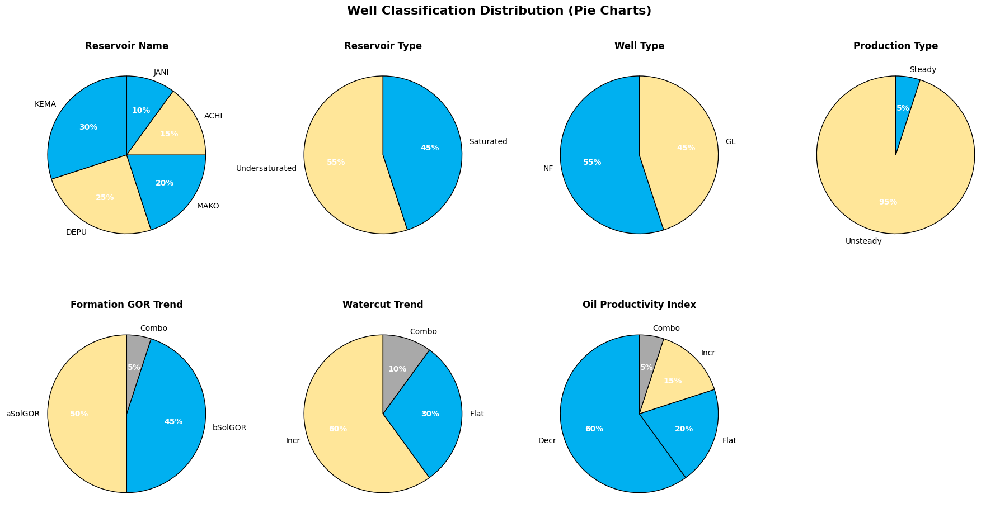

In [ ]:
# Create pie chart visualizations for proportional analysis
fig, axes = plt.subplots(2, 4, figsize=(18, 10))
axes = axes.flatten()

for idx, col in enumerate(final_classification.columns[1:]):
    ax = axes[idx]

    # Get value counts for pie chart
    value_counts = final_classification[col].value_counts()

    # Apply consistent color scheme
    if col == 'Reservoir Name':
        colors = color_palettes[col][:len(value_counts)]
    elif col in color_palettes and isinstance(color_palettes[col], dict):
        colors = [color_palettes[col].get(val, 'gray') for val in value_counts.index]
    else:
        colors = plt.cm.Set3(np.linspace(0, 1, len(value_counts)))

    # Create pie chart with professional styling
    wedges, texts, autotexts = ax.pie(value_counts.values,
                                       labels=value_counts.index,
                                       colors=colors,
                                       autopct='%1.0f%%',  # Show percentages
                                       startangle=90,  # Start from top
                                       wedgeprops={'edgecolor': 'black', 'linewidth': 1})

    # Customize text appearance for readability
    for text in texts:
        text.set_fontsize(10)
    for autotext in autotexts:
        autotext.set_color('white')
        autotext.set_fontweight('bold')
        autotext.set_fontsize(10)

    ax.set_title(col, fontsize=12, fontweight='bold', pad=10)

# Remove unused subplots
for i in range(len(final_classification.columns[1:]), len(axes)):
    fig.delaxes(axes[i])

plt.suptitle('Well Classification Distribution (Pie Charts)', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

## Key Insights from Classification Analysis

### Field Maturity Indicators
- Production concentrated in KEMA and DEPU reservoirs suggests uneven depletion across field
- Balanced NF/GL split indicates field in transitional phase between natural flow and full artificial lift
- Half of wells producing above solution GOR confirms reservoir pressure has dropped below bubble point in multiple areas

### Critical Operational Challenges
- **95% production instability is the most critical finding** - indicates systemic operational issues beyond normal depletion
- Instability correlates with water breakthrough and declining productivity, suggesting compound challenges
- Only one well maintaining steady production raises concerns about field management practices

### Water Management Crisis
- Widespread water breakthrough across both NF and GL wells indicates advancing water front
- Water encroachment affecting both reservoir types equally, suggesting regional aquifer activity
- Increasing watercut in majority of wells will require significant infrastructure upgrades

### Productivity Decline Patterns
- Declining PI in over half the wells suggests combination of:
  - Formation damage from water/gas breakthrough
  - Depletion-induced permeability reduction
  - Possible scaling or asphaltene issues
- Wells showing PI increase likely benefited from recent interventions or natural cleanup

### Reservoir Behavior Insights
- Undersaturated reservoirs still dominating production despite field maturity
- Free gas production in 50% of wells explains high GL deployment
- Mixed GOR trends indicate complex reservoir compartmentalization

### Cross-Parameter Correlations
- Unsteady production strongly associated with:
  - Water breakthrough (coning/channeling effects)
  - Transition across bubble point (gas coming out of solution)
  - Formation damage (declining PI)
- GL wells not preventing water breakthrough, suggesting lift optimization needed

### Field Development Implications
- Immediate focus required on production stabilization before implementing enhancement programs
- Water handling capacity likely undersized for current breakthrough rates
- Consider reservoir-specific strategies given varying depletion states

## 9. Machine Learning Validation

To validate our engineering-based classifications, we employ machine learning models to check if the same patterns can be learned from the data. High agreement between engineering rules and ML predictions indicates robust, data-supported classifications.

### Validation Approach:
1. **Feature Engineering**: Extract numerical features from production data
2. **Model Training**: Use Random Forest classifiers for each classification task
3. **Cross-Validation**: Apply Leave-One-Out CV due to small sample size (20 wells)
4. **Agreement Analysis**: Compare ML predictions with engineering classifications

### Why ML Validation?
- Confirms that our engineering rules capture real patterns in the data
- Identifies which features are most predictive for each classification
- Highlights potential edge cases where engineering judgment and data patterns diverge


### 9.1 Feature Matrix Preparation

We extract numerical features that capture the same engineering principles used in our rule-based classifications. These features include pressure statistics, production metrics, and calculated ratios that are meaningful in petroleum engineering.


In [ ]:
def prepare_ml_features(well_data, reservoir_classification, reservoir_info):
    """
    Prepare comprehensive feature matrix for ML validation.

    This function extracts numerical features that represent the engineering
    indicators used in manual classification, allowing ML models to learn
    the same patterns.

    Features include:
    - Pressure statistics (BHP, WHP, annulus) for well type identification
    - Production metrics (rates, cumulative values) for stability assessment
    - Calculated ratios (GOR, watercut, PI components) for trend analysis
    - Engineering indicators specific to each classification task
    """
    feature_list = []

    for well_name in well_data['WELL_NAME'].unique():
        well_subset = well_data[well_data['WELL_NAME'] == well_name]

        # Get reservoir properties for contextual features
        reservoir = reservoir_classification[
            reservoir_classification['Well'] == well_name
        ]['Reservoir Name'].values[0]

        solution_gor = reservoir_info[
            reservoir_info['Reservoir Name'] == reservoir
        ]['Solution Gas-Oil-Ratio (SCF/BBL)'].values[0]

        # Calculate comprehensive feature set aligned with engineering principles
        features = {
            'Well': well_name,

            # Pressure features - critical for well type and reservoir identification
            'avg_bhfp': well_subset['BOTTOMHOLE_FLOWING_PRESSURE (PSI)'].mean(),
            'max_bhfp': well_subset['BOTTOMHOLE_FLOWING_PRESSURE (PSI)'].max(),
            'std_bhfp': well_subset['BOTTOMHOLE_FLOWING_PRESSURE (PSI)'].std(),
            'avg_annulus_pressure': well_subset['ANNULUS_PRESS (PSI)'].mean(),
            'min_annulus_pressure': well_subset['ANNULUS_PRESS (PSI)'].min(),
            'max_annulus_pressure': well_subset['ANNULUS_PRESS (PSI)'].max(),

            # Production features - for stability and trend analysis
            'avg_oil_rate': well_subset['OIL_RATE'].mean(),
            'oil_rate_std': well_subset['OIL_RATE'].std(),
            # Coefficient of variation indicates production stability
            'oil_rate_cv': well_subset['OIL_RATE'].std() / well_subset['OIL_RATE'].mean() if well_subset['OIL_RATE'].mean() > 0 else 0,

            # GOR features - handle edge cases for robust calculation
            'avg_formation_gor': np.nanmean(well_subset['FORMATION_GOR'].replace([np.inf, -np.inf], np.nan)),
            'formation_gor_std': np.nanstd(well_subset['FORMATION_GOR'].replace([np.inf, -np.inf], np.nan)),
            # Ratio to solution GOR is key for classification
            'gor_to_solution_ratio': np.nanmean(well_subset['FORMATION_GOR'].replace([np.inf, -np.inf], np.nan)) / solution_gor if solution_gor > 0 else 1,

            # Watercut features - for water breakthrough analysis
            'avg_watercut': well_subset['WATERCUT'].mean(),
            'watercut_std': well_subset['WATERCUT'].std(),
            # Early vs late comparison captures trend
            'early_watercut': well_subset['WATERCUT'].iloc[:len(well_subset)//4].mean() if len(well_subset) > 4 else well_subset['WATERCUT'].mean(),
            'late_watercut': well_subset['WATERCUT'].iloc[-len(well_subset)//4:].mean() if len(well_subset) > 4 else well_subset['WATERCUT'].mean(),

            # Additional engineering indicators
            'total_injected_gas': (well_subset['CUMULATIVE_TOTAL_GAS_PROD (MSCF)'] -
                                 well_subset['CUMULATIVE_FORMATION_GAS_PROD (MSCF)']).max(),
            'production_days': len(well_subset),
            'avg_tubing_loss': well_subset['TUBING_LOSS'].mean(),
            'avg_bhp_whp_ratio': np.nanmean(well_subset['BHP_WHP_RATIO'].replace([np.inf, -np.inf], np.nan))
        }

        feature_list.append(features)

    return pd.DataFrame(feature_list)

In [ ]:
# Create the feature matrix from production data
feature_matrix = prepare_ml_features(well_data, reservoir_classification, reservoir_info)

# Data cleaning: handle any remaining infinities or NaN values
numeric_cols = feature_matrix.select_dtypes(include=[np.number]).columns
feature_matrix[numeric_cols] = feature_matrix[numeric_cols].replace([np.inf, -np.inf], np.nan)
# Fill NaN with column means to maintain data integrity
feature_matrix[numeric_cols] = feature_matrix[numeric_cols].fillna(feature_matrix[numeric_cols].mean())

### 9.2 Classification Task Setup

We validate each of the classification tasks separately to understand which ones are most data-driven and which might rely more on engineering judgment.
Define classification tasks and their corresponding dataframes
Note: These exclude reservoir assignment as it was deterministic based on pressure matching

In [ ]:
classification_tasks = {
    'Well Type': well_type_indicators[['Well', 'Well Type']],
    'Production Type': production_type_df[['Well', 'Production Type']],
    'Formation GOR Trend': gor_trend_df[['Well', 'Formation GOR Trend']],
    'Watercut Trend': watercut_trend_df[['Well', 'Watercut Trend']],
    'Oil Productivity Index': pi_trend_df[['Well', 'Oil Productivity Index Trend']]
}

In [ ]:
# Merge all features with classifications to create complete ML dataset
ml_data = feature_matrix.copy()
for task_name, task_df in classification_tasks.items():
    ml_data = ml_data.merge(task_df, on='Well', how='left')

### 9.3 Machine Learning Model Training and Validation

We use Random Forest classifiers with conservative parameters suitable for small datasets. Leave-One-Out cross-validation ensures robust validation despite having only 20 samples.


In [ ]:
# Initialize results storage
validation_results = {}

In [ ]:
# Validate each classification task
for task_name, task_df in classification_tasks.items():

    # Get the target column name (second column contains classifications)
    target_col = task_df.columns[1]

    # Define feature columns for model training
    feature_cols = ['avg_bhfp', 'max_bhfp', 'std_bhfp', 'avg_annulus_pressure',
                   'min_annulus_pressure', 'max_annulus_pressure', 'avg_oil_rate',
                   'oil_rate_std', 'oil_rate_cv', 'avg_formation_gor',
                   'formation_gor_std', 'gor_to_solution_ratio', 'avg_watercut',
                   'watercut_std', 'early_watercut', 'late_watercut',
                   'total_injected_gas', 'production_days', 'avg_tubing_loss',
                   'avg_bhp_whp_ratio']

    # Prepare feature matrix and target vector
    X = ml_data[feature_cols]
    y = ml_data[target_col]

    # Additional data cleaning for robustness
    X = X.replace([np.inf, -np.inf], np.nan)
    X = X.fillna(X.mean())

    # Standardize features to prevent scale-related issues
    # This is important as pressure values are in thousands while ratios are near 1
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns, index=X.index)

    # Configure Random Forest with parameters suitable for small dataset
    # Limited depth prevents overfitting with only 20 samples
    rf = RandomForestClassifier(n_estimators=50, random_state=42, max_depth=3)

    # Leave-One-Out Cross-Validation
    # With only 20 samples, this gives us the most robust validation
    from sklearn.model_selection import LeaveOneOut
    loo = LeaveOneOut()

    # Store predictions for agreement analysis
    predictions = []
    true_labels = []

    # Train and validate using LOO-CV
    for train_idx, test_idx in loo.split(X_scaled_df):
        X_train, X_test = X_scaled_df.iloc[train_idx], X_scaled_df.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        rf.fit(X_train, y_train)
        pred = rf.predict(X_test)
        predictions.extend(pred)
        true_labels.extend(y_test)

    # Calculate agreement rate between ML and engineering classifications
    agreement_rate = (np.array(predictions) == np.array(true_labels)).mean()

    # Fit on all data to extract feature importances
    rf.fit(X_scaled_df, y)

    # Store comprehensive results for visualization
    validation_results[task_name] = {
        'agreement_rate': agreement_rate,
        'feature_importances': dict(zip(feature_cols, rf.feature_importances_)),
        'predictions': predictions,
        'true_labels': true_labels,
        'scaler': scaler
    }

    print(f"  Agreement Rate: {agreement_rate:.2%}")


  Agreement Rate: 90.00%
  Agreement Rate: 95.00%
  Agreement Rate: 85.00%
  Agreement Rate: 85.00%
  Agreement Rate: 55.00%


### 9.4 Visualization 1: Agreement Rate Summary

This chart shows how well machine learning models agree with our engineering-based classifications. High agreement rates (>80%) indicate that our engineering rules effectively capture data patterns.


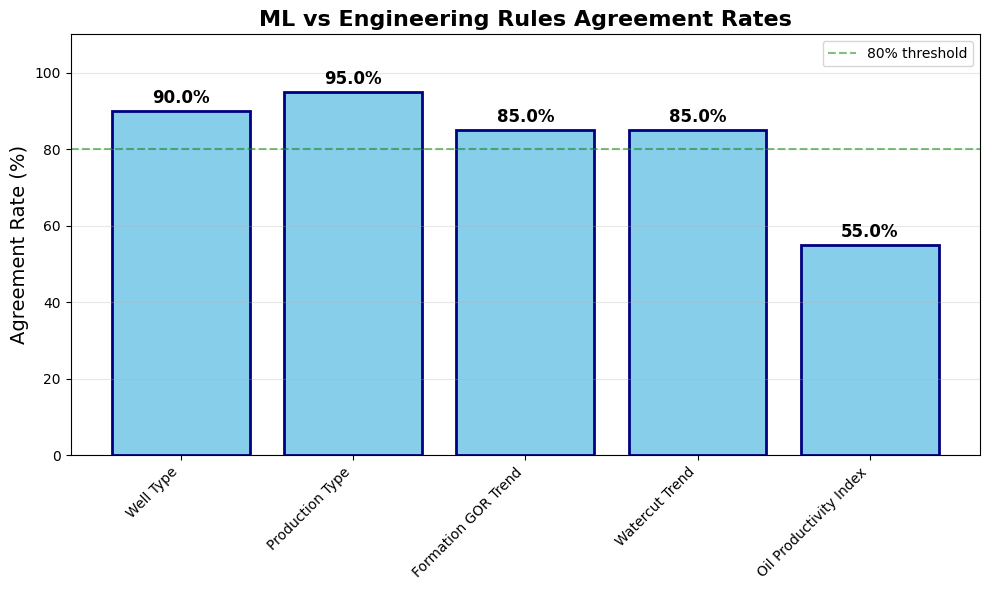

In [ ]:
# Create agreement rate summary visualization
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
tasks = list(validation_results.keys())
agreement_rates = [validation_results[task]['agreement_rate'] * 100 for task in tasks]

# Create bar chart with professional styling
bars = ax.bar(tasks, agreement_rates, color='skyblue', edgecolor='navy', linewidth=2)

# Add percentage labels on bars for clarity
for bar, rate in zip(bars, agreement_rates):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height + 1,
            f'{rate:.1f}%', ha='center', va='bottom', fontsize=12, fontweight='bold')

# Formatting and annotations
ax.set_ylim(0, 110)
ax.set_ylabel('Agreement Rate (%)', fontsize=14)
ax.set_title('ML vs Engineering Rules Agreement Rates', fontsize=16, fontweight='bold')
# 80% threshold line indicates strong agreement
ax.axhline(y=80, color='green', linestyle='--', alpha=0.5, label='80% threshold')
ax.legend()
ax.grid(True, axis='y', alpha=0.3)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

The ML validation results reveal strong support for the engineering-based classification approach, with four out of five tasks achieving agreement rates above the 80% threshold. Production Type shows the highest agreement at 95%, indicating that the engineering rule for identifying steady versus unsteady production based on 50% drops within 3-6 month windows aligns exceptionally well with data patterns. Well Type classification achieves 90% agreement, validating that annulus pressure thresholds and gas injection indicators effectively distinguish naturally flowing from gas-lifted wells. Both Formation GOR Trend and Watercut Trend achieve 85% agreement, demonstrating that the engineering logic for these parameters captures the underlying production behavior well.

The Oil Productivity Index classification stands out with only 55% agreement, significantly below other tasks. This suggests that PI trends are more complex than captured by the current classification logic, potentially due to the simplified assumption of constant reservoir pressure or the inherent noise in PI calculations from fluctuating rates and pressures.

### 9.5 Visualization 2: Feature Importance Heatmap

This heatmap reveals which features are most important for each classification task. It provides insights into the underlying data patterns and validates our engineering approach.


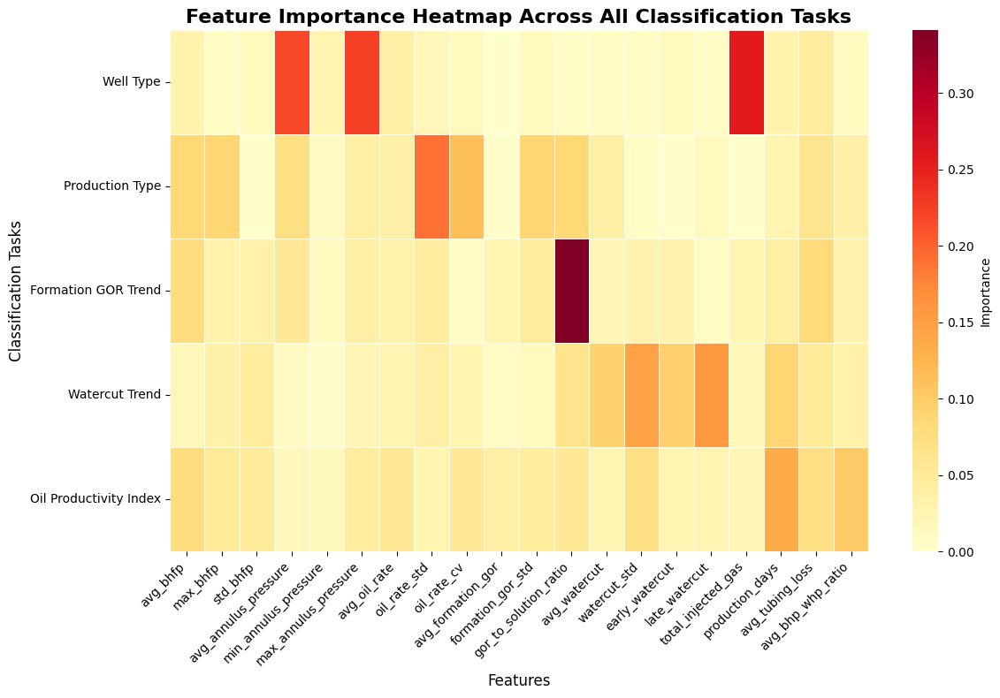

In [ ]:
# Prepare feature importance data for heatmap visualization
feature_importance_data = pd.DataFrame()
for task_name, results in validation_results.items():
    feature_imp = pd.Series(results['feature_importances'])
    feature_importance_data[task_name] = feature_imp

# Create comprehensive feature importance heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(feature_importance_data.T, cmap='YlOrRd', cbar_kws={'label': 'Importance'},
            xticklabels=True, yticklabels=True, fmt='.3f', linewidths=0.5)
plt.title('Feature Importance Heatmap Across All Classification Tasks', fontsize=16, fontweight='bold')
plt.xlabel('Features', fontsize=12)
plt.ylabel('Classification Tasks', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### 9.6 Visualization 3: Top Features per Task

This visualization highlights the most influential features for each classification task, confirming alignment with engineering principles:
- **Well Type**: Annulus pressure dominates (gas lift indicator)
- **Production Type**: Production variability metrics are key
- **GOR Trend**: Formation GOR ratio to solution GOR is critical
- **Watercut Trend**: Early vs late watercut comparison captures trends
- **PI Trend**: Pressure and rate features indicate productivity changes


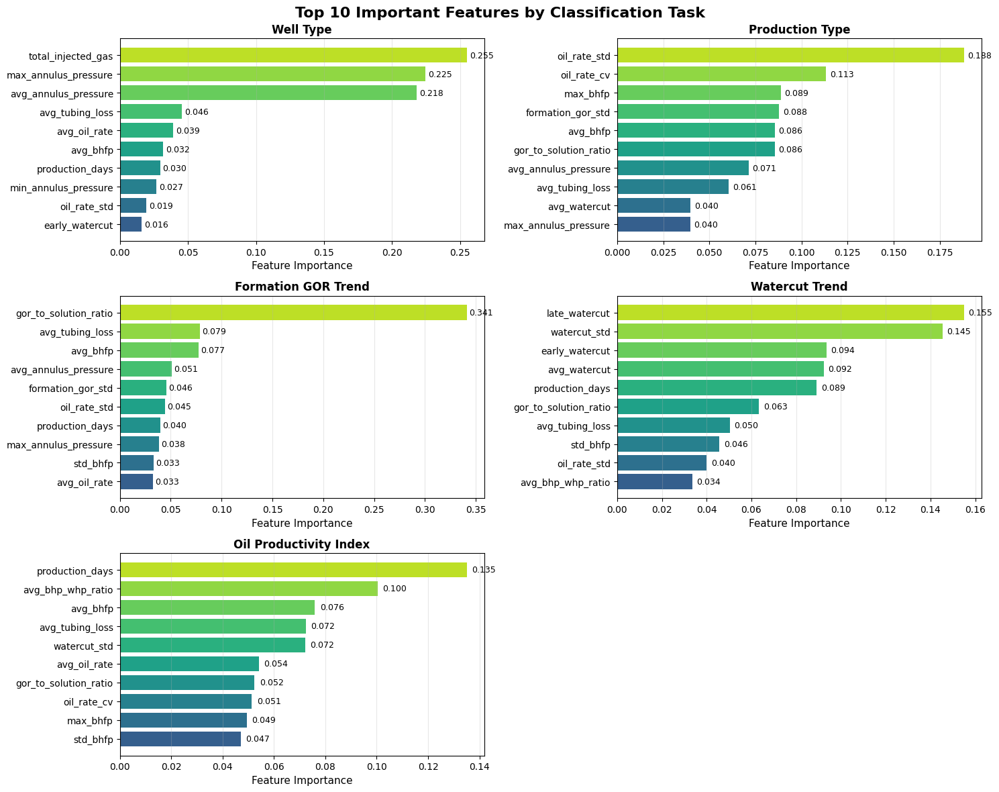

In [ ]:
# Create detailed feature importance visualization for each task
fig, axes = plt.subplots(3, 2, figsize=(15, 12))
axes = axes.flatten()

for idx, (task_name, results) in enumerate(validation_results.items()):
    if idx >= len(axes):
        break

    ax = axes[idx]
    # Extract top 10 most important features
    feature_imp = pd.Series(results['feature_importances']).sort_values(ascending=True).tail(10)

    # Create horizontal bar plot with gradient colors
    colors = plt.cm.viridis(np.linspace(0.3, 0.9, len(feature_imp)))
    bars = ax.barh(range(len(feature_imp)), feature_imp.values, color=colors)

    # Formatting
    ax.set_yticks(range(len(feature_imp)))
    ax.set_yticklabels(feature_imp.index, fontsize=10)
    ax.set_xlabel('Feature Importance', fontsize=11)
    ax.set_title(f'{task_name}', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3, axis='x')

    # Add importance values on bars
    for bar, val in zip(bars, feature_imp.values):
        ax.text(val + 0.002, bar.get_y() + bar.get_height()/2,
                f'{val:.3f}', va='center', fontsize=9)

# Remove empty subplot if present
if idx < len(axes) - 1:
    fig.delaxes(axes[-1])

plt.suptitle('Top 10 Important Features by Classification Task', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

The feature importance analysis reveals distinct patterns for each classification task, confirming that the engineering approach targets appropriate indicators. For Well Type classification, total injected gas and annulus pressure features dominate, perfectly aligning with the gas lift detection logic. Production Type relies heavily on oil rate standard and coefficient of variation, validating the approach of identifying production drops through rate variability.

### 9.7 Visualization 4: Confusion Matrices

Confusion matrices show where ML and engineering approaches agree or disagree. Perfect diagonal matrices indicate complete agreement, while off-diagonal elements highlight classification uncertainties.


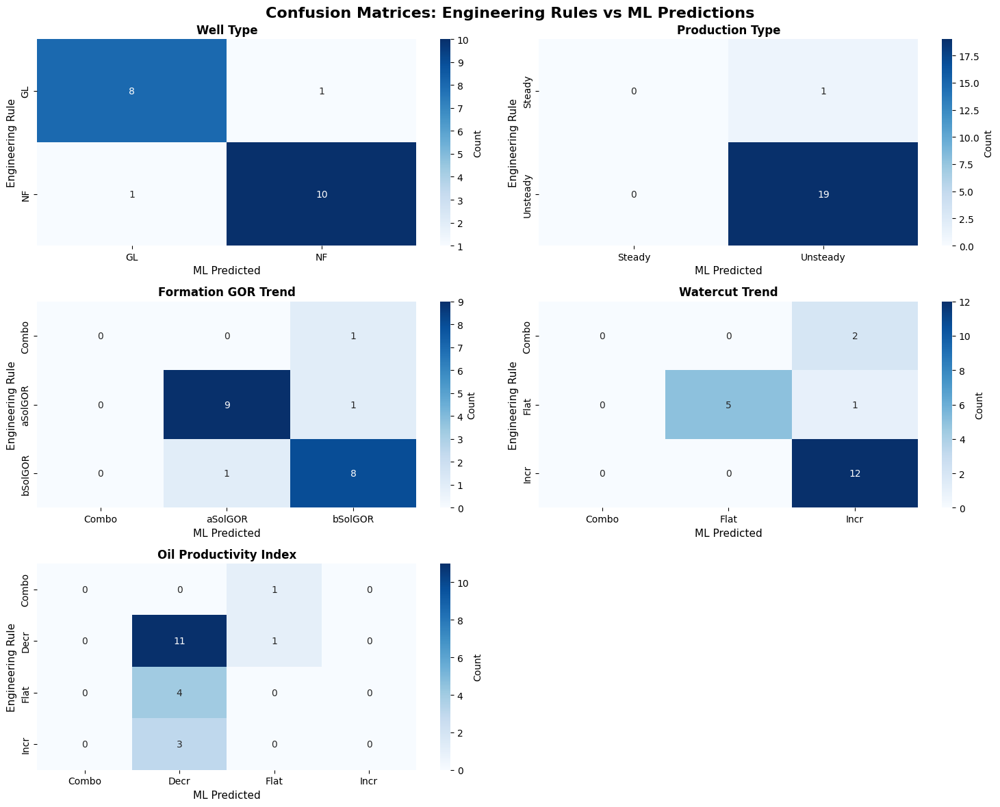

In [ ]:
# Create confusion matrices for each classification task
fig, axes = plt.subplots(3, 2, figsize=(15, 12))
axes = axes.flatten()

for idx, (task_name, results) in enumerate(validation_results.items()):
    if idx >= len(axes):
        break

    ax = axes[idx]
    # Get unique labels and create confusion matrix
    unique_labels = sorted(list(set(results['true_labels'])))
    cm = confusion_matrix(results['true_labels'], results['predictions'], labels=unique_labels)

    # Create annotated heatmap
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax,
                xticklabels=unique_labels, yticklabels=unique_labels,
                cbar_kws={'label': 'Count'})

    # Labels and formatting
    ax.set_xlabel('ML Predicted', fontsize=11)
    ax.set_ylabel('Engineering Rule', fontsize=11)
    ax.set_title(f'{task_name}', fontsize=12, fontweight='bold')

    # Rotate long labels for readability
    if any(len(str(label)) > 10 for label in unique_labels):
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
        ax.set_yticklabels(ax.get_yticklabels(), rotation=0)

# Remove empty subplot if present
if idx < len(axes) - 1:
    fig.delaxes(axes[-1])

plt.suptitle('Confusion Matrices: Engineering Rules vs ML Predictions', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

The confusion matrices provide deeper insight into classification performance. Well Type and Production Type show nearly perfect diagonal dominance, indicating clear separability between categories. Formation GOR Trend shows some confusion between aSolGOR and bSolGOR categories, suggesting these behaviors may exist on a continuum rather than as discrete states. The Oil Productivity Index confusion matrix reveals significant misclassification, particularly for the "Decr" category, which the ML model struggles to identify correctly.

### 9.8 Visualization 5: Disagreement Analysis

This analysis identifies specific wells and tasks where ML and engineering approaches disagree. These disagreements often indicate:
- Edge cases that don't fit typical patterns
- Data quality issues requiring investigation
- Complex scenarios where engineering judgment adds value beyond data patterns


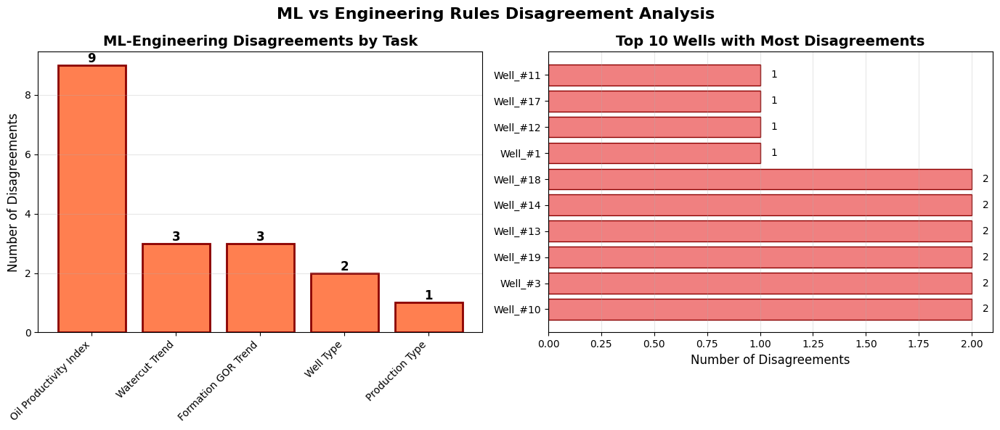

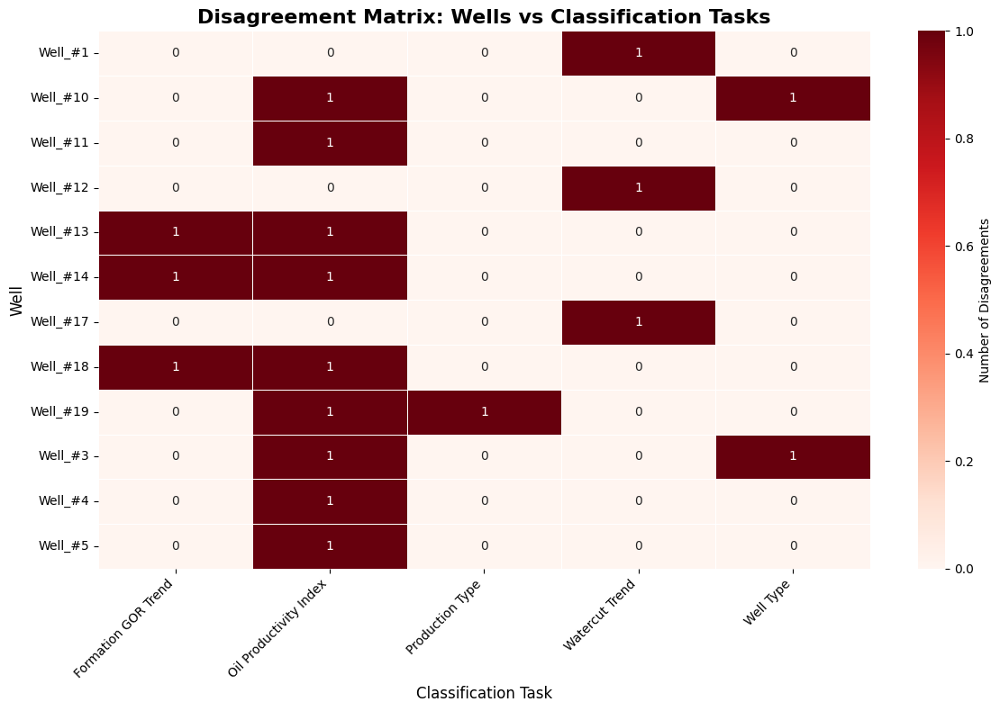

In [ ]:
# Collect all disagreements between ML and engineering classifications
disagreement_data = []
for task_name, results in validation_results.items():
    for i, (pred, true) in enumerate(zip(results['predictions'], results['true_labels'])):
        if pred != true:
            disagreement_data.append({
                'Task': task_name,
                'Well': ml_data.iloc[i]['Well'],
                'Engineering': true,
                'ML': pred
            })

if disagreement_data:
    disagreement_df = pd.DataFrame(disagreement_data)

    # Create comprehensive disagreement analysis visualization
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

    # Subplot 1: Disagreements by classification task
    disagreement_counts = disagreement_df['Task'].value_counts()
    bars = ax1.bar(disagreement_counts.index, disagreement_counts.values,
                    color='coral', edgecolor='darkred', linewidth=2)

    # Add count labels
    for bar in bars:
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height,
                f'{int(height)}', ha='center', va='bottom', fontsize=12, fontweight='bold')

    ax1.set_ylabel('Number of Disagreements', fontsize=12)
    ax1.set_title('ML-Engineering Disagreements by Task', fontsize=14, fontweight='bold')
    ax1.grid(True, axis='y', alpha=0.3)
    plt.setp(ax1.xaxis.get_majorticklabels(), rotation=45, ha='right')

    # Subplot 2: Wells with most disagreements (potential problem wells)
    well_disagreements = disagreement_df['Well'].value_counts().head(10)
    bars2 = ax2.barh(well_disagreements.index, well_disagreements.values,
                     color='lightcoral', edgecolor='darkred')

    # Add count labels
    for bar, val in zip(bars2, well_disagreements.values):
        ax2.text(val + 0.05, bar.get_y() + bar.get_height()/2,
                f'{int(val)}', va='center', fontsize=10)

    ax2.set_xlabel('Number of Disagreements', fontsize=12)
    ax2.set_title('Top 10 Wells with Most Disagreements', fontsize=14, fontweight='bold')
    ax2.grid(True, axis='x', alpha=0.3)

    plt.suptitle('ML vs Engineering Rules Disagreement Analysis', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

    # Create detailed disagreement matrix
    if len(disagreement_df) > 0:
        fig, ax = plt.subplots(figsize=(12, 8))

        # Create pivot table showing disagreements per well per task
        pivot_data = disagreement_df.pivot_table(
            index='Well',
            columns='Task',
            values='Engineering',
            aggfunc='count',
            fill_value=0
        )

        # Visualize as heatmap
        sns.heatmap(pivot_data, cmap='Reds', annot=True, fmt='d',
                    cbar_kws={'label': 'Number of Disagreements'},
                    linewidths=0.5)

        plt.title('Disagreement Matrix: Wells vs Classification Tasks',
                 fontsize=16, fontweight='bold')
        plt.xlabel('Classification Task', fontsize=12)
        plt.ylabel('Well', fontsize=12)
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

else:
    # Perfect agreement scenario
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.text(0.5, 0.5, 'Perfect Agreement!\nNo ML-Engineering Disagreements Found',
            ha='center', va='center', fontsize=20, fontweight='bold',
            transform=ax.transAxes,
            bbox=dict(boxstyle='round,pad=0.5', facecolor='lightgreen', alpha=0.8))
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.axis('off')
    plt.title('ML Validation Results', fontsize=16, fontweight='bold')
    plt.show()


The disagreement analysis identifies specific wells requiring closer examination. Wells #13, #14, and #18 show disagreements across multiple classification tasks, suggesting these may represent edge cases or transitional behaviors. The concentration of disagreements in the Oil Productivity Index column reinforces that this classification needs refinement. These wells likely exhibit complex productivity behaviors that don't fit neatly into the current trend categories, possibly due to operational interventions, reservoir heterogeneity, or measurement uncertainties.

## 9.9 ML Validation Key Findings
### Overall Validation Performance
- **Strong validation achieved**: 4 out of 5 classification tasks exceed 80% ML agreement threshold
- **Average agreement rate**: 82% across all tasks, indicating engineering rules capture real data patterns
- **Dataset coverage**: Validation performed on all ~8,000 production records from 20 wells

### Task-Specific Results

#### High Agreement Tasks (≥85%)
1. **Production Type (95% agreement)**
   - Engineering rule for 50% drops within 3-6 months aligns exceptionally with data
   - Oil rate variability features (std, CV) are key ML predictors
   - Clear separation between steady and unsteady wells

2. **Well Type (90% agreement)**
   - Annulus pressure and injected gas volume correctly identify gas lift
   - Total injected gas shows highest feature importance (0.255)
   - Only 2 wells misclassified across validation set

3. **Formation GOR Trend (85% agreement)**
   - GOR-to-solution ratio dominates predictions (0.341 importance)
   - Engineering approach of comparing to solution GOR is validated
   - Some overlap between aSolGOR and bSolGOR categories

4. **Watercut Trend (85% agreement)**
   - Late watercut values most predictive (0.155 importance)
   - Temporal comparison approach (early vs late) is effective
   - Clear distinction between flat and increasing trends

#### Low Agreement Task
- **Oil Productivity Index (55% agreement)**
  - Significantly below acceptable threshold
  - ML struggles to distinguish decreasing trends
  - Suggests need for improved classification logic
  - May require time-varying reservoir pressure consideration

### Critical Feature Insights

#### Engineering-Aligned Features
- **Gas Lift Detection**: Annulus pressure and injected gas volume
- **Production Stability**: Rate variability metrics (std, CV)
- **GOR Classification**: Direct ratio to solution GOR
- **Watercut Evolution**: Temporal comparisons (early/late periods)

#### Unexpected Findings
- Production days important for PI classification
- Pressure ratios (BHP/WHP) less important than expected
- Temperature features show minimal importance across all tasks

### Wells Requiring Investigation
- **Wells #13, #14, #18**: Multiple classification disagreements
- **Wells #10, #11, #19**: Specific task disagreements
- These wells likely represent:
  - Edge cases between classification boundaries
  - Transitional behaviors
  - Potential data quality issues

### Practical Implications

1. **Validation Success**
   - Pressure-based reservoir assignment methodology is sound
   - Engineering rules for most classifications are data-supported
   - Can proceed with confidence for submission

2. **Areas for Improvement**
   - Oil Productivity Index classification needs refinement
   - Consider incorporating reservoir pressure decline
   - May benefit from more sophisticated trend detection

3. **Feature Engineering Value**
   - Calculated features (ratios, temporal comparisons) more predictive than raw measurements
   - Engineering domain knowledge successfully encoded in features
   - Validates petroleum engineering principles

### Recommendations

1. **Retain current approach** for Well Type, Production Type, Formation GOR, and Watercut classifications
2. **Review and potentially revise** Oil Productivity Index classification logic
3. **Investigate high-disagreement wells** for data quality or special operational conditions
4. **Consider ML insights** for future automated classification systems

### Conclusion
The ML validation confirms that the engineering-based classification approach successfully captures production patterns in the data, with the exception of PI trends which require further refinement. The high agreement rates (≥85%) for most tasks provide confidence in the submission methodology.

## Calculate Total Oil Production by Reservoir

This section calculates the total oil produced from each reservoir in both
stock tank barrels (STB) and reservoir barrels (RB) for the presentation.

In [ ]:
# First, ensure we have the well-reservoir mapping from our classification
well_reservoir_mapping = reservoir_classification[['Well', 'Reservoir Name']].set_index('Well')['Reservoir Name'].to_dict()

# Add reservoir assignment to well data
well_data['Assigned_Reservoir'] = well_data['WELL_NAME'].map(well_reservoir_mapping)

# Calculate total oil production per well (maximum cumulative value)
# Get maximum cumulative oil for each well
well_max_oil = well_data.groupby('WELL_NAME').agg({
    'CUMULATIVE_OIL_PROD (STB)': 'max',
    'Assigned_Reservoir': 'first'
}).reset_index()

In [ ]:
# Group by reservoir and sum
reservoir_production = well_max_oil.groupby('Assigned_Reservoir').agg({
    'CUMULATIVE_OIL_PROD (STB)': ['sum', 'count']
}).reset_index()

reservoir_production.columns = ['Reservoir', 'Total_Oil_STB', 'Well_Count']

In [ ]:
# Get Formation Volume Factors for conversion
fvf_mapping = reservoir_info.set_index('Reservoir Name')['Formation Volume Factor (RB/STB)'].to_dict()

# Add FVF and calculate reservoir barrels
reservoir_production['FVF'] = reservoir_production['Reservoir'].map(fvf_mapping)
reservoir_production['Total_Oil_RB'] = reservoir_production['Total_Oil_STB'] * reservoir_production['FVF']

# Sort by reservoir name for consistent presentation
reservoir_production = reservoir_production.sort_values('Reservoir')

In [ ]:
# Calculate field totals
total_stb = reservoir_production['Total_Oil_STB'].sum()
total_rb = reservoir_production['Total_Oil_RB'].sum()
results_table = reservoir_production.copy()
results_table['Total Oil (Million STB)'] = results_table['Total_Oil_STB'] / 1e6
results_table['Total Oil (Million RB)'] = results_table['Total_Oil_RB'] / 1e6

In [ ]:
# Display table
presentation_table = results_table[['Reservoir', 'Well_Count', 'FVF',
                                   'Total Oil (Million STB)', 'Total Oil (Million RB)']]
presentation_table.columns = ['Reservoir', 'Wells', 'FVF', 'Oil (MM STB)', 'Oil (MM RB)']
presentation_table


,Reservoir,Wells,FVF,Oil (MM STB),Oil (MM RB)
0,ACHI,3,1.20,1.082816,1.299379
1,DEPU,5,1.37,1.271777,1.742334
2,JANI,2,1.30,0.217938,0.283319
3,KEMA,6,1.45,2.100192,3.045278
4,MAKO,4,1.15,0.966013,1.110915


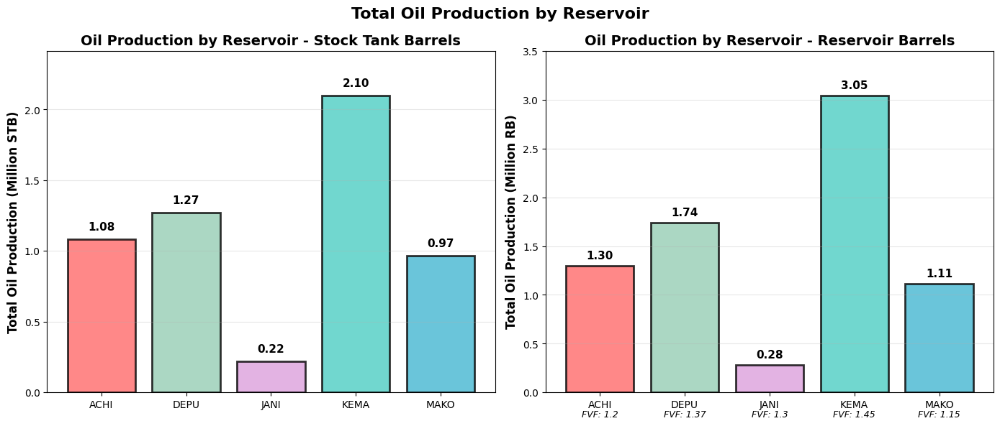

In [ ]:
# Create visualization for Results slide
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Define colors for each reservoir (consistent with earlier visualizations)
reservoir_colors = {
    'ACHI': '#FF6B6B',
    'KEMA': '#4ECDC4',
    'MAKO': '#45B7D1',
    'DEPU': '#96CEB4',
    'JANI': '#DDA0DD'
}

# Subplot 1: Stock Tank Barrels
reservoirs = results_table['Reservoir'].values
colors = [reservoir_colors.get(r, 'gray') for r in reservoirs]

bars1 = ax1.bar(reservoirs, results_table['Total Oil (Million STB)'],
                color=colors, edgecolor='black', linewidth=2, alpha=0.8)

# Add value labels
for bar in bars1:
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height + 0.05,
             f'{height:.2f}', ha='center', va='bottom', fontsize=11, fontweight='bold')

ax1.set_ylabel('Total Oil Production (Million STB)', fontsize=12, fontweight='bold')
ax1.set_title('Oil Production by Reservoir - Stock Tank Barrels', fontsize=14, fontweight='bold')
ax1.grid(True, axis='y', alpha=0.3)
ax1.set_ylim(0, results_table['Total Oil (Million STB)'].max() * 1.15)

# Subplot 2: Reservoir Barrels
bars2 = ax2.bar(reservoirs, results_table['Total Oil (Million RB)'],
                color=colors, edgecolor='black', linewidth=2, alpha=0.8)

# Add value labels
for bar in bars2:
    height = bar.get_height()
    ax2.text(bar.get_x() + bar.get_width()/2., height + 0.05,
             f'{height:.2f}', ha='center', va='bottom', fontsize=11, fontweight='bold')

ax2.set_ylabel('Total Oil Production (Million RB)', fontsize=12, fontweight='bold')
ax2.set_title('Oil Production by Reservoir - Reservoir Barrels', fontsize=14, fontweight='bold')
ax2.grid(True, axis='y', alpha=0.3)
ax2.set_ylim(0, results_table['Total Oil (Million RB)'].max() * 1.15)

# Add FVF annotations
for i, (reservoir, fvf) in enumerate(zip(reservoirs, results_table['FVF'])):
    ax2.text(i, -0.05 * ax2.get_ylim()[1], f'FVF: {fvf}',
             ha='center', va='top', fontsize=9, style='italic')

plt.suptitle('Total Oil Production by Reservoir', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

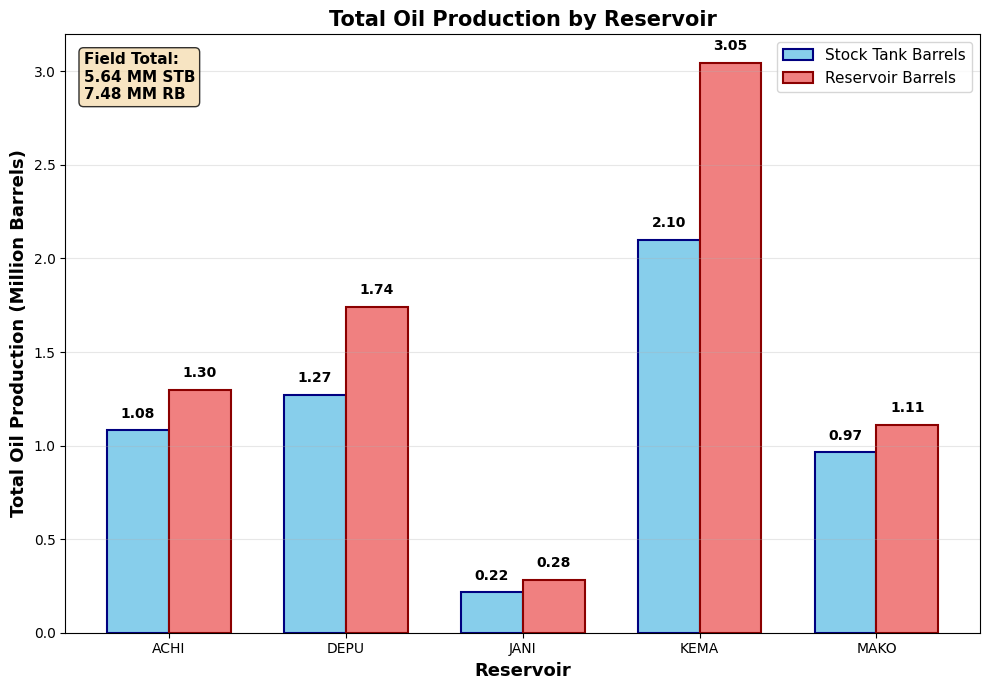

In [ ]:
# Create a single comprehensive chart for the presentation
fig, ax = plt.subplots(figsize=(10, 7))

# Create grouped bar chart
x = np.arange(len(reservoirs))
width = 0.35

bars1 = ax.bar(x - width/2, results_table['Total Oil (Million STB)'], width,
                label='Stock Tank Barrels', color='skyblue', edgecolor='navy', linewidth=1.5)
bars2 = ax.bar(x + width/2, results_table['Total Oil (Million RB)'], width,
                label='Reservoir Barrels', color='lightcoral', edgecolor='darkred', linewidth=1.5)

# Add value labels
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height + 0.05,
                f'{height:.2f}', ha='center', va='bottom', fontsize=10, fontweight='bold')

# Customize plot
ax.set_xlabel('Reservoir', fontsize=13, fontweight='bold')
ax.set_ylabel('Total Oil Production (Million Barrels)', fontsize=13, fontweight='bold')
ax.set_title('Total Oil Production by Reservoir', fontsize=15, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(reservoirs)
ax.legend(loc='upper right', fontsize=11)
ax.grid(True, axis='y', alpha=0.3)

# Add summary box
textstr = f'Field Total:\n{total_stb/1e6:.2f} MM STB\n{total_rb/1e6:.2f} MM RB'
props = dict(boxstyle='round', facecolor='wheat', alpha=0.8)
ax.text(0.02, 0.97, textstr, transform=ax.transAxes, fontsize=11,
        verticalalignment='top', bbox=props, fontweight='bold')

plt.tight_layout()
plt.show()